# Stability Analysis VCF Comparison

## Table Of Contents

---
### [Step 1 - Initialization](#Step-1--Initialization)
<ol>
 <li>Imported Libraries</li>
 <li>Common Functions</li>
</ol>

### [Step 2 - Reading Files](#Step-2--Reading-Files)
<ol>
 <li>Reading CSV File (SNPs) (export <strong>'Export Sheet'</strong> as .csv <a href="https://docs.google.com/spreadsheets/d/1mDAMd1wk54RlQFEqKvuIQAwg_ajwCjZA7q2Lwkwx7Mo/edit?usp=sharing">from here</a>) </li>
 <li>Reading CSV File (Indels) (export <strong>'Export Sheet'</strong> as .csv <a href="https://docs.google.com/spreadsheets/d/1JVHZlCrh5VafV3JtbeXTsRFjU8ZLvkJmENCgq4hQdgA/edit?usp=sharing">from here</a>) </li>
 <li>Reading all SNP VCF files from Google Drive (<a href="https://drive.google.com/drive/folders/1zdC_THQvRqXscc-scfM78cm8sCOADIjx?usp=sharing">download files from here</a>)</li>
    <li>Reading all Indel VCF files from Google Drive (<a href="https://drive.google.com/drive/folders/1zdC_THQvRqXscc-scfM78cm8sCOADIjx?usp=sharing">download files from here</a>)</li>
 <li>Reading High Confidence VCF's</li>
 <li>Reading Paper Validated VCF's</li>
 <li>Plotting the intersection variants of High Confidence and Paper Validated VCF's</li>
</ol>

### [Step 3 - Filtering VCFs](#Step-3--Filtering-VCFs)
<ol>
 <li>Filtering each generated VCF (SNPs)</li>
 <li>Filtering each generated VCF (Indels)</li>
 <li>Plotting Length counts of VCF's after each filtering steps(SNPs-Indels)</li>
</ol>

### [Step 4 - Matching Features](#Step-4--Matching-Features)
<ol>
 <li>Matching VCFs files with CSV file properties using the 'TestCaseNo' column (SNPs) </li>
 <li>Plotting All Variant Counts based on their 'Variant Callers' and 'Centers' (SNPs) </li>
 <li>Plotting All Variant Counts based on their 'Mapper, Variant Callers' and 'Centers' (SNPs)</li>
 <li>Matching VCFs files with CSV file properties using the 'TestCaseNo' column (Indels) </li>
 <li>Plotting All Variant Counts based on their 'Variant Callers' and 'Centers' (Indels) </li>
 <li>Plotting All Variant Counts based on their 'Mapper, Variant Callers' and 'Centers' (Indels)</li>

</ol>

### [Step 5 -  Execution Time Analysis](#Step-5--Execution-Time-Analysis)
<ol>
 <li>Plotting execution times</li>
</ol>

### [Step 6 -  Heatmaps](#Step-6--Heatmaps)
<ol>
 <li>Heatmap between Generated VCFs with Intersection / Union. (SNPs)</li>
 <li>Heatmap between Generated VCFs with Intersection / Union. (Indels)</li>
 <li>Plotting Heatmap with cluster</li>
</ol>

### [Step 7 - Mean of Intersection/Union](#Step-7--Mean-of-Intersection/Union)
<ol>
 <li>Visualizing Mean Intersection/Union Values (SNPs)</li>
 <li>Visualizing Mean Intersection/Union Values (Indels)</li>
</ol>

### [Step 8 - Recall / Precision / F1-Score](#Step-8--Recall-/-Precision-/-F1-Score)
<ol>
 <li>Calculation of Inter/Union, Precision, Recall, f1_score</li>
 <li>Scatter Plot of Precision vs. Recall, Grouped by Centers, and Differentiated by Mapper and Variant Caller</li>
 <li>Scatter Plot of Precision vs. Recall, Grouped by Centers, and Differentiated by Mapper, Variant Caller, baseRecalibration and isTrimmed</li>
</ol>

### [Step 9 - ANOVA calculation for SNPs](#Step-9--ANOVA-calculation-for-SNPs)
<ol>
 <li>Creating ANOVA-model dataframe</li>
 <li>Plotting ANOVA combinations of 7 independent variables that affect the result by more than 1%</li>
</ol>

### [Step 10 - ANOVA calculation for SNPs](#Step-10--Cancer-Gene-Census-(CGC))
<ol>
 <li>Creating ANOVA-model dataframe</li>
 <li>Plotting ANOVA combinations of 7 independent variables that affect the result by more than 1%</li>
</ol>


### TODO:
<ol>
 <li>Calculation for Step 8 and 9 for Indels. </li>
</ol>

## Step 1- Initialization 

### Imported Libraries

In [1]:
import os
import allel
import numpy as np
import matplotlib.pyplot as plt
import random
import community
from numpy import linalg as LA
from tqdm import tqdm
import pandas as pd
from scipy import stats, interpolate
import time
import seaborn as sns
import matplotlib.colors
import math
import scipy.io as sio
from skimage import data, segmentation, color
from skimage.future import graph
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted, venn3, venn3_circles
from matplotlib import pyplot as plt, lines as Line2D
from xgboost import XGBClassifier, XGBRegressor, plot_importance
from venn import pseudovenn, venn
import plotly.io as pio
import sys
print(sys.executable)
import pingouin as pg #!pip install pingouin
from scipy.stats import ttest_rel
from matplotlib.patches import PathPatch
import statsmodels.api as sm
from statsmodels.formula.api import ols
!pip install pysam
import matplotlib.colors as mcolors
import itertools


/opt/miniconda3/envs/mywork2_rebuild_env/bin/python


In [2]:
#!conda install -c conda-forge py-xgboost-cpu -y
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
!pip install -U seaborn
!pip install seaborn --upgrade

### Common Funtions

In [4]:
#Deleting indels from VCF
def remove_indels(t):
    t = t[t["REF"].apply(len) == 1 ]
    t = t[t["ALT_1"].apply(len) == 1]
    return t 

#Apply Filters
def filtersControl(key,df,VCName):
    df = df.copy()
    df = df if VCName == 'SomaticSniper' else df[df['FILTER_PASS'].astype("bool")== True]
    df = df[df['is_snp'].astype("bool")==True]
    return df

#Jaccard Similarity function for two sets ( int / )
def js_set(s1, s2):
    intersection = len(list(set(s1).intersection(s2)))
    union = uni(s1,s2)
    if union == 0:
        return 0;
    return np.float64(round((float(intersection) / union) * 100) / 100);

#The intersection of two sets is the set of all the common elements of both the sets. 
def intersec(s1,s2):
    return len(s1.intersection(s2))

#The union of two sets is the set of all the elements of both the sets without duplicates.
def uni(s1,s2):
    return len(s1.union(s2))

#The difference between two sets is the set of all the elements in first set that are not present in the second set. 
def dif(s1,s2):
    return len(s1.difference(s2))

#Percentage of intersects:
def percentage_intersects(intersection,count):
    return np.float64(round((float(intersection) / count) * 100) / 100);

def intersection_over_union(set1, set2):
    intersection_cardinality = len(set.intersection(*[set(set1), set(set2)]))
    union_cardinality = len(set.union(*[set(set1), set(set2)]))
    if union_cardinality == 0:
        return 0
    else:
        return intersection_cardinality / float(union_cardinality)

#intersection/union:
#def inter_union(s1,s2):
#    return np.float64(round((float(intersec(s1,s2) / uni(s1,s2))) * 100) / 100);
def inter_union(s1, s2):
    intersection = len(s1.intersection(s2))
    union = len(s1.union(s2))
    return round(intersection / union, 2)

# Get True Positives
def get_true_pos(pred, real):
    return len(pred & real);

# Get False Positives
def get_false_pos(pred, real):
    return len(pred - real);

# Get False Negatives
def get_false_neg(pred, real):
    return len(real - pred);

# Get TruePositive/FalsePositive
def get_precision(pred, real):
    tp = get_true_pos(pred, real) 
    fp = get_false_pos(pred, real) 
    return (1.0 * tp) / (tp + fp);

# Get TruePositive/FalseNegative
def get_recall(pred, real):
    tp = get_true_pos(pred, real)
    fn = get_false_neg(pred, real)
    return (1.0 * tp) / (tp + fn);

# Get TruePositive/FalseNegative
def get_f1score(pred, real):
    p = get_precision(pred,real)
    r = get_recall(pred, real)
    
    if(p + r == 0 ):
        return 0
    else:
        return (2.0 * ((p * r)/(p + r)));

def calculate_frequency(d):
    frequency = {}
    for key, values in tqdm(d.items()):
        for value in values:
            if (key, value) in frequency:
                frequency[(key, value)] += 1
            else:
                frequency[(key, value)] = 1
    return frequency

def create_dataframe(frequency_dict):
    df = pd.DataFrame(columns=["id", "list_item", "frequency"])
    for (key, value), freq in tqdm(frequency_dict.items()):
        df = df.append({"id": key, "list_item": value, "frequency": freq}, ignore_index=True)
    return df

def adjust_box_widths(g, fac):
    """
    Adjust the withs of a seaborn-generated boxplot.
    """

    # iterating through Axes instances
    for ax in g.axes:

        # iterating through axes artists:
        for c in ax.get_children():

            # searching for PathPatches
            if isinstance(c, PathPatch):
                # getting current width of box:
                p = c.get_path()
                verts = p.vertices
                verts_sub = verts[:-1]
                xmin = np.min(verts_sub[:, 0])
                xmax = np.max(verts_sub[:, 0])
                xmid = 0.5*(xmin+xmax)
                xhalf = 0.5*(xmax - xmin)

                # setting new width of box
                xmin_new = xmid-fac*xhalf
                xmax_new = xmid+fac*xhalf
                verts_sub[verts_sub[:, 0] == xmin, 0] = xmin_new
                verts_sub[verts_sub[:, 0] == xmax, 0] = xmax_new

                # setting new width of median line
                for l in ax.lines:
                    if np.all(l.get_xdata() == [xmin, xmax]):
                        l.set_xdata([xmin_new, xmax_new])

## Step 2- Reading Files

### 1- Reading CSV File (SNPs)

In [5]:
#headerList=["TestCaseNo","phase","Sample","operatingSystem","Environment","isTrimmed","baseRecalibration","Mapper","M_Version","VariantCaller","VC_Version","ReferenceGenom","Duplicates","VariantFilter","FilterPass","SOMATICfilter","remove_indels","Sort","FileLink","Result VCF Count","Author"]
csv_file_df = pd.read_csv('vcf/TestCases.csv')
csv_file_df.head()

,TestCaseNo,phase,Sample,operatingSystem,HOW,isTrimmed,baseRecalibration,Mapper,M_Version,Variant Caller,VC_Version,ReferenceGenom,Duplicates,Variant Filter,FilterPass,SOMATICfilter,remove_indels,Sort,File Link,Result VCF Count,Kim yaptı :),Slurm_id,Donanım,ElapsedTime
0,TestCase 1,notReady,LL,Linux,Local,YES,YES,BWA,NaN,Mutect,NaN,hg19,MARK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GAMZE,NaN,NaN,NaN
1,TestCase 2,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/11CFGjN...,NaN,GUL EDA,29812.0,a047,07:15:00
2,TestCase 3,notReady,LL,NaN,Uhem + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg19,MARK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GÜL EDA,NaN,NaN,NaN
3,TestCase 4,notReady,LL,MAC,Local,YES,YES,BWA,NaN,Mutect,NaN,hg19,MARK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GAMZE,NaN,NaN,NaN
4,TestCase 5,notReady,LL,NaN,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg19,MARK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GÜL EDA,NaN,NaN,NaN


### 2- Reading CSV File (Indels)

In [6]:
csv_file_df_indels = pd.read_csv('vcf/TestCases_Indels.csv')
csv_file_df_indels.head()

,IDs,phase,Sample,HOW,isTrimmed,baseRecalibration,Mapper,Variant Caller,Duplicates,File Link,Result VCF Count,Kim yaptı :),Notes:
0,TestCase 1,done,LL,Uhem + COSAP,yes,yes,BWA,Mutect,MARK,https://drive.google.com/drive/folders/1wBcuLv...,NaN,Gül Eda,NaN
1,TestCase 2,done,LL,Uhem + COSAP,yes,yes,BWA,Strelka,MARK,https://drive.google.com/drive/folders/1IpGEQ-...,NaN,Gül Eda,NaN
2,TestCase 3,done,LL,Uhem + COSAP,yes,yes,Bowtie,Mutect,MARK,https://drive.google.com/drive/folders/1d4D9UC...,NaN,Gül Eda,NaN
3,TestCase 4,done,LL,Uhem + COSAP,yes,yes,Bowtie,Strelka,MARK,https://drive.google.com/drive/folders/1Ei63_F...,NaN,Gül Eda,NaN
4,TestCase 5,done,LL,Uhem + COSAP,yes,no,BWA,Mutect,MARK,https://drive.google.com/drive/folders/1UB4I9T...,NaN,Gül Eda,NaN


### 3- Reading SNP VCF files from Google Drive

In [7]:
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
vcf_csv = os.path.join(save_path, "vcf_filenames.csv")

if os.path.exists(vcf_csv):
    df = pd.read_csv(vcf_csv)
    vcf_filenames = dict(zip(df.testcase.astype(str), df.filepath))
    print("🎉 Cache yüklendi.")
else:
    base = "vcf/TESTCASES_bedded"
    vcf_filenames = {}
    for root, _, files in os.walk(base):
        for fn in files:
            if not fn.endswith(".vcf") or fn in {".DS_Store", "fixed.recode.vcf", "gatk.recode.vcf"}:
                continue
            # klasör adı örn. "TestCase 296"
            folder = os.path.basename(root)
            # eğer "TestCase " ile başlıyorsa, sadece numarayı al
            if folder.lower().startswith("testcase "):
                key = folder[len("TestCase "):]
            else:
                key = folder
            vcf_filenames[key] = os.path.join(root, fn)
    pd.DataFrame({
        "testcase": list(vcf_filenames.keys()),
        "filepath": list(vcf_filenames.values())
    }).to_csv(vcf_csv, index=False)
    print(f"✅ Cache kaydedildi: {vcf_csv}")

print("Total file count:", len(vcf_filenames))


🎉 Cache yüklendi.
Total file count: 480


In [8]:
vcf_filenames

{'296': 'vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf',
 '606': 'vcf/TESTCASES_bedded/TestCase 606/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf',
 '262': 'vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf',
 '853': 'vcf/TESTCASES_bedded/TestCase 853/snp_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf',
 '639': 'vcf/TESTCASES_bedded/TestCase 639/snp_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf',
 '601': 'vcf/TESTCASES_bedded/TestCase 601/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf',
 '854': 'vcf/TESTCASES_bedded/TestCase 854/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf',
 '637': 'vcf/TESTCASES_bedded/TestCase 637/snp_SRR7890880_bwa2

In [9]:
vcfcomp_csv            = os.path.join(save_path, "vcfcomparison_df.csv")
vcfcomp_full_csv       = os.path.join(save_path, "vcfcomparison_df_full.csv")

if os.path.exists(vcfcomp_csv) and os.path.exists(vcfcomp_full_csv):
    vcfcomparison_df       = pd.read_csv(vcfcomp_csv)
    vcfcomparison_df_full  = pd.read_csv(vcfcomp_full_csv)
    print("🎉 vcfcomparison cache yüklendi, hesaplamalar atlandı.")
else:
    vcfcomparison_df = pd.DataFrame(
        columns=["TestCase","data","mapper","variantCaller","VCFLength"]
    )
    vcfcomparison_df_full = pd.DataFrame(
        columns=[
            "TestCaseNo","phase","Sample","operatingSystem","Environment",
            "isTrimmed","baseRecalibration","Mapper","M_Version","VariantCaller",
            "VC_Version","ReferenceGenom","Duplicates","VariantFilter",
            "FilterPass","SOMATICfilter","remove_indels","Sort","FileLink",
            "Result VCF Count","Author","Slurm_id","Node","ElapsedTime"
        ]
    )

    for idx, row in csv_file_df.iterrows():
        for key, path in vcf_filenames.items():
            if int(key) - 1 == idx:
                vcfcomparison_df.loc[len(vcfcomparison_df)] = [
                    key, row[2], row[7], row[9], "0"
                ]
                vcfcomparison_df_full.loc[len(vcfcomparison_df_full)] = [
                    row[0], row[1], row[2], row[3], row[4], row[5], row[6],
                    row[7], row[8], row[9], row[10], row[11], row[12],
                    row[13], row[14], row[15], row[16], row[17], row[18],
                    "0", row[20], row[21], row[22], row[23]
                ]

    vcfcomparison_df.to_csv(vcfcomp_csv, index=False)
    vcfcomparison_df_full.to_csv(vcfcomp_full_csv, index=False)
    print(f"✅ vcfcomparison_df → {vcfcomp_csv}")
    print(f"✅ vcfcomparison_df_full → {vcfcomp_full_csv}")

🎉 vcfcomparison cache yüklendi, hesaplamalar atlandı.


In [10]:
vcfcomparison_df_full

,TestCaseNo,phase,Sample,operatingSystem,Environment,isTrimmed,baseRecalibration,Mapper,M_Version,VariantCaller,VC_Version,ReferenceGenom,Duplicates,VariantFilter,FilterPass,SOMATICfilter,remove_indels,TMB,FileLink,Result VCF Count,Author,Slurm_id,Node,ElapsedTime
0,TestCase 2,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.613695,https://drive.google.com/drive/folders/11CFGjN...,1261,GUL EDA,29812.0,a047,07:15:00
1,TestCase 8,done,EA,Linux,Altay + COSAP,NO,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.799425,https://drive.google.com/drive/folders/1I7r5au...,1276,GUL EDA,29812.0,a047,06:12:47
2,TestCase 14,done,EA,Linux,Altay + COSAP,YES,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,16.009919,https://drive.google.com/drive/folders/1AN-msy...,1293,GUL EDA,29812.0,a047,05:48:51
3,TestCase 20,done,EA,Linux,Altay + COSAP,NO,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.316527,https://drive.google.com/drive/folders/1hhxI84...,1237,GUL EDA,29812.0,a047,07:44:08
4,TestCase 26,done,EA,Linux,Altay + COSAP,YES,YES,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.397318,https://drive.google.com/drive/folders/1sxq7kO...,1082,GUL EDA,29811.0,a078,07:36:41
5,TestCase 32,done,EA,Linux,Altay + COSAP,NO,NO,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.545902,https://drive.google.com/drive/folders/1aU_EFn...,1094,GUL EDA,29811.0,a078,09:57:30
6,TestCase 38,done,EA,Linux,Altay + COSAP,YES,NO,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.830688,https://drive.google.com/drive/folders/1Zi72RD...,1117,GUL EDA,29811.0,a078,06:05:48
7,TestCase 44,done,EA,Linux,Altay + COSAP,NO,YES,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.310644,https://drive.google.com/drive/folders/1L-ZfgL...,1075,GUL EDA,29811.0,a078,10:37:11
8,TestCase 50,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Strelka,NaN,hg38,MARK,NaN,NaN,NaN,NaN,23.711520,https://drive.google.com/drive/folders/1RmzNj5...,1915,GUL EDA,29813.0,a063,03:34:43
9,TestCase 56,done,EA,Linux,Altay + COSAP,NO,NO,BWA,NaN,Strelka,NaN,hg38,MARK,NaN,NaN,NaN,NaN,27.797578,https://drive.google.com/drive/folders/1UAhDec...,2245,GUL EDA,29813.0,a063,01:39:41


### 4- Reading Indel VCF files from Google Drive

In [11]:
vcf_indels_csv = os.path.join(save_path, "vcf_filenames_indels.csv")

if os.path.exists(vcf_indels_csv):
    df_indels = pd.read_csv(vcf_indels_csv)
    vcf_filenames_indels = dict(zip(df_indels.testcase, df_indels.filepath))
    print("🎉 Indel cache yüklendi.")
else:
    base = "vcf/TESTCASES_bedded_indels"
    vcf_filenames_indels = {}
    for root, _, files in os.walk(base):
        for fn in files:
            if not fn.endswith(".vcf") or fn in {".DS_Store", "fixed.recode.vcf", "gatk.recode.vcf"}:
                continue
            folder = os.path.basename(root)               # örn. "TestCase 123"
            if folder.lower().startswith("testcase "):
                key = folder[len("TestCase "):]           # sadece "123"
            else:
                key = folder
            vcf_filenames_indels[key] = os.path.join(root, fn)

    pd.DataFrame({
        "testcase": list(vcf_filenames_indels.keys()),
        "filepath": list(vcf_filenames_indels.values())
    }).to_csv(vcf_indels_csv, index=False)
    print(f"✅ Indel cache kaydedildi: {vcf_indels_csv}")

print("Total file count (indels):", len(vcf_filenames_indels))

🎉 Indel cache yüklendi.
Total file count (indels): 320


In [12]:
indels_csv      = os.path.join(save_path, "vcfcomparison_indels.csv")
indels_full_csv = os.path.join(save_path, "vcfcomparison_full_indels.csv")

if os.path.exists(indels_csv) and os.path.exists(indels_full_csv):
    vcfcomparison_df_indels       = pd.read_csv(indels_csv)
    vcfcomparison_df_full_indels  = pd.read_csv(indels_full_csv)
    print("🎉 Indel comparison cache yüklendi.")
else:

    vcfcomparison_df_indels = pd.DataFrame(
        columns=["TestCase", "data", "mapper", "variantCaller", "VCFLength"]
    )
    vcfcomparison_df_full_indels = pd.DataFrame(
        columns=[
            "TestCaseNo", "phase", "Sample", "Environment",
            "isTrimmed", "baseRecalibration", "Mapper",
            "VariantCaller", "Duplicates", "FileLink",
            "Result VCF Count", "Author"
        ]
    )

    for idx, row in csv_file_df_indels.iterrows():
        for key in vcf_filenames_indels:
            if int(key) - 1 == idx:
                vcfcomparison_df_indels.loc[len(vcfcomparison_df_indels)] = [
                    key,
                    row[2],
                    row[6],
                    row[7],
                    "0"
                ]
                vcfcomparison_df_full_indels.loc[len(vcfcomparison_df_full_indels)] = [
                    row[0],  # TestCaseNo
                    row[1],  # phase
                    row[2],  # Sample
                    row[3],  # Environment
                    row[4],  # isTrimmed
                    row[5],  # baseRecalibration
                    row[6],  # Mapper
                    row[7],  # VariantCaller
                    row[8],  # Duplicates
                    row[9],  # FileLink
                    "0",     # Result VCF Count
                    row[11]  # Author
                ]
    vcfcomparison_df_indels.to_csv(indels_csv, index=False)
    vcfcomparison_df_full_indels.to_csv(indels_full_csv, index=False)
    print(f"✅ Indel comparison verisi kaydedildi: {indels_csv}")
    print(f"✅ Indel comparison full verisi kaydedildi: {indels_full_csv}")

🎉 Indel comparison cache yüklendi.


### 5- Reading High Confidence VCF's

In [13]:
categories = ['LL', 'NC', 'EA', 'IL', 'FD']
all_filenames = {}

# 1) Validated VCF dosya eşlemelerini yükle veya oluştur
for cat in categories:
    files_csv = os.path.join(save_path, f"validated_vcfs_{cat}_files.csv")
    if os.path.exists(files_csv):
        df_files = pd.read_csv(files_csv)
        all_filenames[cat] = dict(zip(df_files.testcase.astype(str), df_files.filepath))
    else:
        prefix = f"vcf/validated_vcfs/{cat}/"
        fnames = {}
        for root, _, files in os.walk(prefix):
            for fn in files:
                if fn == ".DS_Store":
                    continue
                key = root[len(prefix):]
                fnames[key] = os.path.join(root, fn)
        pd.DataFrame({
            "testcase": list(fnames.keys()),
            "filepath": list(fnames.values())
        }).to_csv(files_csv, index=False)
        all_filenames[cat] = fnames

# 2) process_files: kategori bazlı cache’li set üretimi
def process_files(cat, filenames):
    sets_csv = os.path.join(save_path, f"validated_vcfs_{cat}_sets.csv")
    if os.path.exists(sets_csv):
        df_sets = pd.read_csv(sets_csv)
        return df_sets.groupby("testcase")["identifier"].apply(set).to_dict()
    else:
        sets_dict = {}
        for key in tqdm(filenames, desc=f"Processing {cat}"):
            df = allel.vcf_to_dataframe(filenames[key], fields="variants/*")
            if len(df):
                s = set(
                    df[["CHROM", "POS", "REF", "ALT_1"]]
                    .apply(lambda r: "_".join(map(str, r)), axis=1)
                )
                sets_dict[key] = s
        # flatten ve kaydet
        rows = [
            {"testcase": k, "identifier": ident}
            for k, s in sets_dict.items() for ident in s
        ]
        pd.DataFrame(rows).to_csv(sets_csv, index=False)
        return sets_dict

ll_sets_dict = process_files('LL', all_filenames['LL'])
nc_sets_dict = process_files('NC', all_filenames['NC'])
ea_sets_dict = process_files('EA', all_filenames['EA'])
il_sets_dict = process_files('IL', all_filenames['IL'])
fd_sets_dict = process_files('FD', all_filenames['FD'])

def print_set_count(name, all_validated_set):
    print(f"{name} Validated Set Count: {len(all_validated_set)}")

print_set_count("EA", set.intersection(*ll_sets_dict.values()))


EA Validated Set Count: 2388


### 6- Reading Paper Validated VCF's (without indels)


In [14]:
temp = allel.vcf_to_dataframe('vcf/hc_bed_filtered.recode.vcf',fields='variants/*')
temp = remove_indels(temp)
high_confidence = set(temp[["CHROM","POS","REF","ALT_1"]].apply(lambda row: "_".join(map(str, row)), axis=1))

### 7- Plotting the intersection variants of High Confidence and Paper Validated VCF's

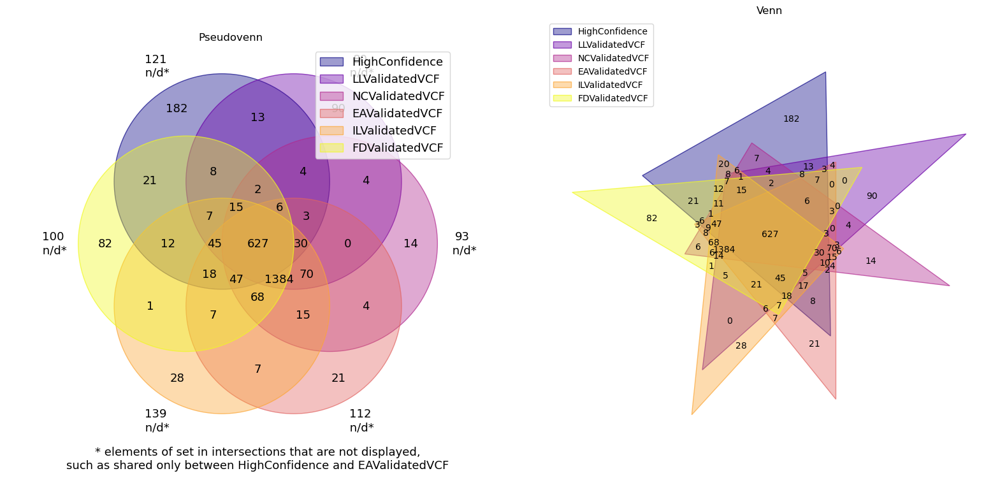

In [15]:
dataset_dict = {"HighConfidence":high_confidence,
                "LLValidatedVCF":set.intersection(*ll_sets_dict.values()),
                "NCValidatedVCF":set.intersection(*nc_sets_dict.values()),
                "EAValidatedVCF":set.intersection(*ea_sets_dict.values()),
                "ILValidatedVCF":set.intersection(*il_sets_dict.values()),
                "FDValidatedVCF":set.intersection(*fd_sets_dict.values())
               }

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot pseudovenn on the first subplot
axes[0].set_title("Pseudovenn")
pseudovenn(dataset_dict, cmap="plasma", ax=axes[0])

# Plot venn on the second subplot
axes[1].set_title("Venn")
venn(dataset_dict, cmap="plasma", fontsize=10, legend_loc="upper left", ax=axes[1])

plt.show()

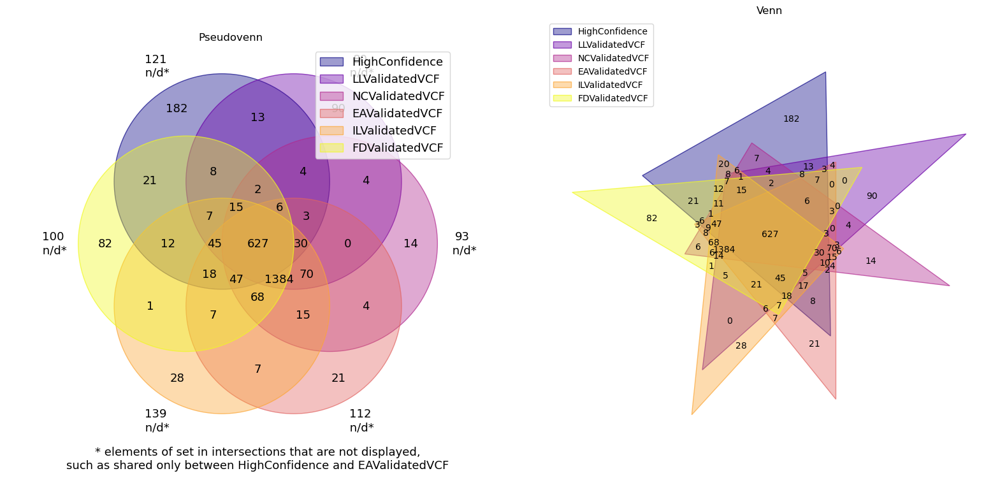

Saved PNG to Önemli Figureler/venn_comparison.png
Saved PDF to Önemli Figureler/venn_comparison.pdf


In [16]:
save_dir = "Önemli Figureler"
os.makedirs(save_dir, exist_ok=True)

dataset_dict = {
    "HighConfidence": high_confidence,
    "LLValidatedVCF": set.intersection(*ll_sets_dict.values()),
    "NCValidatedVCF": set.intersection(*nc_sets_dict.values()),
    "EAValidatedVCF": set.intersection(*ea_sets_dict.values()),
    "ILValidatedVCF": set.intersection(*il_sets_dict.values()),
    "FDValidatedVCF": set.intersection(*fd_sets_dict.values())
}

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

axes[0].set_title("Pseudovenn")
pseudovenn(dataset_dict, cmap="plasma", ax=axes[0])

axes[1].set_title("Venn")
venn(dataset_dict, cmap="plasma", fontsize=10, legend_loc="upper left", ax=axes[1])

png_path = os.path.join(save_dir, "venn_comparison.png")
pdf_path = os.path.join(save_dir, "venn_comparison.pdf")

fig.savefig(png_path, dpi=300, bbox_inches="tight")
fig.savefig(pdf_path, dpi=300, bbox_inches="tight")

plt.show()

print(f"Saved PNG to {png_path}")
print(f"Saved PDF to {pdf_path}")


## Step 3- Filtering VCFs

### 1- Filtering each generated VCF (SNPs)

In [17]:
import os
import pandas as pd
from tqdm import tqdm
import allel

# Define the paths for saving the CSV files
save_path = "dfs/"
csv_file = os.path.join(save_path, "filtering_df.csv")
sets_dict_csv_file = os.path.join(save_path, "sets_dict.csv")

# Ensure the directory exists
if not os.path.exists(save_path):
    os.makedirs(save_path)

# Check if both CSV files exist
if os.path.exists(csv_file) and os.path.exists(sets_dict_csv_file):
    filtering_df = pd.read_csv(csv_file)
    sets_dict_df = pd.read_csv(sets_dict_csv_file)
    sets_dict = sets_dict_df.groupby('Key')['Identifier'].apply(set).to_dict()
    # Ensure all keys are strings
    sets_dict = {str(key): value for key, value in sets_dict.items()}
    print("Both filtering_df and sets_dict DataFrames already exist. Skipping calculations.")
else:
    sets_dict = {}
    filtering_data = []

    vcf_comparison_dict = {row[0]: row[3] for _, row in vcfcomparison_df.iterrows()}

    progression_bar = tqdm(vcf_filenames)
    for key in progression_bar:
        # Creating a dataframe for each vcf.
        temp = allel.vcf_to_dataframe(vcf_filenames[key], fields='variants/*')
        progression_bar.set_description("Processing « %s »" % key)
        VCName = vcf_comparison_dict.get(key)

        total_len = len(temp)
        temp = remove_indels(filtersControl(key, temp, VCName))
        without_indels_len = len(temp)

        filtering_data.append((key, total_len, len(temp), without_indels_len))

        temp["Identifier"] = temp[["CHROM", "POS", "REF", "ALT_1"]].astype(str).agg("_".join, axis=1)
        sets_dict[key] = set(temp["Identifier"])

    filtering_df = pd.DataFrame(filtering_data, columns=["Key", "Total Length", "After FilterPass", "After RemoveIndels"])

    # Save the filtering_df DataFrame to a CSV file
    filtering_df.to_csv(csv_file, index=False)
    print("filtering_df DataFrame has been processed and saved.")

    # Convert sets_dict to a DataFrame for saving to CSV
    sets_dict_df = pd.DataFrame([(key, identifier) for key, identifiers in sets_dict.items() for identifier in identifiers],
                                columns=["Key", "Identifier"])

    # Save the sets_dict DataFrame to a CSV file
    sets_dict_df.to_csv(sets_dict_csv_file, index=False)
    print("sets_dict DataFrame has been processed and saved.")


Both filtering_df and sets_dict DataFrames already exist. Skipping calculations.


### 2- Filtering each generated VCF (Indels)

In [18]:
import os
import pandas as pd
from tqdm import tqdm
import allel

# Define the paths for saving the CSV files
save_path = "dfs/"
csv_file_indels = os.path.join(save_path, "filtering_df_indels.csv")
sets_dict_csv_file_indels = os.path.join(save_path, "sets_dict_indels.csv")

# Ensure the directory exists
if not os.path.exists(save_path):
    os.makedirs(save_path)

# Check if both CSV files exist
if os.path.exists(csv_file_indels) and os.path.exists(sets_dict_csv_file_indels):
    filtering_df_indels = pd.read_csv(csv_file_indels)
    sets_dict_df_indels = pd.read_csv(sets_dict_csv_file_indels)
    sets_dict_indels = sets_dict_df_indels.groupby('Key')['Identifier'].apply(set).to_dict()
    print("Both filtering_df_indels and sets_dict_indels DataFrames already exist. Skipping calculations.")
else:
    sets_dict_indels = {}
    filtering_data_indels = []

    vcf_comparison_dict_indels = {row[0]: row[3] for index, row in vcfcomparison_df_indels.iterrows()}

    progression_bar = tqdm(vcf_filenames_indels)
    for key in progression_bar:
        # Creating a dataframe for each VCF.
        temp = allel.vcf_to_dataframe(vcf_filenames_indels[key], fields='variants/*')
        progression_bar.set_description("Processing « %s »" % key)
        VCName = vcf_comparison_dict_indels.get(key)

        total_len = len(temp)
        temp = temp if VCName == 'SomaticSniper' else temp[temp['FILTER_PASS'].astype("bool") == True]
        after_Filterpass_len = len(temp)

        filtering_data_indels.append((key, total_len, after_Filterpass_len))

        sets_dict_indels[key] = set(temp["CHROM"].astype(str) + "_" + temp["POS"].astype(str) + "_" + temp["REF"].astype(str) + "_" + temp["ALT_1"].astype(str))

    filtering_df_indels = pd.DataFrame(filtering_data_indels, columns=["Key", "Total Length", "After FilterPass"])

    # Save the filtering_df_indels DataFrame to a CSV file
    filtering_df_indels.to_csv(csv_file_indels, index=False)
    print("filtering_df_indels DataFrame has been processed and saved.")

    # Convert sets_dict_indels to a DataFrame for saving to CSV
    sets_dict_df_indels = pd.DataFrame([(key, identifier) for key, identifiers in sets_dict_indels.items() for identifier in identifiers],
                                       columns=["Key", "Identifier"])

    # Save the sets_dict_indels DataFrame to a CSV file
    sets_dict_df_indels.to_csv(sets_dict_csv_file_indels, index=False)
    print("sets_dict_indels DataFrame has been processed and saved.")


Both filtering_df_indels and sets_dict_indels DataFrames already exist. Skipping calculations.


### 3-Plotting Length counts of VCF's after each filtering steps

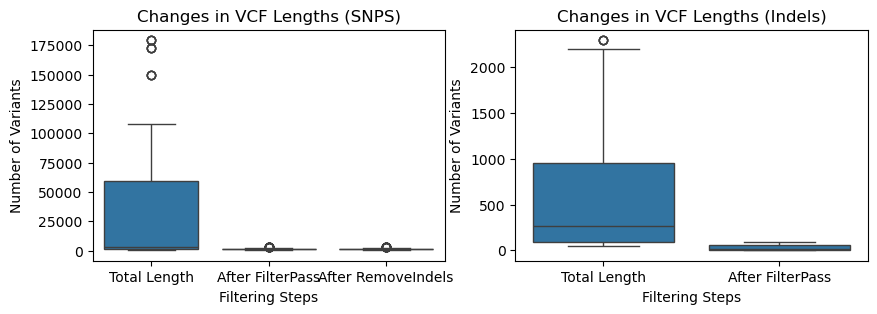

Saved PNG to Önemli Figureler/vcf_length_changes.png
Saved PDF to Önemli Figureler/vcf_length_changes.pdf


In [19]:
save_dir = "Önemli Figureler"
os.makedirs(save_dir, exist_ok=True)

fig, axes = plt.subplots(1, 2, figsize=(10, 3))

sns.boxplot(
    x="variable", y="value",
    data=pd.melt(filtering_df.drop("Key", axis=1)),
    ax=axes[0]
)
axes[0].set_title("Changes in VCF Lengths (SNPS)")
axes[0].set_xlabel("Filtering Steps")
axes[0].set_ylabel("Number of Variants")

sns.boxplot(
    x="variable", y="value",
    data=pd.melt(filtering_df_indels.drop("Key", axis=1)),
    ax=axes[1]
)
axes[1].set_title("Changes in VCF Lengths (Indels)")
axes[1].set_xlabel("Filtering Steps")
axes[1].set_ylabel("Number of Variants")

png_path = os.path.join(save_dir, "vcf_length_changes.png")
pdf_path = os.path.join(save_dir, "vcf_length_changes.pdf")

fig.savefig(png_path, dpi=300, bbox_inches="tight")
fig.savefig(pdf_path, dpi=300, bbox_inches="tight")

plt.show()

print(f"Saved PNG to {png_path}")
print(f"Saved PDF to {pdf_path}")


## Step 4- Matching Features

In [20]:
def calculate_region_size(bed_file):
    region_size = 0
    with open(bed_file, 'r') as f:
        for line in f:
            fields = line.strip().split('\t')
            start, end = int(fields[1]), int(fields[2])
            region_size += end - start
    return region_size

def calculate_tmb(num_somatic_mutations, region_size_bp):
    region_size_mb = region_size_bp / 1_000_000
    return num_somatic_mutations / region_size_mb

# 1) Paths & cache setup
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
tmb_csv = os.path.join(save_path, "tmb_list_snp.csv")

# 2) Load caches from dfs/ for vcf_filenames and sets_dict
vcf_df = pd.read_csv(os.path.join(save_path, "vcf_filenames.csv"))
vcf_filenames = dict(zip(vcf_df["testcase"].astype(str), vcf_df["filepath"]))

sets_df = pd.read_csv(os.path.join(save_path, "sets_dict.csv"))
sets_dict = (
    sets_df
    .groupby("Key")["Identifier"]
    .apply(set)
    .to_dict()
)
sets_dict = {str(k): v for k, v in sets_dict.items()}

# 3) If TMB cache exists, load it; otherwise compute and save
if os.path.exists(tmb_csv):
    tmb_df = pd.read_csv(tmb_csv)
    tmb_list_snp = dict(zip(tmb_df["TestCase"].astype(str), tmb_df["TMB"]))
    print("🎉 Loaded TMB results from cache.")
else:
    # compute region size
    bed_file = "vcf/sorted_exome_hc.bed"
    region_size_bp = calculate_region_size(bed_file)
    print("Size of region:", region_size_bp, "bp")

    # compute TMB per sample
    tmb_list_snp = {}
    for key in vcf_filenames:
        count = len(sets_dict.get(key, set()))
        tmb_list_snp[key] = calculate_tmb(count, region_size_bp)

    # save to CSV
    tmb_df = (
        pd.DataFrame.from_dict(tmb_list_snp, orient="index", columns=["TMB"])
        .reset_index()
        .rename(columns={"index": "TestCase"})
    )
    tmb_df.to_csv(tmb_csv, index=False)
    print(f"✅ Saved TMB results to {tmb_csv}")

# 4) Print sorted by TestCase number
#for sample, tmb in sorted(tmb_list_snp.items(), key=lambda x: int(x[0])):
#    print(f"Sample {sample}: TMB = {tmb:.2f} mutations/Mb")


🎉 Loaded TMB results from cache.


### 1- Matching VCFs files with CSV file columns using the 'TestCaseNo' column (SNPs)

In [21]:
# 1) Cache dizini ve dosya adları
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
vcfcomp_csv        = os.path.join(save_path, "vcfcomparison_df.csv")
vcfcomp_midi_csv   = os.path.join(save_path, "vcfcomparison_df_midi.csv")
vcfcomp_full_csv   = os.path.join(save_path, "vcfcomparison_df_full.csv")

# 2) Eğer cache’ler varsa yükle, yoksa hesapla ve kaydet
if (os.path.exists(vcfcomp_csv)
    and os.path.exists(vcfcomp_midi_csv)
    and os.path.exists(vcfcomp_full_csv)):

    vcfcomparison_df       = pd.read_csv(vcfcomp_csv)
    vcfcomparison_df_midi  = pd.read_csv(vcfcomp_midi_csv)
    vcfcomparison_df_full  = pd.read_csv(vcfcomp_full_csv)
    print("🎉 Comparison DataFrames loaded from cache.")

else:
    # 3) DataFrame’leri başlat
    vcfcomparison_df = pd.DataFrame(
        columns=["TestCase","data","mapper","variantCaller","VCFLength"]
    )
    vcfcomparison_df_midi = pd.DataFrame(
        columns=["isTrimmed","baseRecalibration","Mapper",
                 "VariantCaller","ReferenceGenom","Duplicates"]
    )
    vcfcomparison_df_full = pd.DataFrame(
        columns=[
            "TestCaseNo","phase","Sample","operatingSystem","Environment",
            "isTrimmed","baseRecalibration","Mapper","M_Version",
            "VariantCaller","VC_Version","ReferenceGenom","Duplicates",
            "VariantFilter","FilterPass","SOMATICfilter","remove_indels",
            "TMB","FileLink","Result VCF Count","Author","Slurm_id",
            "Node","ElapsedTime"
        ]
    )

    # 4) Satır ekleme döngüsü
    for index, row in csv_file_df.iterrows():
        for key in vcf_filenames:
            if int(key) - 1 == index:
                vcfcomparison_df.loc[len(vcfcomparison_df)] = [
                    key, row[2], row[7], row[9], len(sets_dict[key])
                ]
                vcfcomparison_df_midi.loc[len(vcfcomparison_df_midi)] = [
                    row[5], row[6], row[7], row[9], row[11], row[12]
                ]
                vcfcomparison_df_full.loc[len(vcfcomparison_df_full)] = [
                    row[0], row[1], row[2], row[3], row[4], row[5], row[6],
                    row[7], row[8], row[9], row[10], row[11], row[12], row[13],
                    row[14], row[15], row[16], tmb_list_snp[key], row[18],
                    len(sets_dict[key]), row[20], row[21], row[22], row[23]
                ]

    # 5) Cache olarak kaydet
    vcfcomparison_df.to_csv(vcfcomp_csv, index=False)
    vcfcomparison_df_midi.to_csv(vcfcomp_midi_csv, index=False)
    vcfcomparison_df_full.to_csv(vcfcomp_full_csv, index=False)
    print("✅ Comparison DataFrames computed and cached.")

# 6) Sonuçları göster
vcfcomparison_df_full.head()


🎉 Comparison DataFrames loaded from cache.


,TestCaseNo,phase,Sample,operatingSystem,Environment,isTrimmed,baseRecalibration,Mapper,M_Version,VariantCaller,VC_Version,ReferenceGenom,Duplicates,VariantFilter,FilterPass,SOMATICfilter,remove_indels,TMB,FileLink,Result VCF Count,Author,Slurm_id,Node,ElapsedTime
0,TestCase 2,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.613695,https://drive.google.com/drive/folders/11CFGjN...,1261,GUL EDA,29812.0,a047,07:15:00
1,TestCase 8,done,EA,Linux,Altay + COSAP,NO,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.799425,https://drive.google.com/drive/folders/1I7r5au...,1276,GUL EDA,29812.0,a047,06:12:47
2,TestCase 14,done,EA,Linux,Altay + COSAP,YES,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,16.009919,https://drive.google.com/drive/folders/1AN-msy...,1293,GUL EDA,29812.0,a047,05:48:51
3,TestCase 20,done,EA,Linux,Altay + COSAP,NO,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.316527,https://drive.google.com/drive/folders/1hhxI84...,1237,GUL EDA,29812.0,a047,07:44:08
4,TestCase 26,done,EA,Linux,Altay + COSAP,YES,YES,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.397318,https://drive.google.com/drive/folders/1sxq7kO...,1082,GUL EDA,29811.0,a078,07:36:41


🎉 Loaded vcfcomparison_df_full from cache.


/var/folders/6c/3dspr2gs2qs15z3zrh8qxfjc0000gn/T/ipykernel_2591/2117068632.py:29: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  sns.boxplot(
/var/folders/6c/3dspr2gs2qs15z3zrh8qxfjc0000gn/T/ipykernel_2591/2117068632.py:43: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  sns.boxplot(


Saved figure to Önemli Figureler/tmb_boxplots.png
Saved figure to Önemli Figureler/tmb_boxplots.pdf


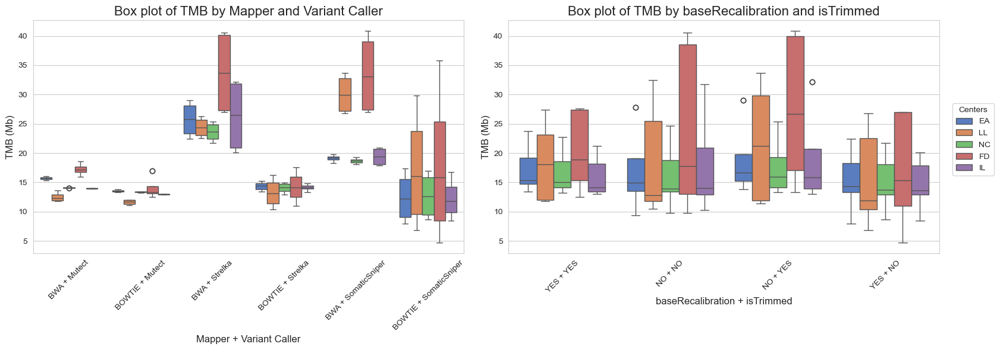

In [22]:
# 1) Cache dizini ve CSV cache dosyaları
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
vcfcomp_full_csv = os.path.join(save_path, "vcfcomparison_df_full.csv")

# 2) Figure’ler için ayrı dizin
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# 3) Cache kontrolü
if os.path.exists(vcfcomp_full_csv):
    df = pd.read_csv(vcfcomp_full_csv)
    print("🎉 Loaded vcfcomparison_df_full from cache.")
else:
    # Eğer hesaplama adımları burada yer alacaksa, onları ekleyin.
    raise FileNotFoundError(f"{vcfcomp_full_csv} not found. Lütfen önce bu CSV'yi oluşturun.")

# 4) Stil ve renk paleti
sns.set_style("whitegrid")
palette = sns.color_palette("muted")

# 5) Yeni sütunlar
df["Mapper_VariantCaller"]        = df["Mapper"] + " + " + df["VariantCaller"]
df["baseRecalibration_isTrimmed"] = df["baseRecalibration"] + " + " + df["isTrimmed"]

# 6) Plot’u oluştur
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.boxplot(
    ax=axes[0],
    x="Mapper_VariantCaller",
    y="TMB",
    hue="Sample",
    data=df,
    palette=palette
)
axes[0].set_title("Box plot of TMB by Mapper and Variant Caller", fontsize=16)
axes[0].set_xlabel("Mapper + Variant Caller", fontsize=12)
axes[0].set_ylabel("TMB (Mb)", fontsize=12)
axes[0].tick_params(axis="x", rotation=45)
axes[0].legend_.remove()

sns.boxplot(
    ax=axes[1],
    x="baseRecalibration_isTrimmed",
    y="TMB",
    hue="Sample",
    data=df,
    palette=palette
)
axes[1].set_title("Box plot of TMB by baseRecalibration and isTrimmed", fontsize=16)
axes[1].set_xlabel("baseRecalibration + isTrimmed", fontsize=12)
axes[1].set_ylabel("TMB (Mb)", fontsize=12)
axes[1].tick_params(axis="x", rotation=45)
axes[1].legend_.remove()

# 7) Ortak legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc="center left",
    bbox_to_anchor=(1.0, 0.6),
    title="Centers",
    fontsize=10,
    frameon=True
)

plt.tight_layout()

# 8) Kaydet: hem PNG hem PDF
png_file = os.path.join(fig_path, "tmb_boxplots.png")
pdf_file = os.path.join(fig_path, "tmb_boxplots.pdf")
fig.savefig(png_file, dpi=300, bbox_inches="tight")
fig.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"Saved figure to {png_file}")
print(f"Saved figure to {pdf_file}")

plt.show()


🎉 Loaded vcfcomparison_df_full from cache.


/var/folders/6c/3dspr2gs2qs15z3zrh8qxfjc0000gn/T/ipykernel_2591/328453498.py:36: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
/var/folders/6c/3dspr2gs2qs15z3zrh8qxfjc0000gn/T/ipykernel_2591/328453498.py:36: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  sns.barplot(


Saved PNG to Önemli Figureler/tmb_grouped_bar.png
Saved PDF to Önemli Figureler/tmb_grouped_bar.pdf


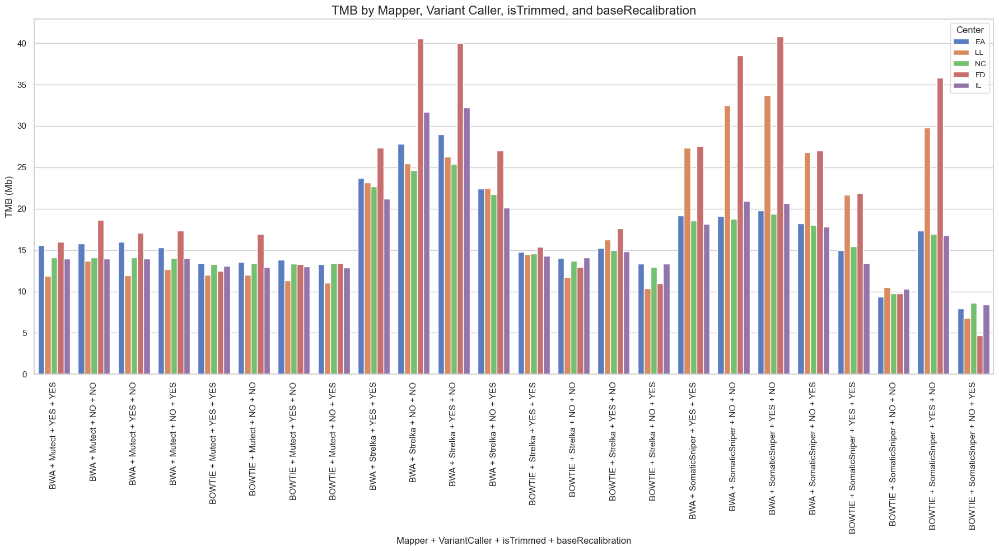

In [23]:
# 1) Cache dizini ve CSV cache dosyaları
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
vcfcomp_full_csv = os.path.join(save_path, "vcfcomparison_df_full.csv")

# 2) Figure’ler için ayrı dizin
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# 3) Cache kontrolü
if os.path.exists(vcfcomp_full_csv):
    df = pd.read_csv(vcfcomp_full_csv)
    print("🎉 Loaded vcfcomparison_df_full from cache.")
else:
    # Hesaplama kodu buraya gelecek, örneğin:
    # df = compute_vcfcomparison_df_full(...)
    # df.to_csv(vcfcomp_full_csv, index=False)
    raise FileNotFoundError(f"{vcfcomp_full_csv} not found. Please compute and save it first.")

# 4) Stil ve renk paleti
sns.set(style="whitegrid")
palette = sns.color_palette("muted")

# 5) Yeni sütunu oluştur
df["Mapper_VariantCaller_isTrimmed_baseRecalibration"] = (
    df["Mapper"] + " + " +
    df["VariantCaller"] + " + " +
    df["isTrimmed"] + " + " +
    df["baseRecalibration"]
)

# 6) Grup bar plot’u oluştur
plt.figure(figsize=(18, 10))
sns.set(style="whitegrid")

sns.barplot(
    x="Mapper_VariantCaller_isTrimmed_baseRecalibration",
    y="TMB",
    hue="Sample",
    data=df,
    dodge=True,
    ci=None,
    palette=palette
)

plt.title(
    "TMB by Mapper, Variant Caller, isTrimmed, and baseRecalibration",
    fontsize=16
)
plt.ylabel("TMB (Mb)", fontsize=12)
plt.xlabel(
    "Mapper + VariantCaller + isTrimmed + baseRecalibration",
    fontsize=12
)
plt.xticks(rotation=90)
plt.legend(title="Center", fontsize=10, frameon=True)

plt.tight_layout()

# 7) Kaydet: hem PNG hem PDF
png_file = os.path.join(fig_path, "tmb_grouped_bar.png")
pdf_file = os.path.join(fig_path, "tmb_grouped_bar.pdf")
plt.savefig(png_file, bbox_inches="tight", dpi=300)
plt.savefig(pdf_file, bbox_inches="tight", dpi=300)
print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")

plt.show()


### 1.1 TMB

/var/folders/6c/3dspr2gs2qs15z3zrh8qxfjc0000gn/T/ipykernel_2591/2401435812.py:2: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  cp = sns.catplot(x='VariantCaller', y='TMB', data=vcfcomparison_df_full,hue='Sample',height=5, aspect=2,palette=sns.color_palette("muted"))


Text(0.5, 0.98, 'VariantCaller')

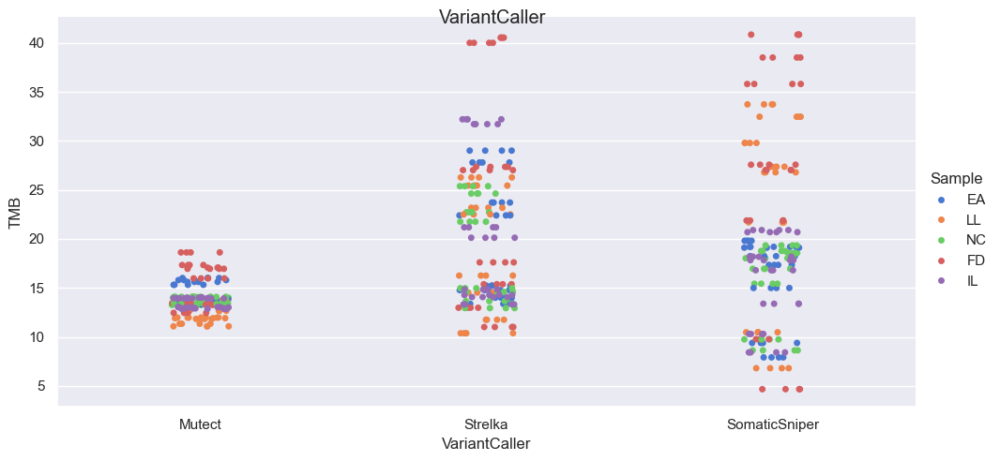

In [24]:
sns.set(rc={"figure.figsize":(3, 4)})
cp = sns.catplot(x='VariantCaller', y='TMB', data=vcfcomparison_df_full,hue='Sample',height=5, aspect=2,palette=sns.color_palette("muted"))
cp.fig.suptitle('VariantCaller')

🎉 Loaded vcfcomparison_df_full from cache.


/var/folders/6c/3dspr2gs2qs15z3zrh8qxfjc0000gn/T/ipykernel_2591/1149217857.py:29: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  cp = sns.catplot(
/var/folders/6c/3dspr2gs2qs15z3zrh8qxfjc0000gn/T/ipykernel_2591/1149217857.py:29: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  cp = sns.catplot(


Saved PNG to Önemli Figureler/tmb_by_variantcaller.png
Saved PDF to Önemli Figureler/tmb_by_variantcaller.pdf


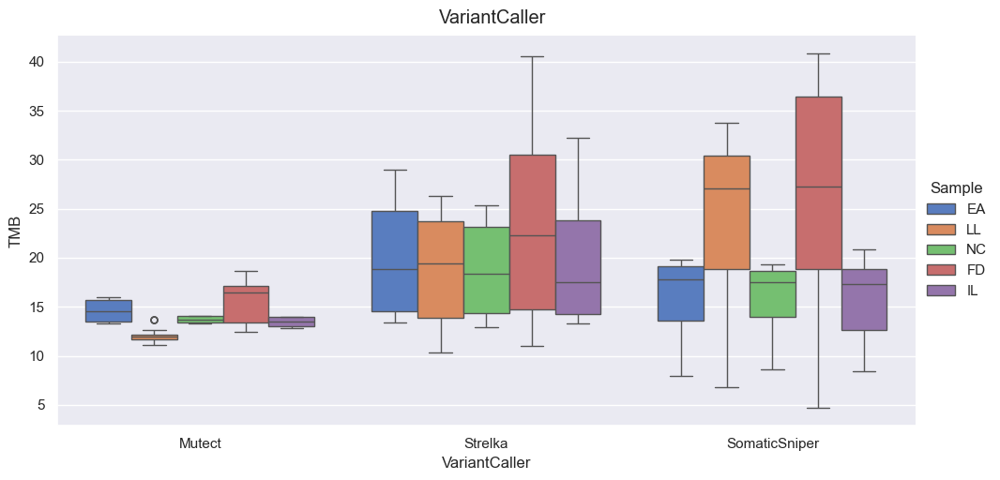

In [25]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1) Cache dizini ve CSV cache dosyası
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
vcfcomp_full_csv = os.path.join(save_path, "vcfcomparison_df_full.csv")

# 2) Figure’ler için ayrı dizin
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# 3) Cache kontrolü
if os.path.exists(vcfcomp_full_csv):
    df = pd.read_csv(vcfcomp_full_csv)
    print("🎉 Loaded vcfcomparison_df_full from cache.")
else:
    # Hesaplama kodu buraya gelecek, örneğin:
    # df = compute_vcfcomparison_df_full(...)
    # df.to_csv(vcfcomp_full_csv, index=False)
    raise FileNotFoundError(f"{vcfcomp_full_csv} not found. Please compute and save it first.")

# 4) Stil ve görünüm
sns.set(rc={"figure.figsize": (3, 4)})

# 5) Catplot
cp = sns.catplot(
    x='VariantCaller',
    y='TMB',
    hue='Sample',
    data=df,
    kind='box',
    height=5,
    aspect=2,
    palette=sns.color_palette("muted"),
    dodge=True,
    ci=None
)
cp.fig.suptitle('VariantCaller', y=1.02)

# 6) Kaydet: hem PNG hem PDF
png_file = os.path.join(fig_path, "tmb_by_variantcaller.png")
pdf_file = os.path.join(fig_path, "tmb_by_variantcaller.pdf")
cp.fig.savefig(png_file, bbox_inches="tight", dpi=300)
cp.fig.savefig(pdf_file, bbox_inches="tight", dpi=300)
print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")

plt.show()


### 2- Plotting All Variant Counts based on their 'Variant Callers' and 'Centers' (SNPs)

/var/folders/6c/3dspr2gs2qs15z3zrh8qxfjc0000gn/T/ipykernel_2591/3244265823.py:2: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  cp = sns.catplot(x='VariantCaller', y='Result VCF Count', data=vcfcomparison_df_full,hue='Sample',height=5, aspect=2,palette=sns.color_palette("muted"))


Text(0.5, 0.98, 'VariantCaller')

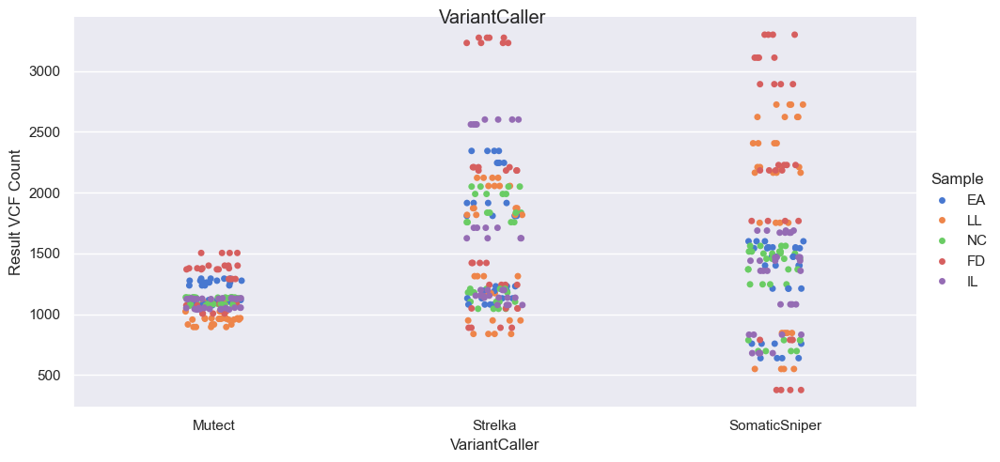

In [26]:
sns.set(rc={"figure.figsize":(3, 4)})
cp = sns.catplot(x='VariantCaller', y='Result VCF Count', data=vcfcomparison_df_full,hue='Sample',height=5, aspect=2,palette=sns.color_palette("muted"))
cp.fig.suptitle('VariantCaller')

### 3- Plotting All Variant Counts based on their 'Mapper, Variant Callers' and 'Centers' (SNPs)

In [27]:
# 1) Cache dizini ve CSV cache dosyası
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
vcfcomp_full_csv = os.path.join(save_path, "vcfcomparison_df_full.csv")

# 2) Figure’ler için ayrı dizin
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# 3) Cache kontrolü
if os.path.exists(vcfcomp_full_csv):
    df = pd.read_csv(vcfcomp_full_csv)
    print("🎉 Loaded vcfcomparison_df_full from cache.")
else:
    # Hesaplama kodu buraya gelecek, örneğin:
    # df = compute_vcfcomparison_df_full(...)
    # df.to_csv(vcfcomp_full_csv, index=False)
    raise FileNotFoundError(f"{vcfcomp_full_csv} not found. Please compute and save it first.")

# 4) Özet göster
print(df.head())

# 5) Stil ayarları (seaborn renk paleti Plotly uyumlu hale getiriliyor)
palette = sns.color_palette("muted").as_hex()

# 6) Plotly scatter facet plot
fig = px.scatter(
    df,
    x="VariantCaller",
    y="Result VCF Count",
    color="Mapper",
    symbol="VariantCaller",
    facet_col="Sample",
    hover_data=["Environment", "TestCaseNo"],
    color_discrete_sequence=palette
).update_layout(
    title_text="Variant Count for each TestCase (SNPs)",
    title={
        "y": 0.95,
        "x": 0.4,
        "xanchor": "center",
        "yanchor": "top"
    },
    font=dict(size=8),
    showlegend=True
)
fig.update_xaxes(tickangle=90)
fig.update_traces(marker=dict(size=6))

# 7) Kaydet: hem PNG hem PDF
png_file = os.path.join(fig_path, "variant_count_testcase_snps.png")
pdf_file = os.path.join(fig_path, "variant_count_testcase_snps.pdf")
fig.write_image(png_file, format="png", scale=2)
fig.write_image(pdf_file, format="pdf", scale=2)
print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")

fig.show()


🎉 Loaded vcfcomparison_df_full from cache.
    TestCaseNo phase Sample operatingSystem    Environment isTrimmed baseRecalibration  Mapper  M_Version VariantCaller  VC_Version ReferenceGenom Duplicates  VariantFilter  FilterPass  SOMATICfilter  remove_indels        TMB                                           FileLink  Result VCF Count   Author  Slurm_id  Node ElapsedTime
0   TestCase 2  done     EA           Linux  Altay + COSAP       YES               YES     BWA        NaN        Mutect         NaN           hg38       MARK            NaN         NaN            NaN            NaN  15.613695  https://drive.google.com/drive/folders/11CFGjN...              1261  GUL EDA   29812.0  a047    07:15:00
1   TestCase 8  done     EA           Linux  Altay + COSAP        NO                NO     BWA        NaN        Mutect         NaN           hg38       MARK            NaN         NaN            NaN            NaN  15.799425  https://drive.google.com/drive/folders/1I7r5au...              127

### 4- Matching VCFs files with CSV file columns using the 'TestCaseNo' column (Indels)


In [28]:
vcfcomparison_df_indels = pd.DataFrame(columns=["TestCase", "data", "mapper", "variantCaller", "VCFLength"])
vcfcomparison_df_full_indels = pd.DataFrame(columns=["TestCaseNo","phase","Sample","Environment","isTrimmed",
                                                     "baseRecalibration","Mapper","VariantCaller","Duplicates",
                                                     "FileLink","Result VCF Count","Author"])

for index, row in csv_file_df_indels.iterrows():
    for key in vcf_filenames_indels:
        # Ensure the key type matches the dictionary
        key_int = int(key)  # Convert key to integer

        if key_int - 1 == index:
            # Check if key exists in the dictionary before accessing
            if key_int in sets_dict_indels:
                vcfcomparison_df_indels.loc[len(vcfcomparison_df_indels.index)] = [
                    key, row[2], row[6], row[7], len(sets_dict_indels[key_int])
                ]
                
                vcfcomparison_df_full_indels.loc[len(vcfcomparison_df_full_indels.index)] = [
                    row[0], row[1], row[2], row[3], row[4], row[5], row[6], row[7], row[8],
                    row[9], len(sets_dict_indels[key_int]), row[11]
                ]
            else:
                print(f"Key {key_int} not found in sets_dict_indels")


In [29]:
vcfcomparison_df_full_indels

,TestCaseNo,phase,Sample,Environment,isTrimmed,baseRecalibration,Mapper,VariantCaller,Duplicates,FileLink,Result VCF Count,Author
0,TestCase 1,done,LL,Uhem + COSAP,yes,yes,BWA,Mutect,MARK,https://drive.google.com/drive/folders/1wBcuLv...,59,Gül Eda
1,TestCase 2,done,LL,Uhem + COSAP,yes,yes,BWA,Strelka,MARK,https://drive.google.com/drive/folders/1IpGEQ-...,15,Gül Eda
2,TestCase 3,done,LL,Uhem + COSAP,yes,yes,Bowtie,Mutect,MARK,https://drive.google.com/drive/folders/1d4D9UC...,25,Gül Eda
3,TestCase 4,done,LL,Uhem + COSAP,yes,yes,Bowtie,Strelka,MARK,https://drive.google.com/drive/folders/1Ei63_F...,13,Gül Eda
4,TestCase 5,done,LL,Uhem + COSAP,yes,no,BWA,Mutect,MARK,https://drive.google.com/drive/folders/1UB4I9T...,60,Gül Eda
5,TestCase 6,done,LL,Uhem + COSAP,yes,no,BWA,Strelka,MARK,https://drive.google.com/drive/folders/1zMMrpF...,14,Gül Eda
6,TestCase 7,done,LL,Uhem + COSAP,yes,no,Bowtie,Mutect,MARK,https://drive.google.com/drive/folders/12Cd2n0...,23,Gül Eda
7,TestCase 8,done,LL,Uhem + COSAP,yes,no,Bowtie,Strelka,MARK,https://drive.google.com/drive/folders/1tIl-qK...,12,Gül Eda
8,TestCase 9,done,LL,Uhem + COSAP,no,yes,BWA,Mutect,MARK,https://drive.google.com/drive/folders/1TZho1d...,65,Gül Eda
9,TestCase 10,done,LL,Uhem + COSAP,no,yes,BWA,Strelka,MARK,https://drive.google.com/drive/folders/1Rl3_fL...,3,Gül Eda


In [30]:
'''vcfcomparison_df_indels = pd.DataFrame(columns=["TestCase", "data", "mapper", "variantCaller", "VCFLength"])
vcfcomparison_df_full_indels = pd.DataFrame(columns=["TestCaseNo","phase","Sample","Environment","isTrimmed","baseRecalibration","Mapper","VariantCaller","Duplicates","FileLink","Result VCF Count","Author"])

for index, row in csv_file_df_indels.iterrows():
    for key in vcf_filenames_indels:
        if int(key)-1 == index:
            vcfcomparison_df_indels.loc[len(vcfcomparison_df_indels.index)] = [key , row[2],row[6],row[7],len(sets_dict_indels[key])] 
            vcfcomparison_df_full_indels.loc[len(vcfcomparison_df_full_indels.index)] = [row[0],row[1],row[2],row[3],row[4],row[5],row[6],row[7],row[8],row[9],len(sets_dict_indels[key]),row[11]]
 '''           

'vcfcomparison_df_indels = pd.DataFrame(columns=["TestCase", "data", "mapper", "variantCaller", "VCFLength"])\nvcfcomparison_df_full_indels = pd.DataFrame(columns=["TestCaseNo","phase","Sample","Environment","isTrimmed","baseRecalibration","Mapper","VariantCaller","Duplicates","FileLink","Result VCF Count","Author"])\n\nfor index, row in csv_file_df_indels.iterrows():\n    for key in vcf_filenames_indels:\n        if int(key)-1 == index:\n            vcfcomparison_df_indels.loc[len(vcfcomparison_df_indels.index)] = [key , row[2],row[6],row[7],len(sets_dict_indels[key])] \n            vcfcomparison_df_full_indels.loc[len(vcfcomparison_df_full_indels.index)] = [row[0],row[1],row[2],row[3],row[4],row[5],row[6],row[7],row[8],row[9],len(sets_dict_indels[key]),row[11]]\n '

### 5- Plotting All Variant Counts based on their 'Variant Callers' and 'Centers' (Indels)

/var/folders/6c/3dspr2gs2qs15z3zrh8qxfjc0000gn/T/ipykernel_2591/3667516332.py:3: UserWarning:

The palette list has more values (10) than needed (5), which may not be intended.



Text(0.5, 0.98, 'VariantCaller')

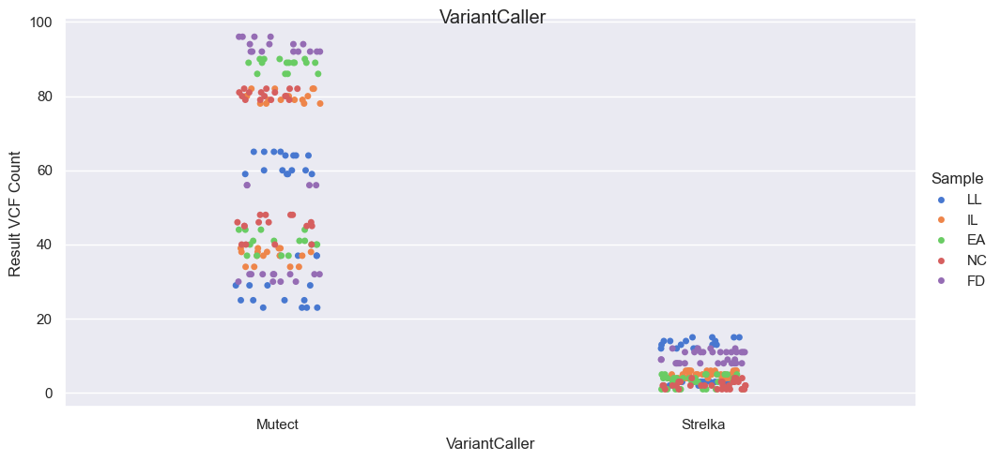

In [31]:
#VCF All Variant Counts vcfcomparison_df_full["Sample"] == "NC"
sns.set(rc={"figure.figsize":(3, 4)})
cp = sns.catplot(x='VariantCaller', y='Result VCF Count', data=vcfcomparison_df_full_indels,hue='Sample',height=5, aspect=2,palette=sns.color_palette("muted"))
cp.fig.suptitle('VariantCaller')

### 6- Plotting All Variant Counts based on their 'Mapper, Variant Callers' and 'Centers' (Indels)

In [32]:
# figure’ler için dizin
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# 1) Stil paleti
palette = sns.color_palette("muted").as_hex()

# 2) Scatter facet plot
fig = px.scatter(
    vcfcomparison_df_full_indels,
    x="VariantCaller",
    y="Result VCF Count",
    color="Mapper",
    symbol="VariantCaller",
    facet_col="Sample",
    hover_data=["Environment", "TestCaseNo"],
    color_discrete_sequence=palette
).update_layout(
    title={
        "y": 0.95,
        "x": 0.4,
        "xanchor": "center",
        "yanchor": "top"
    },
    showlegend=True,
    title_text="Variant Count for each TestCase (Indels)",
    font=dict(size=8)
)

fig.update_traces(marker=dict(size=6))
fig.update_xaxes(tickangle=90)

# 3) Kaydet: hem PNG hem PDF
png_file = os.path.join(fig_path, "variant_count_testcase_indels.png")
pdf_file = os.path.join(fig_path, "variant_count_testcase_indels.pdf")
fig.write_image(png_file, format="png", scale=2)
fig.write_image(pdf_file, format="pdf", scale=2)

print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")

fig.show()

Saved PNG to Önemli Figureler/variant_count_testcase_indels.png
Saved PDF to Önemli Figureler/variant_count_testcase_indels.pdf


## Step 5- Execution Time Analysis

## 1 - Plotting execution times

In [33]:
df_timeTable = pd.DataFrame([
    [row['TestCaseNo'].split(' ')[1], row['Sample'], row['isTrimmed'], row['baseRecalibration'],
     row['Mapper'], row['VariantCaller'], row['Duplicates'], row['Node'], row['ElapsedTime'], row['Environment']]
    for _, row in vcfcomparison_df_full.iterrows()
], columns=["TestCase", "Sample", "isTrimmed", "baseRecalibration", "Mapper", "VariantCaller", "Duplicates", "Node", "ElapsedTime", "Environment"])

#df_timeTable.to_csv('sourceoftime.csv')


In [34]:
df_timeTable['baseRecalibration, isTrimmed'] = df_timeTable['baseRecalibration'] + ', ' + df_timeTable['isTrimmed']
df_timeTable['Mapper, VariantCaller'] = df_timeTable['Mapper'] + ', ' + df_timeTable['VariantCaller']

In [35]:
fig = px.scatter(
    df_timeTable,
    x="TestCase",
    y=pd.to_datetime(df_timeTable['ElapsedTime'], format='%H:%M:%S'),
    color = "Mapper, VariantCaller",
    symbol = "baseRecalibration, isTrimmed",
    facet_col= 'Sample',
    hover_data=['Mapper',"VariantCaller","baseRecalibration","isTrimmed","Duplicates"],
    color_discrete_sequence=['#55a3cd', '#4954b0', '#282739', '#e96f36', '#9c2f45', '#F2E34C'],
).update_layout(
    title={
        'y':0.95,
        'x':0.4,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_tickformat="%H:%M:%S",
    showlegend=True,
    title_text="Elapsed Time for each Pipeline",
    font=dict(
        size=10
    )
)
fig.update_traces(marker = dict(size=6))
fig.update_xaxes(title='Elapsed Time', visible=False, showticklabels=False)
pio.write_image(fig, 'Elapsed Time.pdf',scale=6, width=985, height=620)
fig.show()


In [36]:
import os
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.io as pio

# 1) Cache dizini ve CSV cache dosyası
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
time_csv = os.path.join(save_path, "df_timeTable.csv")

# 2) Cache kontrolü
if os.path.exists(time_csv):
    df_timeTable = pd.read_csv(time_csv)
    print("🎉 Loaded df_timeTable from cache.")
else:
    # 3) Hesaplama: vcfcomparison_df_full'den zaman tablosu oluştur
    df_timeTable = pd.DataFrame([
        [
            row['TestCaseNo'].split(' ')[1],
            row['Sample'],
            row['isTrimmed'],
            row['baseRecalibration'],
            row['Mapper'],
            row['VariantCaller'],
            row['Duplicates'],
            row['Node'],
            row['ElapsedTime'],
            row['Environment']
        ]
        for _, row in vcfcomparison_df_full.iterrows()
    ], columns=[
        "TestCase", "Sample", "isTrimmed", "baseRecalibration",
        "Mapper", "VariantCaller", "Duplicates", "Node",
        "ElapsedTime", "Environment"
    ])

    df_timeTable['baseRecalibration, isTrimmed'] = (
        df_timeTable['baseRecalibration'] + ', ' + df_timeTable['isTrimmed']
    )
    df_timeTable['Mapper, VariantCaller'] = (
        df_timeTable['Mapper'] + ', ' + df_timeTable['VariantCaller']
    )

    df_timeTable.to_csv(time_csv, index=False)
    print(f"✅ Saved df_timeTable to {time_csv}")

# 4) Figure’ler için ayrı dizin
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# 5) Palette ayarı
palette = sns.color_palette("muted").as_hex()

# 6) Plotly scatter facet plot
fig = px.scatter(
    df_timeTable,
    x="TestCase",
    y=pd.to_datetime(df_timeTable['ElapsedTime'], format='%H:%M:%S'),
    color="Mapper, VariantCaller",
    symbol="baseRecalibration, isTrimmed",
    facet_col="Sample",
    hover_data=['Mapper', 'VariantCaller', 'baseRecalibration', 'isTrimmed', 'Duplicates'],
    color_discrete_sequence=palette
).update_layout(
    title_text="Elapsed Time for each Pipeline",
    title={
        'y': 0.95,
        'x': 0.4,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    yaxis_tickformat="%H:%M:%S",
    font=dict(size=10),
    showlegend=True
)

fig.update_traces(marker=dict(size=6))
fig.update_xaxes(title='Elapsed Time', visible=False, showticklabels=False)

# 7) Kaydet: hem PNG hem PDF
png_file = os.path.join(fig_path, "elapsed_time_pipeline.png")
pdf_file = os.path.join(fig_path, "elapsed_time_pipeline.pdf")
fig.write_image(png_file, format="png", scale=6, width=985, height=620)
fig.write_image(pdf_file, format="pdf", scale=6, width=985, height=620)
print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")

# 8) Göster
fig.show()


🎉 Loaded df_timeTable from cache.
Saved PNG to Önemli Figureler/elapsed_time_pipeline.png
Saved PDF to Önemli Figureler/elapsed_time_pipeline.pdf


In [37]:
inter_testcase_dict = {row["TestCaseNo"].split(' ')[1]: "_".join(row[["Sample", "isTrimmed", "baseRecalibration", "Mapper", "VariantCaller", "ReferenceGenom", "Duplicates"]].astype(str))
                       for _, row in tqdm(vcfcomparison_df_full.iterrows())}


480it [00:00, 4759.70it/s]


## Step 6- Heatmaps

### 1 - Heatmap between Generated VCFs with Intersection / Union. (SNPs)

In [38]:
import pandas as pd
from tqdm import tqdm

# Define the path for saving CSV files
save_path = "dfs/"

# Ensure the directory exists
if not os.path.exists(save_path):
    os.makedirs(save_path)

# File paths for CSV files
csv_files = {
    "df_generateds_r_p": os.path.join(save_path, "df_generateds_r_p.csv"),
    "df_ll": os.path.join(save_path, "df_ll.csv"),
    "df_nc": os.path.join(save_path, "df_nc.csv"),
    "df_ea": os.path.join(save_path, "df_ea.csv"),
    "df_fd": os.path.join(save_path, "df_fd.csv"),
    "df_il": os.path.join(save_path, "df_il.csv")
}

# Load existing DataFrames if CSV files exist, otherwise initialize empty DataFrames
df_generateds_r_p = pd.read_csv(csv_files["df_generateds_r_p"]) if os.path.exists(csv_files["df_generateds_r_p"]) else pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_ll = pd.read_csv(csv_files["df_ll"]) if os.path.exists(csv_files["df_ll"]) else pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_nc = pd.read_csv(csv_files["df_nc"]) if os.path.exists(csv_files["df_nc"]) else pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_ea = pd.read_csv(csv_files["df_ea"]) if os.path.exists(csv_files["df_ea"]) else pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_fd = pd.read_csv(csv_files["df_fd"]) if os.path.exists(csv_files["df_fd"]) else pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_il = pd.read_csv(csv_files["df_il"]) if os.path.exists(csv_files["df_il"]) else pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])

# Skip calculation if all CSV files exist
if all(os.path.exists(file) for file in csv_files.values()):
    print("All DataFrames already exist. Skipping calculations.")
else:
    # Preprocess data frame
    vcfcomparison_df_full['TestCaseNo'] = vcfcomparison_df_full['TestCaseNo'].str.split(' ', expand=True)[1]

    # Combine 'Mapper', 'VariantCaller', 'isTrimmed', 'baseRecalibration', 'Duplicates', 'Sample', 'Environment' columns
    # into a single column 'CombinedKey'
    vcfcomparison_df_full['CombinedKey'] = (vcfcomparison_df_full['Mapper'].str[:2] + '/' +
                                            vcfcomparison_df_full['VariantCaller'].str[:2] + '/' +
                                            vcfcomparison_df_full['isTrimmed'] + '/' +
                                            vcfcomparison_df_full['baseRecalibration'] + '/' +
                                            vcfcomparison_df_full['Duplicates'].str[:1] + '/' +
                                            vcfcomparison_df_full['TestCaseNo'] + '/' +
                                            vcfcomparison_df_full['Sample'] + '/' +
                                            vcfcomparison_df_full['Environment'].str[0]).str.lower()

    # Initialize result data frames
    df_generateds_r_p = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
    df_ll = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
    df_nc = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
    df_ea = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
    df_fd = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
    df_il = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])

    # Create tqdm progress bar
    progress_bar = tqdm(sets_dict, desc="Processing")

    # Initialize index counters
    index_r_p = 0
    index_ll = 0
    index_nc = 0
    index_ea = 0
    index_fd = 0
    index_il = 0

    # Iterate over sets_dict
    for key in progress_bar:
        progress_bar.set_description("Processing « %s »" % key)
        vcf_key = vcfcomparison_df_full['TestCaseNo'] == key
        filtered_vcf = vcfcomparison_df_full[vcf_key]
        new_key = (filtered_vcf['Mapper'].str[:2] + '/' + filtered_vcf['VariantCaller'].str[:2] + '/' +
                   filtered_vcf['isTrimmed'] + '/' + filtered_vcf['baseRecalibration'] + '/' +
                   filtered_vcf['Duplicates'].str[:1] + '/' + key + '/' + filtered_vcf['Sample']).str.lower() + '/' + \
                  filtered_vcf['Environment'].str[0]

        for key2 in sets_dict:
            vcf_key2 = vcfcomparison_df_full['TestCaseNo'] == key2
            filtered_vcf2 = vcfcomparison_df_full[vcf_key2]
            new_key2 = (filtered_vcf2['Mapper'].str[:2] + '/' + filtered_vcf2['VariantCaller'].str[:2] + '/' +
                        filtered_vcf2['isTrimmed'] + '/' + filtered_vcf2['baseRecalibration'] + '/' +
                        filtered_vcf2['Duplicates'].str[:1] + '/' + key2 + '/' + filtered_vcf2['Sample']).str.lower() + '/' + \
                       filtered_vcf2['Environment'].str[0]

            # Compute intersection/union once
            inter_union_result = inter_union(sets_dict[key], sets_dict[key2])

            # Use vectorized operations to check conditions and update data frames
            if (new_key.str.split('/', expand=True)[6] == "ll").all() and (new_key2.str.split('/', expand=True)[6] == "ll").all():
                df_ll.at[index_ll, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]
                index_ll += 1

            if (new_key.str.split('/', expand=True)[6] == "nc").all() and (new_key2.str.split('/', expand=True)[6] == "nc").all():
                df_nc.at[index_nc, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]
                index_nc += 1

            if (new_key.str.split('/', expand=True)[6] == "ea").all() and (new_key2.str.split('/', expand=True)[6] == "ea").all():
                df_ea.at[index_ea, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]
                index_ea += 1

            if (new_key.str.split('/', expand=True)[6] == "fd").all() and (new_key2.str.split('/', expand=True)[6] == "fd").all():
                df_fd.at[index_fd, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]
                index_fd += 1

            if (new_key.str.split('/', expand=True)[6] == "il").all() and (new_key2.str.split('/', expand=True)[6] == "il").all():
                df_il.at[index_il, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]
                index_il += 1

            #df_generateds_r_p.at[index_r_p, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]
            df_generateds_r_p.loc[len(df_generateds_r_p.index)] = [new_key.iloc[0], new_key2.iloc[0], inter_union_result]

            index_r_p += 1

All DataFrames already exist. Skipping calculations.


In [39]:
df_generateds_r_p

,TestCase1,TestCase2,Inter/Union
0,bw/mu/no/no/d/296/ea/A,bw/mu/no/no/d/296/ea/A,1.00
1,bw/mu/no/no/d/296/ea/A,bo/so/no/yes/d/606/fd/U,0.04
2,bw/mu/no/no/d/296/ea/A,bw/so/no/yes/m/262/ea/U,0.44
3,bw/mu/no/no/d/296/ea/A,bo/st/yes/yes/d/853/il/A,0.60
4,bw/mu/no/no/d/296/ea/A,bw/st/yes/no/d/639/fd/A,0.26
...,...,...,...
230395,bw/mu/yes/yes/m/817/il/A,bo/st/no/no/m/226/ea/U,0.62
230396,bw/mu/yes/yes/m/817/il/A,bo/so/yes/no/d/642/fd/A,0.25
230397,bw/mu/yes/yes/m/817/il/A,bw/st/yes/yes/d/484/ea/U,0.49
230398,bw/mu/yes/yes/m/817/il/A,bo/st/yes/yes/m/219/ll/U,0.53


### 2 - Heatmap between Generated VCFs with Intersection / Union. (Indels)

In [40]:
import pandas as pd
import os
from tqdm import tqdm

# Define the path for saving CSV files
save_path_indels = "dfs_indels/"

# Ensure the directory exists
if not os.path.exists(save_path_indels):
    os.makedirs(save_path_indels)

# File paths for CSV files
csv_files_indels = {
    "df_generateds_r_p_indels": os.path.join(save_path_indels, "df_generateds_r_p_indels.csv"),
    "df_ll_indels": os.path.join(save_path_indels, "df_ll_indels.csv"),
    "df_nc_indels": os.path.join(save_path_indels, "df_nc_indels.csv"),
    "df_ea_indels": os.path.join(save_path_indels, "df_ea_indels.csv"),
    "df_fd_indels": os.path.join(save_path_indels, "df_fd_indels.csv"),
    "df_il_indels": os.path.join(save_path_indels, "df_il_indels.csv")
}

# Load existing DataFrames if CSV files exist, otherwise initialize empty DataFrames
df_generateds_r_p_indels = pd.read_csv(csv_files_indels["df_generateds_r_p_indels"]) if os.path.exists(csv_files_indels["df_generateds_r_p_indels"]) else pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_ll_indels = pd.read_csv(csv_files_indels["df_ll_indels"]) if os.path.exists(csv_files_indels["df_ll_indels"]) else pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_nc_indels = pd.read_csv(csv_files_indels["df_nc_indels"]) if os.path.exists(csv_files_indels["df_nc_indels"]) else pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_ea_indels = pd.read_csv(csv_files_indels["df_ea_indels"]) if os.path.exists(csv_files_indels["df_ea_indels"]) else pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_fd_indels = pd.read_csv(csv_files_indels["df_fd_indels"]) if os.path.exists(csv_files_indels["df_fd_indels"]) else pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
df_il_indels = pd.read_csv(csv_files_indels["df_il_indels"]) if os.path.exists(csv_files_indels["df_il_indels"]) else pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])

# Skip calculation if all CSV files exist
if all(os.path.exists(file) for file in csv_files_indels.values()):
    print("All DataFrames already exist. Skipping calculations.")
else:
    # Preprocess data frame
    vcfcomparison_df_full_indels['TestCaseNo'] = vcfcomparison_df_full_indels['TestCaseNo'].str.split(' ', expand=True)[1]

    # Combine 'Mapper', 'VariantCaller', 'isTrimmed', 'baseRecalibration', 'Duplicates', 'Sample', 'Environment' columns
    # into a single column 'CombinedKey'
    vcfcomparison_df_full_indels['CombinedKey'] = (vcfcomparison_df_full_indels['Mapper'].str[:2] + '/' +
                                                   vcfcomparison_df_full_indels['VariantCaller'].str[:2] + '/' +
                                                   vcfcomparison_df_full_indels['isTrimmed'] + '/' +
                                                   vcfcomparison_df_full_indels['baseRecalibration'] + '/' +
                                                   vcfcomparison_df_full_indels['Duplicates'].str[:1] + '/' +
                                                   vcfcomparison_df_full_indels['TestCaseNo'] + '/' +
                                                   vcfcomparison_df_full_indels['Sample'] + '/' +
                                                   vcfcomparison_df_full_indels['Environment'].str[0]).str.lower()

    # Initialize result data frames
    df_generateds_r_p_indels = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
    df_ll_indels = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
    df_nc_indels = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
    df_ea_indels = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
    df_fd_indels = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])
    df_il_indels = pd.DataFrame(columns=["TestCase1", "TestCase2", "Inter/Union"])

    # Create tqdm progress bar
    progress_bar_indels = tqdm(sets_dict_indels, desc="Processing")

    # Initialize index counters
    index_r_p_indels = 0
    index_ll_indels = 0
    index_nc_indels = 0
    index_ea_indels = 0
    index_fd_indels = 0
    index_il_indels = 0

    # Iterate over sets_dict
    for key_indels in progress_bar_indels:
        progress_bar_indels.set_description("Processing « %s »" % key_indels)
        vcf_key_indels = vcfcomparison_df_full_indels['TestCaseNo'] == key_indels
        filtered_vcf_indels = vcfcomparison_df_full_indels[vcf_key_indels]

        new_key_indels = (filtered_vcf_indels['Mapper'].str[:2] + '/' + filtered_vcf_indels['VariantCaller'].str[:2] + '/' +
                          filtered_vcf_indels['isTrimmed'] + '/' + filtered_vcf_indels['baseRecalibration'] + '/' +
                          filtered_vcf_indels['Duplicates'].str[:1] + '/' + key_indels + '/' +
                          filtered_vcf_indels['Sample']).str.lower() + '/' + filtered_vcf_indels['Environment'].str[0]

        for key2_indels in sets_dict_indels:
            vcf_key2_indels = vcfcomparison_df_full_indels['TestCaseNo'] == key2_indels
            filtered_vcf2_indels = vcfcomparison_df_full_indels[vcf_key2_indels]
            new_key2_indels = (filtered_vcf2_indels['Mapper'].str[:2] + '/' + filtered_vcf2_indels['VariantCaller'].str[:2] + '/' +
                               filtered_vcf2_indels['isTrimmed'] + '/' + filtered_vcf2_indels['baseRecalibration'] + '/' +
                               filtered_vcf2_indels['Duplicates'].str[:1] + '/' + key2_indels + '/' +
                               filtered_vcf2_indels['Sample']).str.lower() + '/' + filtered_vcf2_indels['Environment'].str[0]

            # Compute intersection/union once
            inter_union_result_indels = inter_union(sets_dict_indels[key_indels], sets_dict_indels[key2_indels])

            # Use vectorized operations to check conditions and update data frames
            if (new_key_indels.str.split('/', expand=True)[6] == "ll").all() and (new_key2_indels.str.split('/', expand=True)[6] == "ll").all():
                df_ll_indels.at[index_ll_indels, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key_indels.iloc[0], new_key2_indels.iloc[0], inter_union_result_indels]
                index_ll_indels += 1

            if (new_key_indels.str.split('/', expand=True)[6] == "nc").all() and (new_key2_indels.str.split('/', expand=True)[6] == "nc").all():
                df_nc_indels.at[index_nc_indels, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key_indels.iloc[0], new_key2_indels.iloc[0], inter_union_result_indels]
                index_nc_indels += 1

            if (new_key_indels.str.split('/', expand=True)[6] == "ea").all() and (new_key2_indels.str.split('/', expand=True)[6] == "ea").all():
                df_ea_indels.at[index_ea_indels, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key_indels.iloc[0], new_key2_indels.iloc[0], inter_union_result_indels]
                index_ea_indels += 1

            if (new_key_indels.str.split('/', expand=True)[6] == "fd").all() and (new_key2_indels.str.split('/', expand=True)[6] == "fd").all():
                df_fd_indels.at[index_fd_indels, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key_indels.iloc[0], new_key2_indels.iloc[0], inter_union_result_indels]
                index_fd_indels += 1

            if (new_key_indels.str.split('/', expand=True)[6] == "il").all() and (new_key2_indels.str.split('/', expand=True)[6] == "il").all():
                df_il_indels.at[index_il_indels, ["TestCase1", "TestCase2", "Inter/Union"]] = [new_key_indels.iloc[0], new_key2_indels.iloc[0], inter_union_result_indels]
                index_il_indels += 1

            df_generateds_r_p_indels.loc[len(df_generateds_r_p_indels.index)] = [new_key_indels.iloc[0], new_key2_indels.iloc[0], inter_union_result_indels]
            index_r_p_indels += 1

    # Save the DataFrames to CSV files
    df_generateds_r_p_indels.to_csv(csv_files_indels["df_generateds_r_p_indels"], index=False)
    df_ll_indels.to_csv(csv_files_indels["df_ll_indels"], index=False)
    df_nc_indels.to_csv(csv_files_indels["df_nc_indels"], index=False)
    df_ea_indels.to_csv(csv_files_indels["df_ea_indels"], index=False)
    df_fd_indels.to_csv(csv_files_indels["df_fd_indels"], index=False)
    df_il_indels.to_csv(csv_files_indels["df_il_indels"], index=False)
    print("DataFrames have been processed and saved.")


All DataFrames already exist. Skipping calculations.


### 3 - Plotting Heatmap with cluster (SNPs)

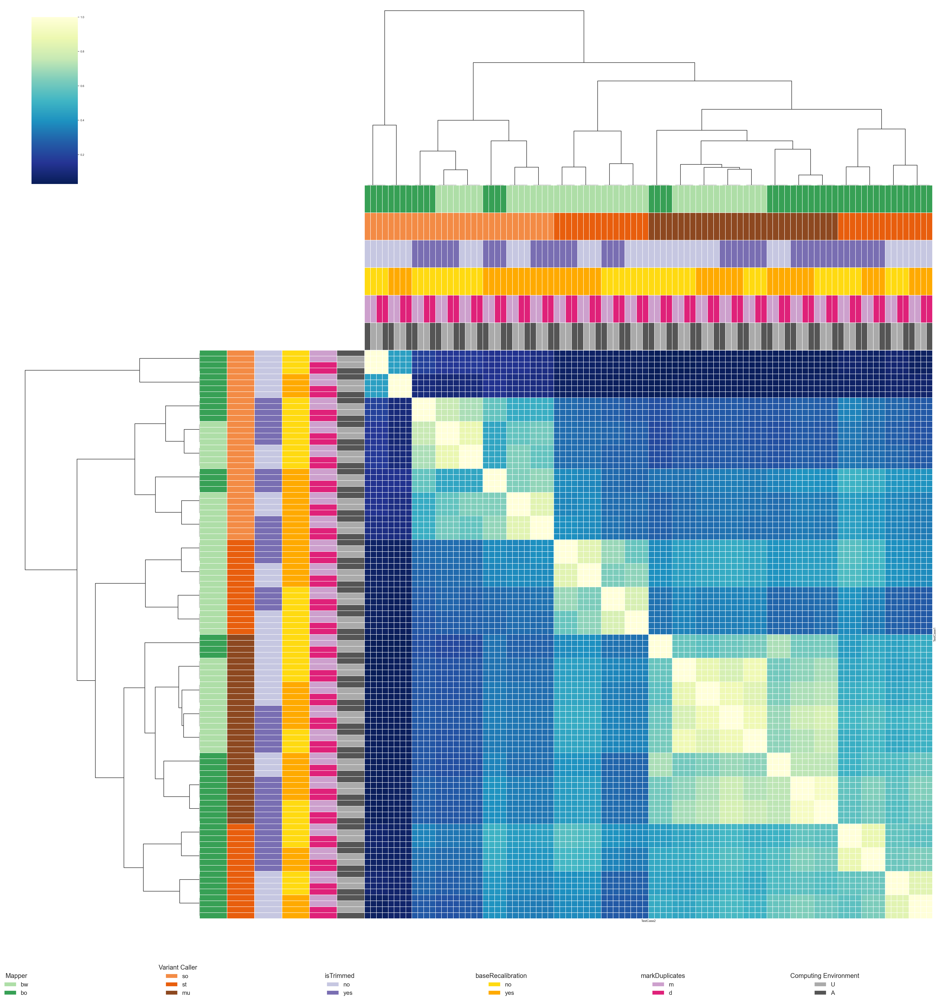

In [41]:
df_nc["Inter/Union"] = df_nc["Inter/Union"].astype(float)
df_generateds_nc = df_nc.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_ll["Inter/Union"] = df_ll["Inter/Union"].astype(float)
df_generateds_ll = df_ll.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_ea["Inter/Union"] = df_ea["Inter/Union"].astype(float)
df_generateds_ea = df_ea.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_fd["Inter/Union"] = df_fd["Inter/Union"].astype(float)
df_generateds_fd = df_fd.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_il["Inter/Union"] = df_il["Inter/Union"].astype(float)
df_generateds_il = df_il.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')


df = df_generateds_fd.copy()

mapper = df.index.str.split('/').str[0]
lut1 = dict(zip(set(mapper), sns.color_palette("Greens", len(set(mapper)))))
row_colors1 = pd.Series(mapper, index=df.index).map(lut1)

variantCollor = df.index.str.split('/').str[1]
lut2 = dict(zip(set(variantCollor), sns.color_palette("Oranges_d", len(set(variantCollor)))))
row_colors2 = pd.Series(variantCollor, index=df.index).map(lut2)

isTrimmed = df.index.str.split('/').str[2]
lut3 = dict(zip(set(isTrimmed), sns.color_palette("Purples", len(set(isTrimmed)))))
row_colors3 = pd.Series(isTrimmed, index=df.index).map(lut3)

baseRecalibration = df.index.str.split('/').str[3]
lut4 = dict(zip(set(baseRecalibration), sns.color_palette("Wistia", len(set(baseRecalibration)))))
row_colors4 = pd.Series(baseRecalibration, index=df.index).map(lut4)

markDuplicates = df.index.str.split('/').str[4]
lut5 = dict(zip(set(markDuplicates), sns.color_palette("PuRd", len(set(markDuplicates)))))
row_colors5 = pd.Series(markDuplicates, index=df.index).map(lut5)

environment = df.index.str.split('/').str[7]
lut6 = dict(zip(set(environment), sns.color_palette("binary", len(set(environment)))))
row_colors6 = pd.Series(environment, index=df.index).map(lut6)

color_array = [row_colors1,row_colors2,row_colors3,row_colors4,row_colors5,row_colors6]
sns.set(font_scale=1)
g = sns.clustermap(df, col_cluster=True, linewidths=0.1, figsize=(50,50),cmap="YlGnBu_r", row_colors=color_array,col_colors=color_array,yticklabels=False,xticklabels=False)

for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(2)

for a in g.ax_col_dendrogram.collections:
    a.set_linewidth(2)
    

from matplotlib.patches import Patch
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch

# Create legends
legends = [lut1, lut2, lut3, lut4, lut5, lut6]
colors = ["Greens", "Oranges_d", "Purples", "Wistia", "PuRd", "binary"]
titles = ["Mapper", "Variant Caller", "isTrimmed", "baseRecalibration", "markDuplicates", "Computing Environment"]
legend_params = {'fontsize': 23, 'title_fontsize': 25}

fig = g.fig

gs = GridSpec(1, 6, figure=fig, wspace=0.5)
for i in range(6):
    ax = fig.add_subplot(gs[0, i])
    handles = [Patch(facecolor=legends[i][name]) for name in legends[i]]
    ax.legend( handles, legends[i], title=titles[i], loc="lower center", frameon=False,bbox_to_anchor=(0,-0.09),**legend_params)
    ax.axis("off")
    
plt.savefig("heatmap_fd.pdf", format="pdf", bbox_inches="tight")

plt.show()


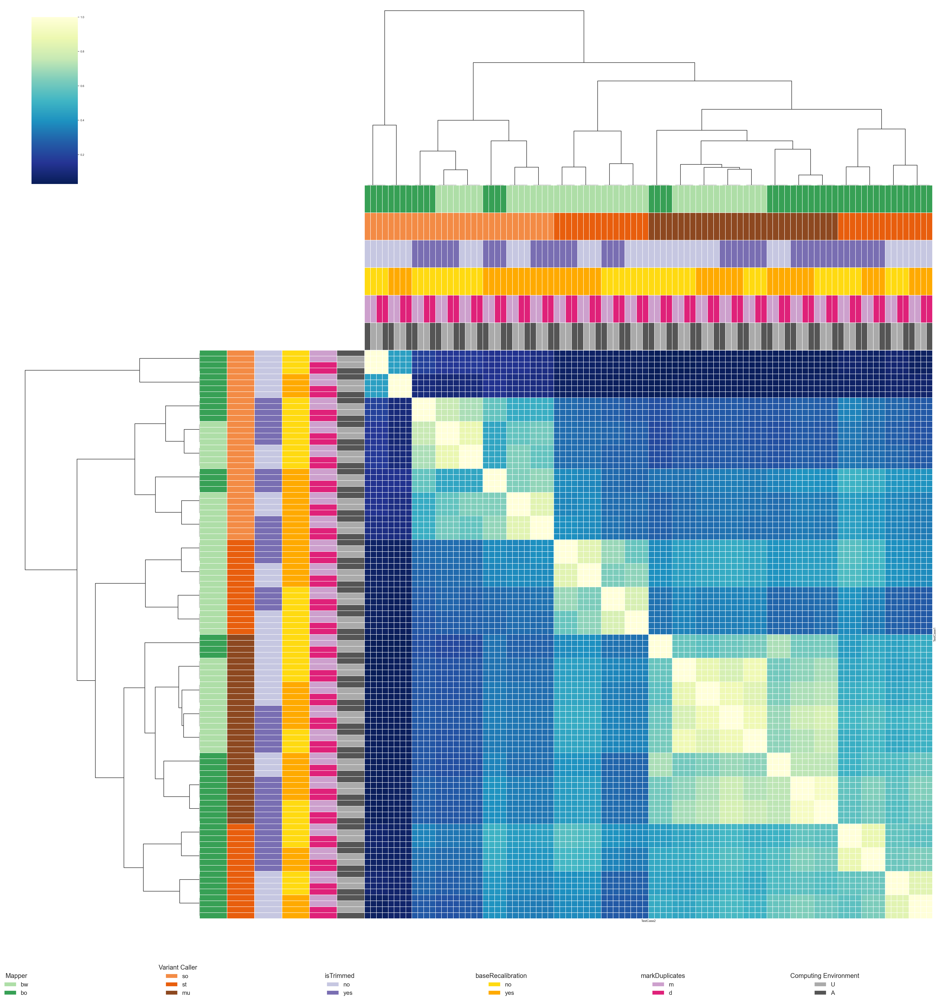

In [42]:
df_nc["Inter/Union"] = df_nc["Inter/Union"].astype(float)
df_generateds_nc = df_nc.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_ll["Inter/Union"] = df_ll["Inter/Union"].astype(float)
df_generateds_ll = df_ll.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_ea["Inter/Union"] = df_ea["Inter/Union"].astype(float)
df_generateds_ea = df_ea.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_fd["Inter/Union"] = df_fd["Inter/Union"].astype(float)
df_generateds_fd = df_fd.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_il["Inter/Union"] = df_il["Inter/Union"].astype(float)
df_generateds_il = df_il.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')


df = df_generateds_fd.copy()

# İstenen isimlendirme eşleştirmeleri
name_mapping = {
    "bwa": "BWA",
    "bowtie": "Bowtie", 
    "bowtie2": "Bowtie",
    "mutect2": "MuTect2",
    "somaticsniper": "SomaticSniper",
    "strelka2": "Strelka2",
    "trm": "TRM",
    "br": "BR"
}

mapper = df.index.str.split('/').str[0].map(lambda x: name_mapping.get(str(x).lower(), x))
lut1 = dict(zip(set(mapper), sns.color_palette("Greens", len(set(mapper)))))
row_colors1 = pd.Series(mapper, index=df.index).map(lut1)

variantCollor = df.index.str.split('/').str[1].map(lambda x: name_mapping.get(str(x).lower(), x))
lut2 = dict(zip(set(variantCollor), sns.color_palette("Oranges_d", len(set(variantCollor)))))
row_colors2 = pd.Series(variantCollor, index=df.index).map(lut2)

isTrimmed = df.index.str.split('/').str[2].map(lambda x: name_mapping.get(str(x).lower(), x))
lut3 = dict(zip(set(isTrimmed), sns.color_palette("Purples", len(set(isTrimmed)))))
row_colors3 = pd.Series(isTrimmed, index=df.index).map(lut3)

baseRecalibration = df.index.str.split('/').str[3].map(lambda x: name_mapping.get(str(x).lower(), x))
lut4 = dict(zip(set(baseRecalibration), sns.color_palette("Wistia", len(set(baseRecalibration)))))
row_colors4 = pd.Series(baseRecalibration, index=df.index).map(lut4)

markDuplicates = df.index.str.split('/').str[4].map(lambda x: name_mapping.get(str(x).lower(), x))
lut5 = dict(zip(set(markDuplicates), sns.color_palette("PuRd", len(set(markDuplicates)))))
row_colors5 = pd.Series(markDuplicates, index=df.index).map(lut5)

environment = df.index.str.split('/').str[7].map(lambda x: name_mapping.get(str(x).lower(), x))
lut6 = dict(zip(set(environment), sns.color_palette("binary", len(set(environment)))))
row_colors6 = pd.Series(environment, index=df.index).map(lut6)

color_array = [row_colors1,row_colors2,row_colors3,row_colors4,row_colors5,row_colors6]
sns.set(font_scale=1)
g = sns.clustermap(df, col_cluster=True, linewidths=0.1, figsize=(50,50),cmap="YlGnBu_r", row_colors=color_array,col_colors=color_array,yticklabels=False,xticklabels=False)

for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(2)

for a in g.ax_col_dendrogram.collections:
    a.set_linewidth(2)
    

from matplotlib.patches import Patch
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch

# Create legends
legends = [lut1, lut2, lut3, lut4, lut5, lut6]
colors = ["Greens", "Oranges_d", "Purples", "Wistia", "PuRd", "binary"]
titles = ["Mapper", "Variant Caller", "isTrimmed", "baseRecalibration", "markDuplicates", "Computing Environment"]
legend_params = {'fontsize': 23, 'title_fontsize': 25}

fig = g.fig

gs = GridSpec(1, 6, figure=fig, wspace=0.5)
for i in range(6):
    ax = fig.add_subplot(gs[0, i])
    handles = [Patch(facecolor=legends[i][name]) for name in legends[i]]
    ax.legend( handles, legends[i], title=titles[i], loc="lower center", frameon=False,bbox_to_anchor=(0,-0.09),**legend_params)
    ax.axis("off")
    
plt.savefig("heatmap_fd.pdf", format="pdf", bbox_inches="tight")

plt.show()

### 4 - Plotting Heatmap with cluster (Indels)

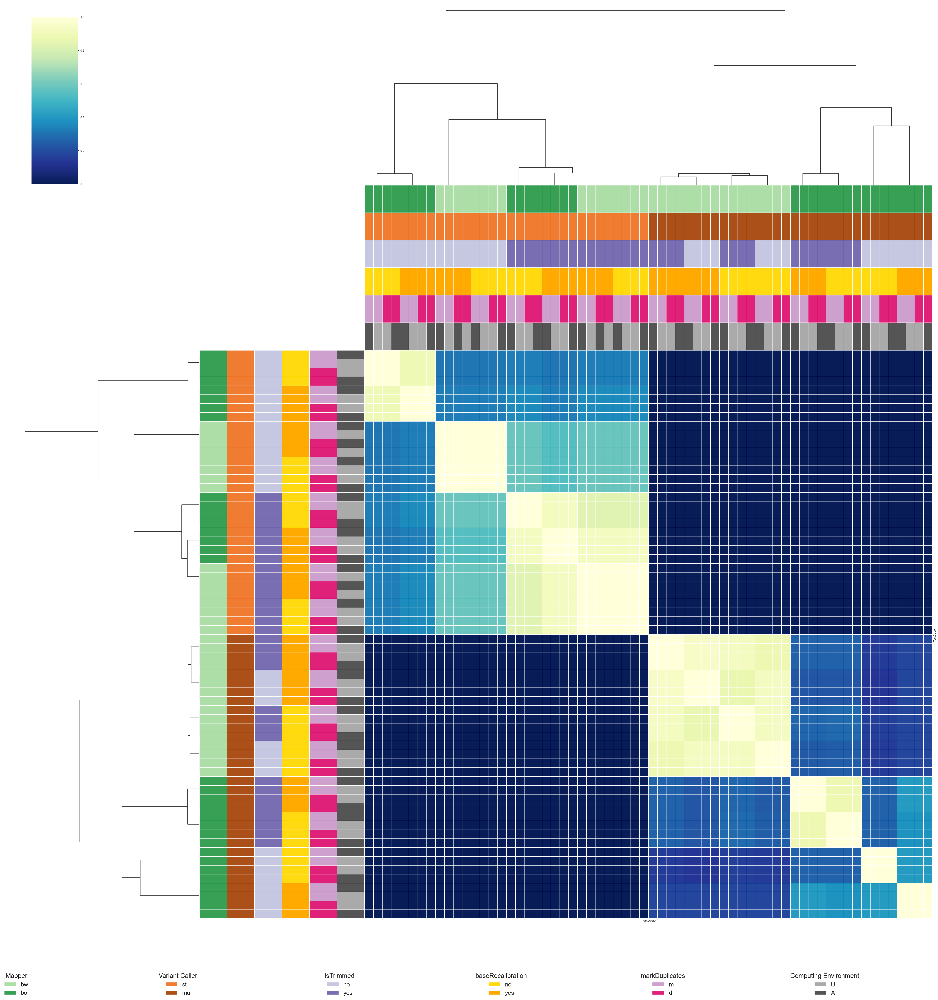

In [43]:
# Convert 'Inter/Union' to float and create pivot tables
df_nc_indels["Inter/Union"] = df_nc_indels["Inter/Union"].astype(float)
df_generateds_nc_indels = df_nc_indels.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_ll_indels["Inter/Union"] = df_ll_indels["Inter/Union"].astype(float)
df_generateds_ll_indels = df_ll_indels.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_ea_indels["Inter/Union"] = df_ea_indels["Inter/Union"].astype(float)
df_generateds_ea_indels = df_ea_indels.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_fd_indels["Inter/Union"] = df_fd_indels["Inter/Union"].astype(float)
df_generateds_fd_indels = df_fd_indels.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df_il_indels["Inter/Union"] = df_il_indels["Inter/Union"].astype(float)
df_generateds_il_indels = df_il_indels.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')

df = df_generateds_fd_indels.copy()

mapper = df.index.str.split('/').str[0]
lut1 = dict(zip(set(mapper), sns.color_palette("Greens", len(set(mapper)))))
row_colors1 = pd.Series(mapper, index=df.index).map(lut1)

variantCollor = df.index.str.split('/').str[1]
lut2 = dict(zip(set(variantCollor), sns.color_palette("Oranges_d", len(set(variantCollor)))))
row_colors2 = pd.Series(variantCollor, index=df.index).map(lut2)

isTrimmed = df.index.str.split('/').str[2]
lut3 = dict(zip(set(isTrimmed), sns.color_palette("Purples", len(set(isTrimmed)))))
row_colors3 = pd.Series(isTrimmed, index=df.index).map(lut3)

baseRecalibration = df.index.str.split('/').str[3]
lut4 = dict(zip(set(baseRecalibration), sns.color_palette("Wistia", len(set(baseRecalibration)))))
row_colors4 = pd.Series(baseRecalibration, index=df.index).map(lut4)

markDuplicates = df.index.str.split('/').str[4]
lut5 = dict(zip(set(markDuplicates), sns.color_palette("PuRd", len(set(markDuplicates)))))
row_colors5 = pd.Series(markDuplicates, index=df.index).map(lut5)

environment = df.index.str.split('/').str[7]
lut6 = dict(zip(set(environment), sns.color_palette("binary", len(set(environment)))))
row_colors6 = pd.Series(environment, index=df.index).map(lut6)

color_array = [row_colors1,row_colors2,row_colors3,row_colors4,row_colors5,row_colors6]
sns.set(font_scale=1)
g = sns.clustermap(df, col_cluster=True, linewidths=0.1, figsize=(50,50),cmap="YlGnBu_r", row_colors=color_array,col_colors=color_array,yticklabels=False,xticklabels=False)

for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(2)

for a in g.ax_col_dendrogram.collections:
    a.set_linewidth(2)
    

from matplotlib.patches import Patch
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch

# Create legends
legends = [lut1, lut2, lut3, lut4, lut5, lut6]
colors = ["Greens", "Oranges_d", "Purples", "Wistia", "PuRd", "binary"]
titles = ["Mapper", "Variant Caller", "isTrimmed", "baseRecalibration", "markDuplicates", "Computing Environment"]
legend_params = {'fontsize': 23, 'title_fontsize': 25}

fig = g.fig

gs = GridSpec(1, 6, figure=fig, wspace=0.5)
for i in range(6):
    ax = fig.add_subplot(gs[0, i])
    handles = [Patch(facecolor=legends[i][name]) for name in legends[i]]
    ax.legend( handles, legends[i], title=titles[i], loc="lower center", frameon=False,bbox_to_anchor=(0,-0.09),**legend_params)
    ax.axis("off")
    
plt.savefig("heatmap_fd_indels.pdf", format="pdf", bbox_inches="tight")

plt.show()


In [44]:
df = df_generateds_fd.copy()
df = df[~(df.index.str.split('/').str[1].str.lower() == 'st')]
# Satırları filtreleyelim:
df = df[df.index.map(lambda x: x.split('/')[5]).isin(selected_cases)]
# Sütunları filtreleyelim:
df = df.loc[:, df.columns.map(lambda x: x.split('/')[5]).isin(selected_cases)]
data = df.values.flatten()


NameError: name 'selected_cases' is not defined

In [ ]:
# Histogram grafiğini oluşturup KDE ekliyoruz:
sns.histplot(data, kde=True).set(title='Intersection/Union Distribution')

plt.show()

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.gridspec import GridSpec

# -------------------------------------------------------------------
# Pivot tablonuzun (df_generateds_fd) önceden oluşturulduğunu varsayıyoruz:
# Örneğin:
# df_fd["Inter/Union"] = df_fd["Inter/Union"].astype(float)
# df_generateds_fd = df_fd.pivot_table(index='TestCase1', columns='TestCase2', values='Inter/Union')
# -------------------------------------------------------------------

# Kopya alalım:
df = df_generateds_ll.copy()

# --- (İsteğe bağlı) VariantCaller "st" (strelka) olan satırları çıkarma ---
# Eğer etiketin ikinci parçası "st" ise, bu satırları kaldırmak için:
df = df[~(df.index.str.split('/').str[1].str.lower() == 'st')]

# --- Test case filtrelemesi ---
# Test case numarası etiketin 6. parçasında yer alıyor (index 5)
selected_cases_FD = {'583','584','587','588','595','596','599','600','607','608','611','612','619','620','623','624'}
selected_cases_EA= {'148','154','160','166','172','178','184','190','244','250','256','262','268','274','280','286'}
selected_cases_IL = {'769','770','771','772','773','774','775','776','785','786','787','788','789','790','791','792'}
selected_cases_LL ={'147','153','159','165','171','177','183','189','243','249','255','261','267','273','279','285'}

selected_cases= selected_cases_LL
# Satırları filtreleyelim:
df = df[df.index.map(lambda x: x.split('/')[5]).isin(selected_cases)]
# Sütunları filtreleyelim:
df = df.loc[:, df.columns.map(lambda x: x.split('/')[5]).isin(selected_cases)]

# --- Renk Atamaları (Satırlar için) ---
# Satır etiketleri "/" karakteriyle ayrılmış, örneğin "bo/mu/no/no/d/614/fd/U"
split_index = df.index.str.split('/')
mapper = split_index.str[0]
lut1 = dict(zip(set(mapper), sns.color_palette("Greens", len(set(mapper)))))
row_colors1 = pd.Series(mapper, index=df.index).map(lut1)

variantCaller = split_index.str[1]
lut2 = dict(zip(set(variantCaller), sns.color_palette("Oranges_d", len(set(variantCaller)))))
row_colors2 = pd.Series(variantCaller, index=df.index).map(lut2)

isTrimmed = split_index.str[2]
lut3 = dict(zip(set(isTrimmed), sns.color_palette("Purples", len(set(isTrimmed)))))
row_colors3 = pd.Series(isTrimmed, index=df.index).map(lut3)

baseRecalibration = split_index.str[3]
lut4 = dict(zip(set(baseRecalibration), sns.color_palette("Wistia", len(set(baseRecalibration)))))
row_colors4 = pd.Series(baseRecalibration, index=df.index).map(lut4)


# Birleştirilmiş satır renkleri:
row_color_array = [row_colors1, row_colors2, row_colors3, row_colors4]

# --- Renk Atamaları (Sütunlar için) ---
split_cols = df.columns.str.split('/')
mapper_col = split_cols.str[0]
lut1_col = dict(zip(set(mapper_col), sns.color_palette("Greens", len(set(mapper_col)))))
col_colors1 = pd.Series(mapper_col, index=df.columns).map(lut1_col)

variantCaller_col = split_cols.str[1]
lut2_col = dict(zip(set(variantCaller_col), sns.color_palette("Oranges_d", len(set(variantCaller_col)))))
col_colors2 = pd.Series(variantCaller_col, index=df.columns).map(lut2_col)

isTrimmed_col = split_cols.str[2]
lut3_col = dict(zip(set(isTrimmed_col), sns.color_palette("Purples", len(set(isTrimmed_col)))))
col_colors3 = pd.Series(isTrimmed_col, index=df.columns).map(lut3_col)

baseRecal_col = split_cols.str[3]
lut4_col = dict(zip(set(baseRecal_col), sns.color_palette("Wistia", len(set(baseRecal_col)))))
col_colors4 = pd.Series(baseRecal_col, index=df.columns).map(lut4_col)


col_color_array = [col_colors1, col_colors2, col_colors3, col_colors4]

# --- Clustered Heatmap Oluşturma ---
sns.set(font_scale=1)
g = sns.clustermap(
    df,
    col_cluster=True,
    linewidths=0.5,
    figsize=(16, 12),
    cmap="YlGnBu_r",
    annot=True,
    fmt=".3f",
    row_colors=row_color_array,
    col_colors=col_color_array
)
g.ax_heatmap.set_title('Clustered F-measure Heatmap for VCF Comparisons - Intersection/Union', pad=250, size=20)

# Dendrogram çizgilerinin kalınlığını ayarlayalım:
for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(1)
for a in g.ax_col_dendrogram.collections:
    a.set_linewidth(1)

# --- Legend Oluşturma ---
legend_dicts = [lut1, lut2, lut3, lut4, lut5]
titles = ["Mapper", "Variant Caller", "isTrimmed", "baseRecalibration"]
legend_params = {'fontsize': 12, 'title_fontsize': 14}

fig = g.fig
gs = GridSpec(1, 4, figure=fig, wspace=0.5)
for i in range(4):
    ax = fig.add_subplot(gs[0, i])
    handles = [Patch(facecolor=legend_dicts[i][name]) for name in legend_dicts[i]]
    labels = list(legend_dicts[i].keys())
    ax.legend(handles, labels, title=titles[i], loc="center", frameon=False,
              bbox_to_anchor=(0, -0.3), **legend_params)
    ax.axis("off")

plt.savefig("Clustered F-measure Heatmap for VCF Comparisons - Intersection-Union.png", bbox_inches="tight")
plt.show()


## Step 7- Mean of Intersection/Union

### 1- Visualizing Mean Intersection/Union Values (SNPs)

In [ ]:
# Filter conditions
conditions = [
    (df_generateds_r_p['TestCase1'].str.split('/').str[:5] == df_generateds_r_p['TestCase2'].str.split('/').str[:5]),
    (df_generateds_r_p['TestCase1'].str.split('/').str[7] != df_generateds_r_p['TestCase2'].str.split('/').str[7])
]

# Apply filters
filtered_df = df_generateds_r_p[conditions[0] & conditions[1]]

# Print the filtered DataFrame
filtered_df.head()

In [ ]:
df_generateds_r_p.head()

In [ ]:
# 1) Cache ve figure dizinleri
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# 2) Cache dosya adları
pairs_csv    = os.path.join(save_path, "df_generateds_r_p.csv")
grouped_csv  = os.path.join(save_path, "grouped_inter_union.csv")

# 3) df_generateds_r_p yükle veya hata fırlat
if os.path.exists(pairs_csv):
    df_generateds_r_p = pd.read_csv(pairs_csv)
    print("🎉 Loaded df_generateds_r_p from cache.")
else:
    raise FileNotFoundError(f"{pairs_csv} not found. Please compute and save it first.")

# 4) grouped_df yükle veya hesapla ve kaydet
if os.path.exists(grouped_csv):
    grouped_df = pd.read_csv(grouped_csv)
    print("🎉 Loaded grouped_df from cache.")
else:
    df_copy = df_generateds_r_p.copy()

    df_copy[['Mapper1','VariantCaller1','IsTrimmed1','BaseRecalibration1',
             'MarkingDuplicates1','TestCaseNo1','Sample1','Environment1']] = (
        df_copy['TestCase1'].str.split('/', expand=True)
    )
    df_copy[['Mapper2','VariantCaller2','IsTrimmed2','BaseRecalibration2',
             'MarkingDuplicates2','TestCaseNo2','Sample2','Environment2']] = (
        df_copy['TestCase2'].str.split('/', expand=True)
    )

    # ensure numeric for Inter/Union
    df_copy['Inter/Union'] = pd.to_numeric(df_copy['Inter/Union'], errors='coerce')

    def mean_by_param(mask, param_name):
        df = df_copy[mask]
        return (
            df.groupby('Sample1')['Inter/Union']
              .mean()
              .reset_index()
              .assign(Parameter=param_name)
        )

    grouped_df_e  = mean_by_param(
        (df_copy['Mapper1']==df_copy['Mapper2']) &
        (df_copy['VariantCaller1']==df_copy['VariantCaller2']) &
        (df_copy['BaseRecalibration1']==df_copy['BaseRecalibration2']) &
        (df_copy['MarkingDuplicates1']==df_copy['MarkingDuplicates2']) &
        (df_copy['Sample1']==df_copy['Sample2']) &
        (df_copy['IsTrimmed1']==df_copy['IsTrimmed2']) &
        (df_copy['Environment1']!=df_copy['Environment2']),
        'Computing Environment'
    )
    grouped_df_m  = mean_by_param(
        (df_copy['Mapper1']!=df_copy['Mapper2']) &
        (df_copy['VariantCaller1']==df_copy['VariantCaller2']) &
        (df_copy['BaseRecalibration1']==df_copy['BaseRecalibration2']) &
        (df_copy['MarkingDuplicates1']==df_copy['MarkingDuplicates2']) &
        (df_copy['Sample1']==df_copy['Sample2']) &
        (df_copy['IsTrimmed1']==df_copy['IsTrimmed2']) &
        (df_copy['Environment1']==df_copy['Environment2']),
        'Mapper'
    )
    grouped_df_vc = mean_by_param(
        (df_copy['Mapper1']==df_copy['Mapper2']) &
        (df_copy['VariantCaller1']!=df_copy['VariantCaller2']) &
        (df_copy['BaseRecalibration1']==df_copy['BaseRecalibration2']) &
        (df_copy['MarkingDuplicates1']==df_copy['MarkingDuplicates2']) &
        (df_copy['Sample1']==df_copy['Sample2']) &
        (df_copy['IsTrimmed1']==df_copy['IsTrimmed2']) &
        (df_copy['Environment1']==df_copy['Environment2']),
        'Variant Caller'
    )
    grouped_df_br = mean_by_param(
        (df_copy['Mapper1']==df_copy['Mapper2']) &
        (df_copy['VariantCaller1']==df_copy['VariantCaller2']) &
        (df_copy['BaseRecalibration1']!=df_copy['BaseRecalibration2']) &
        (df_copy['MarkingDuplicates1']==df_copy['MarkingDuplicates2']) &
        (df_copy['Sample1']==df_copy['Sample2']) &
        (df_copy['IsTrimmed1']==df_copy['IsTrimmed2']) &
        (df_copy['Environment1']==df_copy['Environment2']),
        'Base Recalibration'
    )
    grouped_df_md = mean_by_param(
        (df_copy['Mapper1']==df_copy['Mapper2']) &
        (df_copy['VariantCaller1']==df_copy['VariantCaller2']) &
        (df_copy['BaseRecalibration1']==df_copy['BaseRecalibration2']) &
        (df_copy['MarkingDuplicates1']!=df_copy['MarkingDuplicates2']) &
        (df_copy['Sample1']==df_copy['Sample2']) &
        (df_copy['IsTrimmed1']==df_copy['IsTrimmed2']) &
        (df_copy['Environment1']==df_copy['Environment2']),
        'Mark Duplicates'
    )
    grouped_df_it = mean_by_param(
        (df_copy['Mapper1']==df_copy['Mapper2']) &
        (df_copy['VariantCaller1']==df_copy['VariantCaller2']) &
        (df_copy['BaseRecalibration1']==df_copy['BaseRecalibration2']) &
        (df_copy['MarkingDuplicates1']==df_copy['MarkingDuplicates2']) &
        (df_copy['Sample1']==df_copy['Sample2']) &
        (df_copy['IsTrimmed1']!=df_copy['IsTrimmed2']) &
        (df_copy['Environment1']==df_copy['Environment2']),
        'Trimming'
    )

    grouped_df = pd.concat([
        grouped_df_e, grouped_df_m, grouped_df_vc,
        grouped_df_br, grouped_df_md, grouped_df_it
    ], ignore_index=True)
    grouped_df['Sample1'] = grouped_df['Sample1'].str.upper()

    grouped_df.to_csv(grouped_csv, index=False)
    print(f"✅ Computed and cached grouped_df to {grouped_csv}")

# 5) Özet
print(grouped_df.head())

# 6) Plotting
sns.set(style="ticks")
palette = sns.color_palette("muted")

plt.figure(figsize=(12, 3))
ax = sns.barplot(
    data=grouped_df,
    x='Parameter',
    y='Inter/Union',
    hue='Sample1',
    ci=None,
    palette=palette
)
for p in ax.patches:
    ax.annotate(
        f"{p.get_height():.2f}",
        (p.get_x() + p.get_width() / 2, p.get_height()),
        ha='center', va='bottom', fontsize=7
    )
ax.set(xticklabels=[])
ax.tick_params(bottom=False)
ax.set(xlabel=None)
plt.ylabel('Mean Intersection/Union by Centers')
plt.title('Comparison of Variant Calling Parameters - Mean Intersection/Union by Centers (SNPs)')
plt.legend(title='Centers', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()

# 7) Kaydet: PNG & PDF
png_file = os.path.join(fig_path, "param_inter_union_bar.png")
pdf_file = os.path.join(fig_path, "param_inter_union_bar.pdf")
plt.savefig(png_file, dpi=300, bbox_inches="tight")
plt.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")

plt.show()


### 2- Visualizing Mean Intersection/Union Values (Indels)

In [ ]:
# Filter conditions
conditions = [
    (df_generateds_r_p_indels['TestCase1'].str.split('/').str[:5] == df_generateds_r_p_indels['TestCase2'].str.split('/').str[:5]),
    (df_generateds_r_p_indels['TestCase1'].str.split('/').str[7] != df_generateds_r_p_indels['TestCase2'].str.split('/').str[7])
]

# Apply filters
filtered_df_indels = df_generateds_r_p_indels[conditions[0] & conditions[1]]

# Print the filtered DataFrame
filtered_df_indels.head()

In [ ]:
# Assume df_generateds_r_p_indels is already loaded into df_generateds_r_p_indels
df = df_generateds_r_p_indels.copy()

# Filter rows where Inter/Union is 0.0
df_filtered = df[df["Inter/Union"] == 0.0].copy()

In [ ]:
len(df_filtered)/len(df_generateds_r_p_indels)

In [ ]:
df_generateds_r_p_indels.head()

In [ ]:
# Assuming df_generateds_r_p_indels is already loaded in the environment

# 1) Figure dizinini oluştur
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# 2) Verileri hazırlama (hesaplamalar aynen bırakıldı)
df_copy = df_generateds_r_p_indels.copy()

df_copy[['Mapper1','VariantCaller1','IsTrimmed1','BaseRecalibration1',
         'MarkingDuplicates1','TestCaseNo1','Sample1','Environment1']] = \
    df_copy['TestCase1'].str.split('/', expand=True)
df_copy[['Mapper2','VariantCaller2','IsTrimmed2','BaseRecalibration2',
         'MarkingDuplicates2','TestCaseNo2','Sample2','Environment2']] = \
    df_copy['TestCase2'].str.split('/', expand=True)

filtered_df_environment = df_copy[
    (df_copy['Mapper1'] == df_copy['Mapper2']) &
    (df_copy['VariantCaller1'] == df_copy['VariantCaller2']) &
    (df_copy['BaseRecalibration1'] == df_copy['BaseRecalibration2']) &
    (df_copy['MarkingDuplicates1'] == df_copy['MarkingDuplicates2']) &
    (df_copy['Sample1'] == df_copy['Sample2']) &
    (df_copy['IsTrimmed1'] == df_copy['IsTrimmed2']) &
    (df_copy['Environment1'] != df_copy['Environment2'])
]
filtered_df_environment['Inter/Union'] = pd.to_numeric(
    filtered_df_environment['Inter/Union'], errors='coerce'
)
grouped_df_e = filtered_df_environment.groupby('Sample1')['Inter/Union']\
    .mean().reset_index()
grouped_df_e['Parameter'] = 'Computing Environment'

filtered_df_mapper = df_copy[
    (df_copy['Mapper1'] != df_copy['Mapper2']) &
    (df_copy['VariantCaller1'] == df_copy['VariantCaller2']) &
    (df_copy['BaseRecalibration1'] == df_copy['BaseRecalibration2']) &
    (df_copy['MarkingDuplicates1'] == df_copy['MarkingDuplicates2']) &
    (df_copy['Sample1'] == df_copy['Sample2']) &
    (df_copy['IsTrimmed1'] == df_copy['IsTrimmed2']) &
    (df_copy['Environment1'] == df_copy['Environment2'])
]
filtered_df_mapper['Inter/Union'] = pd.to_numeric(
    filtered_df_mapper['Inter/Union'], errors='coerce'
)
grouped_df_m = filtered_df_mapper.groupby('Sample1')['Inter/Union']\
    .mean().reset_index()
grouped_df_m['Parameter'] = 'Mapper'

filtered_df_variantCaller = df_copy[
    (df_copy['Mapper1'] == df_copy['Mapper2']) &
    (df_copy['VariantCaller1'] != df_copy['VariantCaller2']) &
    (df_copy['BaseRecalibration1'] == df_copy['BaseRecalibration2']) &
    (df_copy['MarkingDuplicates1'] == df_copy['MarkingDuplicates2']) &
    (df_copy['Sample1'] == df_copy['Sample2']) &
    (df_copy['IsTrimmed1'] == df_copy['IsTrimmed2']) &
    (df_copy['Environment1'] == df_copy['Environment2'])
]
filtered_df_variantCaller['Inter/Union'] = pd.to_numeric(
    filtered_df_variantCaller['Inter/Union'], errors='coerce'
)
grouped_df_vc = filtered_df_variantCaller.groupby('Sample1')['Inter/Union']\
    .mean().reset_index()
grouped_df_vc['Parameter'] = 'Variant Caller'

filtered_df_baseRecalibration = df_copy[
    (df_copy['Mapper1'] == df_copy['Mapper2']) &
    (df_copy['VariantCaller1'] == df_copy['VariantCaller2']) &
    (df_copy['BaseRecalibration1'] != df_copy['BaseRecalibration2']) &
    (df_copy['MarkingDuplicates1'] == df_copy['MarkingDuplicates2']) &
    (df_copy['Sample1'] == df_copy['Sample2']) &
    (df_copy['IsTrimmed1'] == df_copy['IsTrimmed2']) &
    (df_copy['Environment1'] == df_copy['Environment2'])
]
filtered_df_baseRecalibration['Inter/Union'] = pd.to_numeric(
    filtered_df_baseRecalibration['Inter/Union'], errors='coerce'
)
grouped_df_br = filtered_df_baseRecalibration.groupby('Sample1')['Inter/Union']\
    .mean().reset_index()
grouped_df_br['Parameter'] = 'Base Recalibration'

filtered_df_markDuplicates = df_copy[
    (df_copy['Mapper1'] == df_copy['Mapper2']) &
    (df_copy['VariantCaller1'] == df_copy['VariantCaller2']) &
    (df_copy['BaseRecalibration1'] == df_copy['BaseRecalibration2']) &
    (df_copy['MarkingDuplicates1'] != df_copy['MarkingDuplicates2']) &
    (df_copy['Sample1'] == df_copy['Sample2']) &
    (df_copy['IsTrimmed1'] == df_copy['IsTrimmed2']) &
    (df_copy['Environment1'] == df_copy['Environment2'])
]
filtered_df_markDuplicates['Inter/Union'] = pd.to_numeric(
    filtered_df_markDuplicates['Inter/Union'], errors='coerce'
)
grouped_df_md = filtered_df_markDuplicates.groupby('Sample1')['Inter/Union']\
    .mean().reset_index()
grouped_df_md['Parameter'] = 'Mark Duplicates'

filtered_df_isTrimmed = df_copy[
    (df_copy['Mapper1'] == df_copy['Mapper2']) &
    (df_copy['VariantCaller1'] == df_copy['VariantCaller2']) &
    (df_copy['BaseRecalibration1'] == df_copy['BaseRecalibration2']) &
    (df_copy['MarkingDuplicates1'] == df_copy['MarkingDuplicates2']) &
    (df_copy['Sample1'] == df_copy['Sample2']) &
    (df_copy['IsTrimmed1'] != df_copy['IsTrimmed2']) &
    (df_copy['Environment1'] == df_copy['Environment2'])
]
filtered_df_isTrimmed['Inter/Union'] = pd.to_numeric(
    filtered_df_isTrimmed['Inter/Union'], errors='coerce'
)
grouped_df_it = filtered_df_isTrimmed.groupby('Sample1')['Inter/Union']\
    .mean().reset_index()
grouped_df_it['Parameter'] = 'Trimming'

# Concatenating all the grouped DataFrames
grouped_df = pd.concat(
    [grouped_df_e, grouped_df_m, grouped_df_vc, grouped_df_br, grouped_df_md, grouped_df_it],
    ignore_index=True
)
grouped_df['Sample1'] = grouped_df['Sample1'].str.upper()

# 3) Plotting
sns.set(style="ticks")
plt.figure(figsize=(12, 3))
ax = sns.barplot(
    data=grouped_df,
    x='Parameter',
    y='Inter/Union',
    hue='Sample1',
    ci=None,
    palette=sns.color_palette("muted")
)
for p in ax.patches:
    ax.annotate(
        f"{p.get_height():.2f}",
        (p.get_x() + p.get_width() / 2, p.get_height()),
        ha='center', va='bottom', fontsize=8
    )
ax.set(xticklabels=[])
ax.tick_params(bottom=False)
ax.set(xlabel=None)
plt.ylabel('Mean Intersection/Union by Centers')
plt.title('Comparison of Variant Calling Parameters - Mean Intersection/Union by Centers (Indels)')
plt.legend(title='Centers', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()

# 4) Sadece figure’leri kaydet
png_file = os.path.join(fig_path, "indel_param_inter_union_bar.png")
pdf_file = os.path.join(fig_path, "indel_param_inter_union_bar.pdf")
plt.savefig(png_file, dpi=300, bbox_inches="tight")
plt.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")


## Step 8- Recall / Precision / F1-Score

### 1- Calculation of Inter/Union, Precision, Recall, f1_score (SNPs)

In [45]:
vcfcomparison_df_full

,TestCaseNo,phase,Sample,operatingSystem,Environment,isTrimmed,baseRecalibration,Mapper,M_Version,VariantCaller,VC_Version,ReferenceGenom,Duplicates,VariantFilter,FilterPass,SOMATICfilter,remove_indels,TMB,FileLink,Result VCF Count,Author,Slurm_id,Node,ElapsedTime
0,TestCase 2,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.613695,https://drive.google.com/drive/folders/11CFGjN...,1261,GUL EDA,29812.0,a047,07:15:00
1,TestCase 8,done,EA,Linux,Altay + COSAP,NO,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.799425,https://drive.google.com/drive/folders/1I7r5au...,1276,GUL EDA,29812.0,a047,06:12:47
2,TestCase 14,done,EA,Linux,Altay + COSAP,YES,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,16.009919,https://drive.google.com/drive/folders/1AN-msy...,1293,GUL EDA,29812.0,a047,05:48:51
3,TestCase 20,done,EA,Linux,Altay + COSAP,NO,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.316527,https://drive.google.com/drive/folders/1hhxI84...,1237,GUL EDA,29812.0,a047,07:44:08
4,TestCase 26,done,EA,Linux,Altay + COSAP,YES,YES,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.397318,https://drive.google.com/drive/folders/1sxq7kO...,1082,GUL EDA,29811.0,a078,07:36:41
5,TestCase 32,done,EA,Linux,Altay + COSAP,NO,NO,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.545902,https://drive.google.com/drive/folders/1aU_EFn...,1094,GUL EDA,29811.0,a078,09:57:30
6,TestCase 38,done,EA,Linux,Altay + COSAP,YES,NO,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.830688,https://drive.google.com/drive/folders/1Zi72RD...,1117,GUL EDA,29811.0,a078,06:05:48
7,TestCase 44,done,EA,Linux,Altay + COSAP,NO,YES,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.310644,https://drive.google.com/drive/folders/1L-ZfgL...,1075,GUL EDA,29811.0,a078,10:37:11
8,TestCase 50,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Strelka,NaN,hg38,MARK,NaN,NaN,NaN,NaN,23.711520,https://drive.google.com/drive/folders/1RmzNj5...,1915,GUL EDA,29813.0,a063,03:34:43
9,TestCase 56,done,EA,Linux,Altay + COSAP,NO,NO,BWA,NaN,Strelka,NaN,hg38,MARK,NaN,NaN,NaN,NaN,27.797578,https://drive.google.com/drive/folders/1UAhDec...,2245,GUL EDA,29813.0,a063,01:39:41


In [46]:
df_generateds_r_p_VALIDATED =  pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall","f1_score"])

for key in tqdm(sets_dict):
    for index, row in vcfcomparison_df_full.iterrows():
        if key == row['TestCaseNo'].split(' ')[1]:
            if row['Environment'] == 'Uhem + COSAP':
                env_name = "s"
            elif row['Environment'] == 'Altay + COSAP':
                env_name = "a"
            newKey = (row['Mapper'] + '/' + row['VariantCaller']+ '/' + row['isTrimmed'] + '/' + row['baseRecalibration'] + '/' + row['Duplicates'][0] + '/' + key + '/' + row['Sample'] + '/' + env_name).lower() 
            df_generateds_r_p_VALIDATED.loc[len(df_generateds_r_p_VALIDATED.index)] = [newKey, intersection_over_union(sets_dict[key],high_confidence),get_precision(sets_dict[key],high_confidence),get_recall(sets_dict[key],high_confidence), get_f1score(sets_dict[key],high_confidence)]


100%|█████████████████████████████████████████| 480/480 [00:05<00:00, 89.06it/s]


In [47]:
df_generateds_r_p_VALIDATED.head()
#df_generateds_r_p_VALIDATED.to_csv('df_generateds_r_p_VALIDATED.csv')

,TestCase,Inter/Union,Precision,Recall,f1_score
0,bwa/mutect/yes/yes/m/2/ea/a,0.747475,0.821570,0.892334,0.855491
1,bwa/mutect/no/no/m/8/ea/a,0.745702,0.815831,0.896641,0.854329
2,bwa/mutect/yes/no/m/14/ea/a,0.733051,0.802784,0.894057,0.845966
3,bwa/mutect/no/yes/m/20/ea/a,0.763235,0.839127,0.894057,0.865721
4,bowtie/mutect/yes/yes/m/26/ea/a,0.814725,0.930684,0.867356,0.897905


In [48]:
df = df_generateds_r_p_VALIDATED.copy()

mapping_dict = {
    'Environment': {'Uhem + COSAP': 'sarıyer', '': 'altay'},
    'isTrimmed': {'YES': 'YES', '': 'NO'},
    'baseRecalibration': {'YES': 'YES', '': 'NO'},
    'Duplicates': {'MARK': 'MARK', '': 'DELETE'},
    'Mapper': {'BWA': 'BWA', '': 'BOWTIE'},
    'VariantCaller': {'Mutect': 'Mutect', 'SomaticSniper': 'SomaticSniper', '': 'Strelka'},
    'Sample': {'LL': 'll', 'NC': 'nc', 'EA': 'ea', 'FD': 'fd', 'IL': 'il'}
}

default_values = {
    'Environment': 'altay',
    'isTrimmed': 'NO',
    'baseRecalibration': 'NO',
    'Duplicates': 'DELETE',
    'Mapper': 'BOWTIE',
    'VariantCaller': 'Strelka',
    'Sample': ''
}

for index, row in tqdm(df.iterrows()):
    for index1, row2 in vcfcomparison_df_full.iterrows():
        if row["TestCase"].split('/')[5] == row2["TestCaseNo"].split(' ')[1]:
            for column, mapping in mapping_dict.items():
                value = mapping.get(row2[column])
                if value is None:
                    value = default_values.get(column)
                df.at[index, column] = value

480it [00:05, 90.44it/s]


In [49]:
df_dict = {category.lower(): pd.DataFrame(columns=["TestCase", "Inter/Union", "Precision", "Recall", "f1_score"]) for category in categories}

for index, row in tqdm(df.iterrows()):
    category = row['TestCase'].split('/')[6]
    df_category = df_dict.get(category, pd.DataFrame())
    df_category.loc[len(df_category.index)] = row


480it [00:00, 1481.72it/s]


### 2- Scatter Plot of Precision vs. Recall, Grouped by Centers, and Differentiated by Mapper and Variant Caller (SNPs)

In [50]:

# Seçmek istediğimiz test case numaraları (string olarak):
selected_cases = {'583','584','587','588','595','596','599','600','607','608','611','612','619','620','623','624'}

# "TestCase" sütunundaki değeri "/" karakterine göre bölüp 6. parçayı (index 5) alarak filtreleme yapalım:
df_selected = df[df['TestCase'].apply(lambda x: x.split('/')[5]).isin(selected_cases)]


len(df_selected)


16

In [51]:
df_selected

,TestCase,Inter/Union,Precision,Recall,f1_score,Environment,isTrimmed,baseRecalibration,Duplicates,Mapper,VariantCaller,Sample
246,bwa/mutect/yes/yes/m/583/fd/s,0.623179,0.729457,0.810508,0.767850,sarıyer,YES,YES,MARK,BWA,Mutect,fd
247,bowtie/mutect/yes/yes/m/584/fd/s,0.711690,0.895626,0.776055,0.831564,sarıyer,YES,YES,MARK,BOWTIE,Mutect,fd
250,bwa/somaticsniper/yes/yes/m/587/fd/s,0.347117,0.392007,0.751938,0.515348,sarıyer,YES,YES,MARK,BWA,SomaticSniper,fd
251,bowtie/somaticsniper/yes/yes/m/588/fd/s,0.385708,0.461234,0.701981,0.556694,sarıyer,YES,YES,MARK,BOWTIE,SomaticSniper,fd
258,bwa/mutect/yes/no/m/595/fd/s,0.590852,0.684325,0.812231,0.742812,sarıyer,YES,NO,MARK,BWA,Mutect,fd
259,bowtie/mutect/yes/no/m/596/fd/s,0.684766,0.846226,0.782084,0.812892,sarıyer,YES,NO,MARK,BOWTIE,Mutect,fd
262,bwa/somaticsniper/yes/no/m/599/fd/s,0.254924,0.274629,0.780362,0.406278,sarıyer,YES,NO,MARK,BWA,SomaticSniper,fd
263,bowtie/somaticsniper/yes/no/m/600/fd/s,0.266167,0.294606,0.733850,0.420429,sarıyer,YES,NO,MARK,BOWTIE,SomaticSniper,fd
270,bwa/mutect/no/yes/m/607/fd/s,0.581841,0.672857,0.811370,0.735650,sarıyer,NO,YES,MARK,BWA,Mutect,fd
271,bowtie/mutect/no/yes/m/608/fd/s,0.613065,0.786372,0.735573,0.760125,sarıyer,NO,YES,MARK,BOWTIE,Mutect,fd


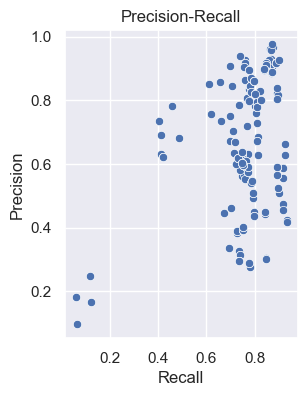

In [52]:
sns.scatterplot(x='Recall', y='Precision',data=df)
plt.title('Precision-Recall')
plt.show()

In [53]:
len(df)

480

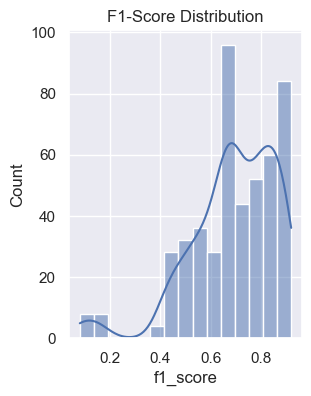

In [54]:
# Histogram grafiğini oluşturup KDE ekliyoruz:
sns.histplot(df['f1_score'], kde=True).set(title='F1-Score Distribution')

plt.show()

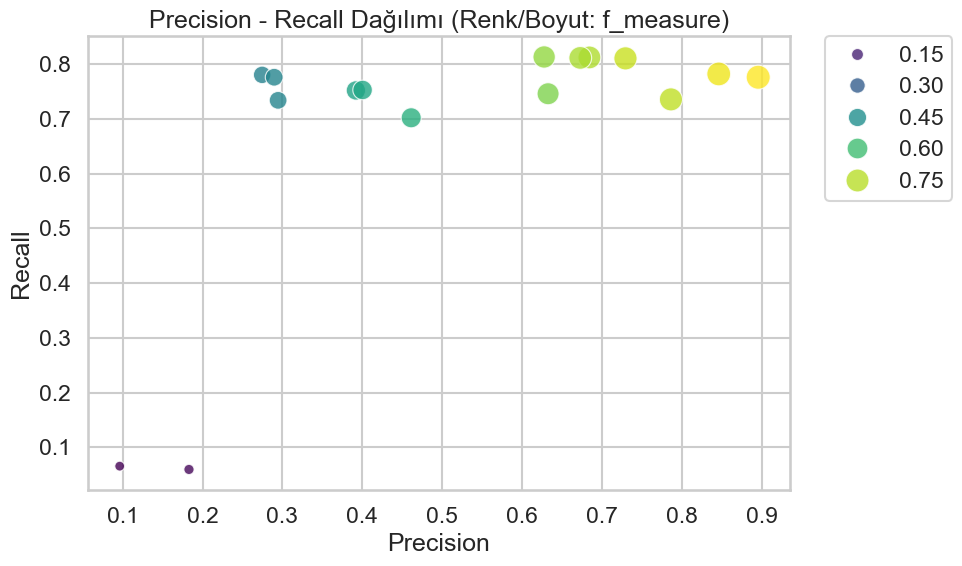

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

# Seaborn stilini ayarla
sns.set(style="whitegrid", context="talk")

# Varsayalım ki sonuçlarınız "results_finito" adlı DataFrame'de saklı.

# 1. Precision – Recall Scatter Plot (f_measure ile renk/boyut kodlaması)
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(
    data=df_selected,
    x="Precision",
    y="Recall",
    hue="f1_score",       # f_measure değerine göre renk
    size="f1_score",      # f_measure değerine göre nokta boyutu
    palette="viridis",
    sizes=(50, 300),
    alpha=0.8
)
plt.title("Precision - Recall Dağılımı (Renk/Boyut: f_measure)")
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.show()

In [56]:
fig = px.scatter(df, x="Recall", y="Precision", facet_col= 'Sample', symbol = 'VariantCaller',color="Mapper",hover_data=['Environment'],color_discrete_sequence=['#55a3cd', '#4954b0', '#282739', '#3b2127', '#9c2f45', '#e96f36'])
fig.update_traces(marker = dict(size=12))
fig.show()

### 3- Scatter Plot of Precision vs. Recall, Grouped by Centers, and Differentiated by Mapper, Variant Caller, baseRecalibration and isTrimmed


In [57]:
temp = df.copy()
temp['baseRecalibration, isTrimmed'] = temp['baseRecalibration'] + ', ' + temp['isTrimmed']
temp['Mapper, VariantCaller'] = temp['Mapper'] + ', ' + temp['VariantCaller']


In [58]:
fig = px.scatter(
    temp,
    x="TestCase",
    y="Recall",
    color = "Mapper, VariantCaller",
    symbol = "baseRecalibration, isTrimmed",
    facet_col= 'Sample',
    hover_data=['Mapper',"VariantCaller","baseRecalibration","isTrimmed","Duplicates"],
    color_discrete_sequence=['#55a3cd', '#4954b0', '#282739', '#e96f36', '#9c2f45', '#F2E34C'],
).update_layout(
    title={
        'y':0.95,
        'x':0.4,
        'xanchor': 'center',
        'yanchor': 'top'},
    showlegend=True,
    title_text="Recall values for each Pipeline",
    font=dict(
        size=10
    )
)
fig.update_traces(marker = dict(size=6))
fig.update_xaxes(title='Recall', visible=False, showticklabels=False)

fig.show()

  Sample      mean       max       min
0     ea  0.739008  0.897905  0.498176
1     fd  0.582887  0.831564  0.077949
2     il  0.767860  0.921818  0.567988
3     ll  0.616826  0.836089  0.140508
4     nc  0.750047  0.880824  0.502053

Average f1_score: 0.6913254035898414
Max f1_score: 0.9218181818181818
Min f1_score: 0.07794871794871795


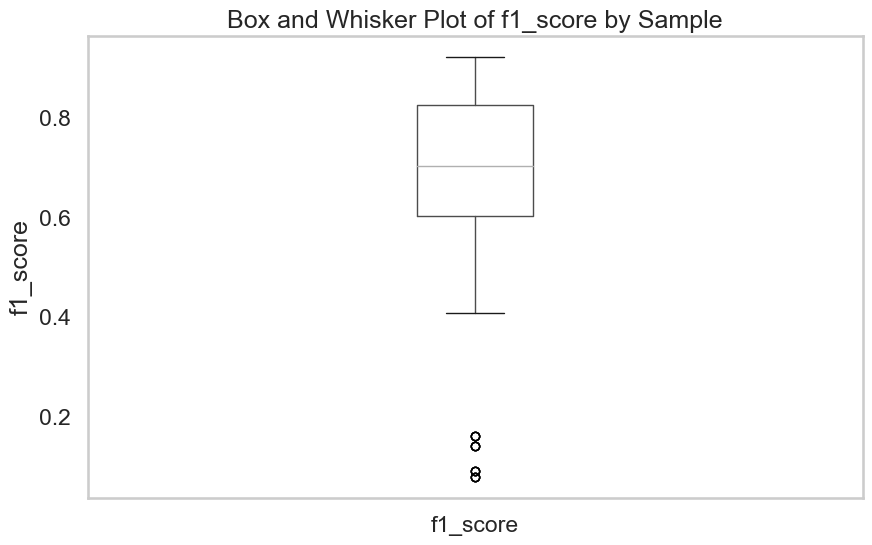

In [59]:
resultt = df.groupby('Sample')['f1_score'].agg(['mean', 'max', 'min']).reset_index()
print(resultt)

# Calculate average, max, and min of f1_score
average_f1 = df['f1_score'].mean()
max_f1 = df['f1_score'].max()
min_f1 = df['f1_score'].min()

print()

# Print the results
print(f'Average f1_score: {average_f1}')
print(f'Max f1_score: {max_f1}')
print(f'Min f1_score: {min_f1}')

plt.figure(figsize=(10, 6))
df.boxplot(column='f1_score', grid=False)

# Set plot title and labels
plt.title('Box and Whisker Plot of f1_score by Sample')
plt.suptitle('')  # Suppress the default title to avoid redundancy
plt.ylabel('f1_score')

# Show the plot
plt.show()

### 4- Calculating t-test for "Mapper", "Variant Caller", "baseRecalibration", and "isTrimmed" parameters based on their Recall values.

In [60]:
static = 'Precision'##'Recall'

# Filter rows 
filtered_df_ma = df[df['Mapper'].isin(['BWA', 'BOWTIE']) & ~df[static].isnull()]
filtered_df_br = df[df['baseRecalibration'].isin(['YES', 'NO']) & ~df[static].isnull()]
filtered_df_it = df[df['isTrimmed'].isin(['YES', 'NO']) & ~df[static].isnull()]


# Separate data for YES and NO filtered_df_br  :: Mapper
yes_data_ma = filtered_df_ma[filtered_df_ma['Mapper'] == 'BWA'][static]
no_data_ma = filtered_df_ma[filtered_df_ma['Mapper'] == 'BOWTIE'][static]

# Separate data for YES and NO filtered_df_br  :: VariantCaller
mutect_scores = df[df['VariantCaller'] == 'Mutect'][static]
somaticsniper_scores = df[df['VariantCaller'] == 'SomaticSniper'][static]
strelka_scores = df[df['VariantCaller'] == 'Strelka'][static]

# Separate data for YES and NO filtered_df_br  :: baseRecalibration
yes_data_br = filtered_df_br[filtered_df_br['baseRecalibration'] == 'YES'][static]
no_data_br = filtered_df_br[filtered_df_br['baseRecalibration'] == 'NO'][static]

# Separate data for YES and NO filtered_df_it :: isTrimmed
yes_data_it = filtered_df_it[filtered_df_it['isTrimmed'] == 'YES'][static]
no_data_it = filtered_df_it[filtered_df_it['isTrimmed'] == 'NO'][static]

# Perform paired difference test
t_stat_ma, p_value_ttest_ma = ttest_rel(yes_data_ma, no_data_ma)
t_stat_br, p_value_ttest_br = ttest_rel(yes_data_br, no_data_br)
t_stat_it, p_value_ttest_it = ttest_rel(yes_data_it, no_data_it)

##Variant Caller
t_stat, p_value = stats.f_oneway(mutect_scores, somaticsniper_scores, strelka_scores)


t_statistic_ms, p_value_ms = ttest_rel(mutect_scores, somaticsniper_scores)
t_statistic_mst, p_value_mst = ttest_rel(mutect_scores, strelka_scores)
t_statistic_st, p_value_st = ttest_rel(somaticsniper_scores, strelka_scores)



print(f"Mapper                    :: T-Test: t-statistic = {t_stat_br}, p-value = {p_value_ttest_br}\n")

print(f"Mutect vs. SomaticSniper  :: T-Test: t-statistic = {t_statistic_ms}, p-value:{p_value_ms}")
print(f"Mutect vs. Strelka        :: T-Test: t-statistic = {t_statistic_mst}, p-value:{p_value_mst}")
print(f"SomaticSniper vs. Strelka :: T-Test: t-statistic = {t_statistic_st}, p-value:{p_value_st}\n")

print(f"variantCaller stats.f_oneway  :: T-Test: t-statistic = {t_stat}, p-value = {p_value}\n")

print(f"baseRecalibration         :: T-Test: t-statistic = {t_stat_br}, p-value = {p_value_ttest_br}")
print(f"isTrimmed                 :: T-Test: t-statistic = {t_stat_it}, p-value = {p_value_ttest_it}")


Mapper                    :: T-Test: t-statistic = 13.601268942686488, p-value = 1.3774947912040284e-31

Mutect vs. SomaticSniper  :: T-Test: t-statistic = 33.94847803013978, p-value:9.47905451982143e-75
Mutect vs. Strelka        :: T-Test: t-statistic = 20.24365637293486, p-value:7.280379292737826e-46
SomaticSniper vs. Strelka :: T-Test: t-statistic = -8.664263305993952, p-value:4.899188113862716e-15

variantCaller stats.f_oneway  :: T-Test: t-statistic = 249.59331425230613, p-value = 6.653460684509058e-75

baseRecalibration         :: T-Test: t-statistic = 13.601268942686488, p-value = 1.3774947912040284e-31
isTrimmed                 :: T-Test: t-statistic = 0.7642248799759584, p-value = 0.4454870793555735


/var/folders/6c/3dspr2gs2qs15z3zrh8qxfjc0000gn/T/ipykernel_2591/478156256.py:17: UserWarning:

The palette list has more values (10) than needed (7), which may not be intended.

/var/folders/6c/3dspr2gs2qs15z3zrh8qxfjc0000gn/T/ipykernel_2591/2201637126.py:134: DeprecationWarning:

elementwise comparison failed; this will raise an error in the future.



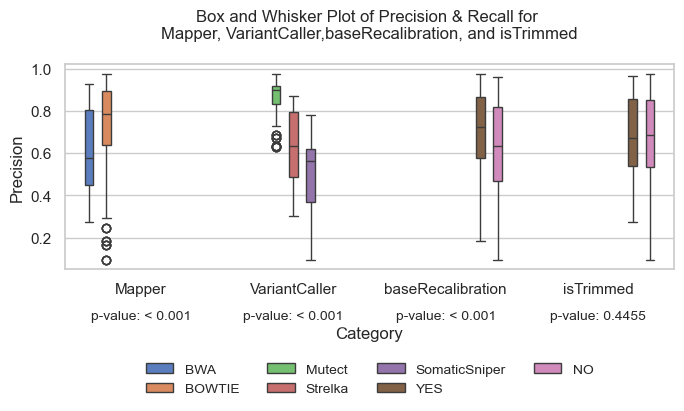

In [61]:
plt.rcdefaults()

# Assuming your DataFrame is named df
# If not, replace df with your actual DataFrame name

# Melt the DataFrame to long format
df_melted = pd.melt(temp, id_vars=[static], value_vars=['Mapper', 'VariantCaller', 'baseRecalibration', 'isTrimmed'])

# Set a more visually pleasing color palette
colors = sns.color_palette("muted")

# Set the style
sns.set(style="whitegrid")

# Create the box and whisker plot using sns
fig = plt.figure(figsize=(7, 5))
bp = sns.boxplot(x='variable', y=static, hue='value', data=df_melted, palette=colors)
adjust_box_widths(fig, 0.5)

# Set y-axis limits to start from 0.4
#plt.ylim(0.4, None)

# Set plot labels and title with adjusted font sizes
plt.xlabel('Category', fontsize='medium',labelpad=22)
plt.ylabel(f'{static}', fontsize='medium')
plt.title(f"Box and Whisker Plot of {static} & Recall for \nMapper, VariantCaller,baseRecalibration, and isTrimmed\n", fontsize='medium')

# Place legend to the right in 2-3-2 format
legend = plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), ncol=4, fontsize='small', frameon=False)

# Set legend title font size
legend.get_title().set_fontsize('large')

# Add p-values to the plot
#plt.text(2, 0.45, f"p-value: {p_value_ttest_br:.4f}", ha='center', va='center', backgroundcolor='white', fontsize='small')
#plt.text(3, 0.45, f"p-value: {p_value_ttest_it:.4f}", ha='center', va='center', backgroundcolor='white', fontsize='small')

p_values = [p_value_ttest_ma,p_value,p_value_ttest_br, p_value_ttest_it]  # Replace with your actual p-values
for i, label in enumerate(bp.get_xticklabels()):
    p_value_text = f"p-value: {p_values[i]:.4f}"
    if p_values[i] < 0.001:
        p_value_text = "p-value: < 0.001"

    plt.text(i, -0.17, p_value_text, ha='center', va='center', backgroundcolor='white', fontsize='small')
# Adjust overall layout
plt.tight_layout()

plt.savefig(f"box_and_whisker_{static}.pdf", format="pdf", bbox_inches="tight")

# Show the plot
plt.show()


## Step 9- ANOVA calculation for SNPs

### 1- Creating model dataframe

In [62]:
df_anova = df.copy()
result = []

for index, row in tqdm(df.iterrows()):
    result.append(row['TestCase'].split('/')[5])

df_anova['TestCase'] = result
df_anova = df_anova.drop(['Inter/Union','Precision','Recall'],axis = 1)
df_anova = df_anova.rename(columns={'Sample': 'Center'})

df_anova.head()

480it [00:00, 45814.35it/s]


,TestCase,f1_score,Environment,isTrimmed,baseRecalibration,Duplicates,Mapper,VariantCaller,Center
0,2,0.855491,altay,YES,YES,MARK,BWA,Mutect,ea
1,8,0.854329,altay,NO,NO,MARK,BWA,Mutect,ea
2,14,0.845966,altay,YES,NO,MARK,BWA,Mutect,ea
3,20,0.865721,altay,NO,YES,MARK,BWA,Mutect,ea
4,26,0.897905,altay,YES,YES,MARK,BOWTIE,Mutect,ea


In [63]:
model = ols('f1_score ~ C(isTrimmed) + C(baseRecalibration) + C(Duplicates) + C(Mapper) + C(VariantCaller) + C(Center) + C(Environment) + C(isTrimmed ):C( baseRecalibration) + C(isTrimmed ):C( Duplicates) + C(isTrimmed ):C( Mapper) + C(isTrimmed ):C( VariantCaller) + C(isTrimmed ):C( Center) + C(isTrimmed ):C( Environment) +C(baseRecalibration ):C( Duplicates) + C(baseRecalibration ):C( Mapper) + C(baseRecalibration ):C( VariantCaller) + C(baseRecalibration ):C( Center) + C(baseRecalibration ):C( Environment) + C(Duplicates ):C( Mapper) + C(Duplicates ):C( VariantCaller) + C(Duplicates ):C( Center) + C(Duplicates ):C( Environment) + C(Mapper ):C( VariantCaller) + C(Mapper ):C( Center) + C(Mapper ):C( Environment) + C(VariantCaller ):C( Center) + C(VariantCaller ):C( Environment) + C(Center ):C( Environment) + C(isTrimmed ):C( baseRecalibration ):C( Duplicates) + C(isTrimmed ):C( baseRecalibration ):C( Mapper) + C(isTrimmed ):C( baseRecalibration ):C( VariantCaller) + C(isTrimmed ):C( baseRecalibration ):C( Center) + C(isTrimmed ):C( baseRecalibration ):C( Environment) + C(isTrimmed ):C( Duplicates ):C( Mapper) + C(isTrimmed ):C( Duplicates ):C( VariantCaller) + C(isTrimmed ):C( Duplicates ):C( Center) + C(isTrimmed ):C( Duplicates ):C( Environment) + C(isTrimmed ):C( Mapper ):C( VariantCaller) + C(isTrimmed ):C( Mapper ):C( Center) + C(isTrimmed ):C( Mapper ):C( Environment) + C(isTrimmed ):C( VariantCaller ):C( Center) + C(isTrimmed ):C( VariantCaller ):C( Environment) + C(isTrimmed ):C( Center ):C( Environment) + C(baseRecalibration ):C( Duplicates ):C( Mapper) + C(baseRecalibration ):C( Duplicates ):C( VariantCaller) + C(baseRecalibration ):C( Duplicates ):C( Center) + C(baseRecalibration ):C( Duplicates ):C( Environment) + C(baseRecalibration ):C( Mapper ):C( VariantCaller) + C(baseRecalibration ):C( Mapper ):C( Center) + C(baseRecalibration ):C( Mapper ):C( Environment) + C(baseRecalibration ):C( VariantCaller ):C( Center) + C(baseRecalibration ):C( VariantCaller ):C( Environment) + C(baseRecalibration ):C( Center ):C( Environment) + C(Duplicates ):C( Mapper ):C( VariantCaller) + C(Duplicates ):C( Mapper ):C( Center) + C(Duplicates ):C( Mapper ):C( Environment) + C(Duplicates ):C( VariantCaller ):C( Center) + C(Duplicates ):C( VariantCaller ):C( Environment) +C(Duplicates ):C( Center ):C( Environment) +  C(Mapper ):C( VariantCaller ):C( Center) + C(Mapper ):C( VariantCaller ):C( Environment) + C(Mapper ):C( Center ):C( Environment) + C(VariantCaller):C(Center):C(Environment) +C(isTrimmed):C(baseRecalibration):C(Duplicates):C(Mapper) +C(isTrimmed):C(baseRecalibration):C(Duplicates):C(VariantCaller) +C(isTrimmed):C(baseRecalibration):C(Duplicates):C(Center) +C(isTrimmed):C(baseRecalibration):C(Duplicates):C(Environment) +C(isTrimmed):C(baseRecalibration):C(Mapper):C(VariantCaller) +C(isTrimmed):C(baseRecalibration):C(Mapper):C(Center) +C(isTrimmed):C(baseRecalibration):C(Mapper):C(Environment) +C(isTrimmed):C(baseRecalibration):C(VariantCaller):C(Center) +C(isTrimmed):C(baseRecalibration):C(VariantCaller):C(Environment) +C(isTrimmed):C(baseRecalibration):C(Center):C(Environment) +C(isTrimmed):C(Duplicates):C(Mapper):C(VariantCaller) +C(isTrimmed):C(Duplicates):C(Mapper):C(Center) +C(isTrimmed):C(Duplicates):C(Mapper):C(Environment) +C(isTrimmed):C(Duplicates):C(VariantCaller):C(Center) +C(isTrimmed):C(Duplicates):C(VariantCaller):C(Environment) +C(isTrimmed):C(Duplicates):C(Center):C(Environment) +C(isTrimmed):C(Mapper):C(VariantCaller):C(Center) +C(isTrimmed):C(Mapper):C(VariantCaller):C(Environment) +C(isTrimmed):C(Mapper):C(Center):C(Environment) +C(isTrimmed):C(VariantCaller):C(Center):C(Environment) +C(baseRecalibration):C(Duplicates):C(Mapper):C(VariantCaller) +C(baseRecalibration):C(Duplicates):C(Mapper):C(Center) +C(baseRecalibration):C(Duplicates):C(Mapper):C(Environment) +C(baseRecalibration):C(Duplicates):C(VariantCaller):C(Center) +C(baseRecalibration):C(Duplicates):C(VariantCaller):C(Environment) +C(baseRecalibration):C(Duplicates):C(Center):C(Environment) +C(baseRecalibration):C(Mapper):C(VariantCaller):C(Center) +C(baseRecalibration):C(Mapper):C(VariantCaller):C(Environment) +C(baseRecalibration):C(Mapper):C(Center):C(Environment) +C(baseRecalibration):C(VariantCaller):C(Center):C(Environment) +C(Duplicates):C(Mapper):C(VariantCaller):C(Center) +C(Duplicates):C(Mapper):C(VariantCaller):C(Environment) +C(Duplicates):C(Mapper):C(Center):C(Environment) +C(Duplicates):C(VariantCaller):C(Center):C(Environment) +C(Mapper):C(VariantCaller):C(Center):C(Environment) +C(isTrimmed):C(baseRecalibration):C(Duplicates):C(Mapper):C(VariantCaller)+C(isTrimmed):C(baseRecalibration):C(Duplicates):C(Mapper):C(Center)+C(isTrimmed):C(baseRecalibration):C(Duplicates):C(Mapper):C(Environment)+C(isTrimmed):C(baseRecalibration):C(Duplicates):C(VariantCaller):C(Center)+C(isTrimmed):C(baseRecalibration):C(Duplicates):C(VariantCaller):C(Environment)+C(isTrimmed):C(baseRecalibration):C(Duplicates):C(Center):C(Environment)+C(isTrimmed):C(baseRecalibration):C(Mapper):C(VariantCaller):C(Center)+C(isTrimmed):C(baseRecalibration):C(Mapper):C(VariantCaller):C(Environment)+C(isTrimmed):C(baseRecalibration):C(Mapper):C(Center):C(Environment)+C(isTrimmed):C(baseRecalibration):C(VariantCaller):C(Center):C(Environment)+C(isTrimmed):C(Duplicates):C(Mapper):C(VariantCaller):C(Center)+C(isTrimmed):C(Duplicates):C(Mapper):C(VariantCaller):C(Environment)+C(isTrimmed):C(Duplicates):C(Mapper):C(Center):C(Environment)+C(isTrimmed):C(Duplicates):C(VariantCaller):C(Center):C(Environment)+C(isTrimmed):C(Mapper):C(VariantCaller):C(Center):C(Environment)+C(baseRecalibration):C(Duplicates):C(Mapper):C(VariantCaller):C(Center)+C(baseRecalibration):C(Duplicates):C(Mapper):C(VariantCaller):C(Environment)+C(baseRecalibration):C(Duplicates):C(Mapper):C(Center):C(Environment)+C(baseRecalibration):C(Duplicates):C(VariantCaller):C(Center):C(Environment)+C(baseRecalibration):C(Mapper):C(VariantCaller):C(Center):C(Environment)+C(Duplicates):C(Mapper):C(VariantCaller):C(Center):C(Environment)+C(isTrimmed):C(baseRecalibration):C(Duplicates):C(Mapper):C(VariantCaller):C(Center)+C(isTrimmed):C(baseRecalibration):C(Duplicates):C(Mapper):C(VariantCaller):C(Environment)+C(isTrimmed):C(baseRecalibration):C(Duplicates):C(Mapper):C(Center):C(Environment)+C(isTrimmed):C(baseRecalibration):C(Duplicates):C(VariantCaller):C(Center):C(Environment)+C(isTrimmed):C(baseRecalibration):C(Mapper):C(VariantCaller):C(Center):C(Environment)+C(isTrimmed):C(Duplicates):C(Mapper):C(VariantCaller):C(Center):C(Environment)+C(baseRecalibration):C(Duplicates):C(Mapper):C(VariantCaller):C(Center):C(Environment)+C(isTrimmed ):C( baseRecalibration ):C( Duplicates ):C( Mapper):C( VariantCaller):C( Center):C( Environment) ', data=df_anova).fit()
result = sm.stats.anova_lm(model, type=7) # type = kaç adet bağımsız değişkeniniz varsa.
# Print the result
#print(result.head())

/opt/miniconda3/envs/mywork2_rebuild_env/lib/python3.8/site-packages/statsmodels/stats/anova.py:142: RuntimeWarning:

divide by zero encountered in scalar divide



In [64]:
Index = []
Percentage = []
for index, row in result.iterrows():
    percentage = ((row['sum_sq'] / sum(result['sum_sq'])) * 100)
    Index.append(index)
    Percentage.append(percentage)
    
source_of_var = pd.DataFrame()
source_of_var["Source"] = Index
source_of_var["Result"] = Percentage

source_of_var = source_of_var.sort_values(by='Result', ascending=False)
source_of_var = source_of_var.set_index(["Source"])
source_of_var = source_of_var.loc[source_of_var["Result"] > 1 ]

source_of_var

,Result
Source,
C(VariantCaller),53.944526
C(Center),19.391092
C(Mapper):C(VariantCaller),7.963952
C(VariantCaller):C(Center),3.578751
C(isTrimmed):C(Mapper):C(VariantCaller),2.634789
C(isTrimmed):C(VariantCaller),2.446385
C(isTrimmed):C(Mapper),1.797745
C(isTrimmed),1.590803
C(baseRecalibration),1.237931


### 2- Plotting ANOVA combinations of 7 independent variables that affect the result by more than 1%

/var/folders/6c/3dspr2gs2qs15z3zrh8qxfjc0000gn/T/ipykernel_2591/1831215158.py:21: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




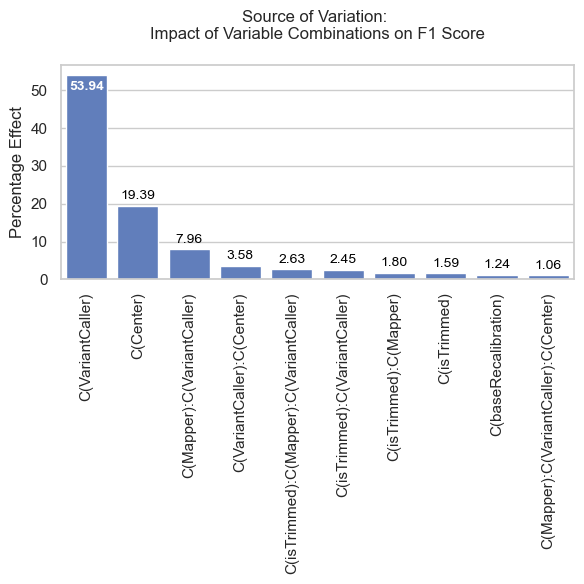

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import pandas as pd

# Assuming 'source_of_var' is already loaded and contains the necessary columns

# Define the base blue hex color and convert to RGB
base_blue_hex = "#5279CA"
base_color = mcolors.hex2color(base_blue_hex)

# Normalize the percentage results to scale between 0 and 1 for color intensity
norm = plt.Normalize(source_of_var["Result"].min(), source_of_var["Result"].max())

# Create a gradient palette where each bar's color depends on its value
colors = [mcolors.to_rgba(base_color, alpha=norm(value)) for value in source_of_var["Result"]]

# Create a bar plot using Seaborn
plt.figure(figsize=(6, 6))

ax = sns.barplot(
    x=source_of_var.index,
    y=source_of_var["Result"],
    palette=colors  # Apply the dynamic colors based on percentage
)

# Add data labels to each bar
for p in ax.patches:
    value = p.get_height()  # Get the height of the bar (the value it represents)
    if value > 20:
        ax.text(
            p.get_x() + p.get_width() / 2,  # X position (centered on the bar)
            value - 3,  # Y position (slightly inside the top of the bar)
            f'{value:.2f}',  # The label (formatted to 1 decimal place)
            ha="center", va="center", fontsize=10, color="white", fontweight="bold"
        )
    else:
        ax.text(
            p.get_x() + p.get_width() / 2,  # X position (centered on the bar)
            value + 1,  # Y position (slightly above the bar)
            f'{value:.2f}',  # The label (formatted to 1 decimal place)
            ha="center", va="bottom", fontsize=10, color="black"
        )

# Set title and labels
plt.title('Source of Variation: \nImpact of Variable Combinations on F1 Score\n', fontsize='medium')
plt.ylabel('Percentage Effect', fontsize='medium')
plt.xlabel('')
plt.xticks(rotation=90)

# Adjust layout and save the figure
plt.tight_layout()
plt.savefig("sav.pdf", format="pdf", bbox_inches="tight")
plt.show()


Text(0.5, 0, '\nCombinations of 7 independent variables that affect the result by more than 1%')

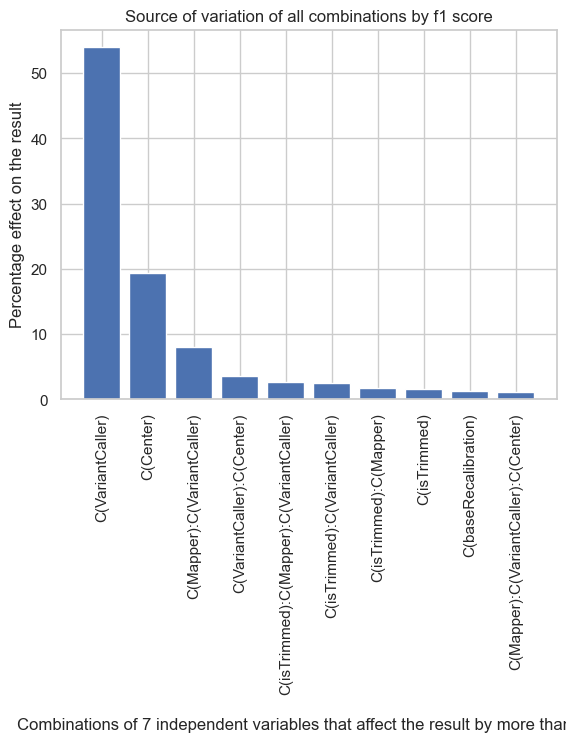

In [66]:
plt.xticks(rotation=90)
plt.bar(source_of_var.index, source_of_var["Result"])
plt.title('Source of variation of all combinations by f1 score')
plt.ylabel('Percentage effect on the result')
plt.xlabel('\nCombinations of 7 independent variables that affect the result by more than 1%')

##  Step 10- Cancer Gene Census (CGC)


In [67]:
# Replace 'file.csv' with the path to your CSV file
file_path = 'vcf/Census_allSat May  4 12_31_16 2024.csv'

# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)

# List of gene symbols for filtering
cancer_gene_symbols = ['CBL', 'CHEK2', 'GMPS', 'HLF', 'IDH1', 'ITGAV', 'LARP4B', 'MAF', 'MAP2K1', 'MITF', 'MSH2', 
                'NDRG1', 'NRAS', 'PALB2', 'PIK3CB', 'POT1', 'PPM1D', 'PTK6', 'PTPN11', 'SHTN1', 'SLC34A2', 
                'SMAD2', 'XPO1']

drug_gene_symbols = ['BRAF', 'ESR1', 'MAP2K1', 'MAP2K2', 'FLT3','KIT','MET','EGFR','PDGFRA','ALK']

drug_gene_data = {
    'Gene Symbol': ['BRAF', 'ESR1', 'MAP2K1', 'MAP2K2', 'FLT3','KIT','MET','EGFR','PDGFRA','ALK'],
    'Chr Number': [7, 6, 15, 19, 13, 4, 7, 7, 4 , 2 ],
    'Location Start': [140730665, 151690496, 66386817, 4090321, 28003274, 54657918, 116672405, 55019101, 54229097, 29192774],
    'Location End': [140924928, 152103274, 66492312, 4124129, 28100592, 54740715, 116796342, 55211628, 54298247, 29921566]
}

df_drug_gene_symbols = pd.DataFrame(drug_gene_data)

# Filter the DataFrame to include only rows with the specified gene symbols
filtered_df_cancer = df[df['Gene Symbol'].isin(cancer_gene_symbols)].copy()
filtered_df_drug = df_drug_gene_symbols[df_drug_gene_symbols['Gene Symbol'].isin(drug_gene_symbols)].copy()


# Split 'Genome Location' into chromosome number, start location, and end location
filtered_df_cancer[['Chr Number', 'Location Start', 'Location End']] = filtered_df_cancer['Genome Location'].str.split(':|-', expand=True)
# Convert 'Chr Number' format to 'chrX'
filtered_df_cancer['Chr Number'] = 'chr' + filtered_df_cancer['Chr Number']
filtered_df_drug['Chr Number'] = 'chr' + filtered_df_drug['Chr Number'].astype(str)


In [68]:
filtered_df_cancer

,Gene Symbol,Name,Entrez GeneId,Genome Location,Tier,Hallmark,Chr Band,Somatic,Germline,Tumour Types(Somatic),Tumour Types(Germline),Cancer Syndrome,Tissue Type,Molecular Genetics,Role in Cancer,Mutation Types,Translocation Partner,Other Germline Mut,Other Syndrome,Synonyms,Chr Number,Location Start,Location End
95,CBL,Cas-Br-M (murine) ecotropic retroviral transfo...,867.0,11:119206276-119308149,1,Yes,11q23.3,yes,NaN,"AML, JMML, MDS",NaN,NaN,L,Dom/Rec,"oncogene, TSG, fusion","T, Mis, S, O",KMT2A,NaN,NaN,"CBL2,CCDS8418.1,ENSG00000110395.6,NM_005188.3,...",chr11,119206276,119308149
131,CHEK2,CHK2 checkpoint homolog (S. pombe),11200.0,22:28687763-28741838,1,Yes,22q12.1,NaN,yes,NaN,breast,familial breast cancer,E,Rec,TSG,F,NaN,NaN,NaN,"CCDS33629.1,CDS1,CHK2,ENSG00000183765.20,HuCds...",chr22,28687763,28741838
281,GMPS,guanine monphosphate synthetase,8833.0,3:155870536-155944026,2,NaN,3q25.31,yes,NaN,AML,NaN,NaN,L,Dom,fusion,T,KMT2A,NaN,NaN,"CCDS46941.1,ENSG00000163655.15,GATD7,NM_003875...",chr3,155870536,155944026
304,HLF,hepatic leukemia factor,3131.0,17:55265012-55325065,1,NaN,17q22,yes,NaN,ALL,NaN,NaN,L,Dom,"oncogene, fusion",T,TCF3,NaN,NaN,"CCDS11585.1,ENSG00000108924.13,MGC33822,NM_002...",chr17,55265012,55325065
322,IDH1,"isocitrate dehydrogenase 1 (NADP+), soluble",3417.0,2:208236265-208254322,1,Yes,2q34,yes,NaN,glioblastoma,NaN,NaN,O,Dom,oncogene,Mis,NaN,NaN,NaN,"CCDS2381.1,ENSG00000138413.13,NM_001282387.1,N...",chr2,208236265,208254322
338,ITGAV,integrin subunit alpha V,3685.0,2:186590065-186680901,2,NaN,2q32.1,yes,NaN,large intestine carcinoma,NaN,NaN,E,NaN,NaN,F,NaN,NaN,NaN,"CCDS2292.1,CD51,ENSG00000138448.11,MSK8,NM_002...",chr2,186590065,186680901
368,LARP4B,La ribonucleoprotein domain family member 4B,23185.0,10:806914-931705,2,NaN,10p15.3,yes,NaN,"CRC, glioma",NaN,NaN,"E, O",NaN,TSG,"F, D",NaN,NaN,NaN,"CCDS31131.1,ENSG00000107929.14,KIAA0217,LARP5,...",chr10,806914,931705
389,MAF,v-maf musculoaponeurotic fibrosarcoma oncogene...,4094.0,16:79593838-79600714,1,NaN,16q23.2,yes,NaN,MM,NaN,NaN,L,Dom,"oncogene, fusion",T,IGH,NaN,NaN,"CCDS10928.1,ENSG00000178573.6,NM_005360.4,NP_0...",chr16,79593838,79600714
394,MAP2K1,mitogen-activated protein kinase kinase 1,5604.0,15:66386817-66492312,1,Yes,15q22.31,yes,NaN,"NSCLC, melanoma, colorectal",NaN,NaN,E,Dom,oncogene,Mis,NaN,yes,Cardiofaciocutaneous syndrome,"CCDS10216.1,ENSG00000169032.9,MAPKK1,MEK1,NM_0...",chr15,66386817,66492312
410,MITF,melanogenesis-associated transcription factor,4286.0,3:69739435-69968336,1,NaN,3p13,yes,NaN,melanoma,NaN,NaN,E,Dom,oncogene,A,NaN,yes,"Waardenburg syndrome type 2, Tietz syndrome","CCDS43106.1,ENSG00000187098.15,MI,NM_198159.2,...",chr3,69739435,69968336


In [69]:
import pandas as pd
from tqdm import tqdm

# Precompute positional lookups for cancer and drug genes
cancer_genes_dict = {}
drug_genes_dict = {}

for idx, row in filtered_df_cancer.iterrows():
    chrom = row['Chr Number']
    start = int(row['Location Start'])
    end = int(row['Location End'])
    gene_symbol = row['Gene Symbol']
    for pos in range(start, end + 1):
        if (chrom, pos) not in cancer_genes_dict:
            cancer_genes_dict[(chrom, pos)] = []
        cancer_genes_dict[(chrom, pos)].append(gene_symbol)

for idx, row in filtered_df_drug.iterrows():
    chrom = row['Chr Number']
    start = int(row['Location Start'])
    end = int(row['Location End'])
    gene_symbol = row['Gene Symbol']
    for pos in range(start, end + 1):
        if (chrom, pos) not in drug_genes_dict:
            drug_genes_dict[(chrom, pos)] = []
        drug_genes_dict[(chrom, pos)].append(gene_symbol)

# Initialize a dictionary to store counts and gene symbols for each key
results_dict_cancer_genes = {}
results_dict_drug_genes = {}

# Iterate over each key in sets_dict
for key, variants in tqdm(sets_dict.items()):
    # Initialize gene symbol counter for the current key
    cancer_gene_symbol_count = {}
    drug_gene_symbol_count = {}

    # Iterate over each variant in the set
    for variant in variants:
        # Extract chromosome number and position from the variant
        chrom, pos = variant.split("_")[:2]
        pos = int(pos)

        # Check if there's a matching variant in the precomputed dictionaries
        if (chrom, pos) in cancer_genes_dict:
            for gene_symbol in cancer_genes_dict[(chrom, pos)]:
                cancer_gene_symbol_count[gene_symbol] = cancer_gene_symbol_count.get(gene_symbol, 0) + 1

        if (chrom, pos) in drug_genes_dict:
            for gene_symbol in drug_genes_dict[(chrom, pos)]:
                drug_gene_symbol_count[gene_symbol] = drug_gene_symbol_count.get(gene_symbol, 0) + 1

    # Store the count and gene symbols found for the current key
    results_dict_cancer_genes[key] = cancer_gene_symbol_count
    results_dict_drug_genes[key] = drug_gene_symbol_count


100%|███████████████████████████████████████| 480/480 [00:00<00:00, 1304.03it/s]


In [70]:
results_dict_drug_genes

{'2': {'ALK': 1},
 '8': {'ALK': 1},
 '14': {'ALK': 1},
 '20': {'ALK': 1},
 '26': {'ALK': 1},
 '32': {'ALK': 1},
 '38': {'ALK': 1},
 '44': {'ALK': 1},
 '50': {'ALK': 1},
 '56': {'ALK': 1, 'EGFR': 1, 'MAP2K1': 1},
 '62': {'ALK': 1, 'EGFR': 1, 'MAP2K1': 1},
 '68': {'ALK': 1},
 '74': {},
 '80': {},
 '86': {},
 '92': {},
 '98': {'EGFR': 1},
 '104': {'EGFR': 1},
 '110': {'EGFR': 1},
 '116': {'EGFR': 1},
 '122': {'EGFR': 1},
 '128': {'EGFR': 1},
 '134': {'EGFR': 1},
 '140': {'EGFR': 1},
 '147': {},
 '148': {'ALK': 1},
 '149': {},
 '150': {'EGFR': 1},
 '153': {},
 '154': {'ALK': 1},
 '155': {},
 '156': {},
 '159': {},
 '160': {'ALK': 1},
 '161': {},
 '162': {'EGFR': 1},
 '165': {},
 '166': {'ALK': 1},
 '167': {},
 '168': {'EGFR': 1},
 '171': {},
 '172': {'ALK': 1},
 '173': {},
 '174': {},
 '177': {},
 '178': {'ALK': 1},
 '179': {},
 '180': {'EGFR': 1},
 '183': {},
 '184': {'ALK': 1},
 '185': {},
 '186': {'EGFR': 1},
 '189': {},
 '190': {'ALK': 1},
 '191': {},
 '192': {'EGFR': 1},
 '195': {'PDG

In [71]:
results_dict_cancer_genes
#results_dict_drug_genes

# Combine columns into a single key
#vcfcomparison_df_full['Combined_Column'] = vcfcomparison_df_full['Mapper'] + '_' + vcfcomparison_df_full['VariantCaller'] + '_' + vcfcomparison_df_full['isTrimmed'] + '_' + vcfcomparison_df_full['baseRecalibration']
#vcfcomparison_df_full

{'2': {'SLC34A2': 2},
 '8': {'SLC34A2': 2},
 '14': {'SLC34A2': 2},
 '20': {'SLC34A2': 2},
 '26': {'SLC34A2': 2},
 '32': {'SLC34A2': 2, 'PIK3CB': 1},
 '38': {'SLC34A2': 2},
 '44': {'SLC34A2': 2},
 '50': {'PIK3CB': 1, 'MITF': 1, 'SLC34A2': 2, 'HLF': 1},
 '56': {'PIK3CB': 1, 'MITF': 1, 'SLC34A2': 2, 'MAP2K1': 1},
 '62': {'PIK3CB': 1, 'MITF': 1, 'SLC34A2': 2, 'HLF': 1, 'MAP2K1': 1},
 '68': {'MITF': 1, 'SLC34A2': 2},
 '74': {'SLC34A2': 2},
 '80': {'SLC34A2': 2},
 '86': {'SLC34A2': 2},
 '92': {'SLC34A2': 2},
 '98': {'SLC34A2': 2},
 '104': {'SLC34A2': 2},
 '110': {'SLC34A2': 2},
 '116': {'SLC34A2': 2},
 '122': {'SLC34A2': 2},
 '128': {'SLC34A2': 1},
 '134': {'SLC34A2': 2},
 '140': {'SLC34A2': 1},
 '147': {'SLC34A2': 2},
 '148': {'SLC34A2': 2},
 '149': {'SLC34A2': 2},
 '150': {'SLC34A2': 2, 'PTK6': 1},
 '153': {'SLC34A2': 2},
 '154': {'SLC34A2': 2},
 '155': {'SLC34A2': 2},
 '156': {'SLC34A2': 2, 'PTK6': 1},
 '159': {'SLC34A2': 2},
 '160': {'SLC34A2': 2},
 '161': {'SLC34A2': 2},
 '162': {'SLC34

### Cancer Genes

In [72]:
# Create an empty dictionary to store normalized counts for each key
cancer_genes_new_dict = {}

vcfcomparison_df_full['Combined_Column'] = vcfcomparison_df_full['Mapper'] + '_' + vcfcomparison_df_full['VariantCaller'] + '_' + vcfcomparison_df_full['isTrimmed'] + '_' + vcfcomparison_df_full['baseRecalibration']

# Iterate over each key in results_dict
for key, gene_counts in tqdm(results_dict_cancer_genes.items()):
    # Create a temporary copy of the DataFrame
    vcfcomparison_df_temp = vcfcomparison_df_full.copy()

    # Split the 'TestCaseNo' by space and extract the key (which is the second element in the split result)
    vcfcomparison_df_temp['TestCaseKey'] = vcfcomparison_df_temp['TestCaseNo'].str.split(' ').str[1]

    # Now you can filter the samples based on the key using the temporary DataFrame
    filtered_samples = vcfcomparison_df_temp[vcfcomparison_df_temp['TestCaseKey'] == key]
    # Filter vcfcomparison_df_full for samples where the key exists
    #filtered_samples = vcfcomparison_df_full[vcfcomparison_df_full['TestCaseNo'] == key]
    
    # Create a list to store the combined column values
    combined_columns = filtered_samples['Combined_Column'].unique()
    
    # Create a DataFrame to store counts for each gene symbol and combined column
    df = pd.DataFrame(gene_counts.items(), columns=['Gene Symbol', 'Count'])
    
    # Iterate over each combined column
    for combined_column in combined_columns:
        # Filter the DataFrame for the current combined column
        combined_df = df.copy()
        
        # Set count to 0 for gene symbols not present in the filtered DataFrame
        for symbol in cancer_gene_symbols:
            if symbol not in combined_df['Gene Symbol'].values:
                combined_df = combined_df.append({'Gene Symbol': symbol, 'Count': 0}, ignore_index=True)
        
        # Update new_dict with normalized counts for the current key and combined column
        cancer_genes_new_dict[(key, combined_column)] = combined_df.set_index('Gene Symbol')['Count'].to_dict()

# Now new_dict contains the counts for each gene symbol, ensuring that all symbols in gene_symbols list are included with a count of 0 if not already present.


  0%|                                                   | 0/480 [00:00<?, ?it/s]


AttributeError: 'DataFrame' object has no attribute 'append'

In [ ]:
cancer_genes_new_dict

In [ ]:
import os
os.system("printf '\a'") # or '\7'

In [ ]:

# Create an empty list to store data
data = []

# Iterate over each row in vcfcomparison_df_full
for index, row in vcfcomparison_df_full.iterrows():
    # Get the key (TestCaseNo)
    key = row['TestCaseNo'].split(' ')[1]
    
    # Check if the key exists in results_dict
    if key in results_dict_cancer_genes:
        # Get the gene symbol counts for the current key
        gene_counts = results_dict_cancer_genes[key]
        
        # Extract the combined column value
        combined_column_value = row['Combined_Column']
        
       
        for gene_symbol, count in gene_counts.items():
        # Append data to the list
            data.append({'Key': key,
                        'Gene Symbol': gene_symbol,
                        'Count': count,
                        'Combined_Column': combined_column_value,
                        'Sample': row['Sample']})

# Create DataFrame from the collected data
new_df_cancer_genes = pd.DataFrame(data)

# Display the new DataFrame
print(new_df_cancer_genes)

In [ ]:
# Extract unique values for each component
mappers = vcfcomparison_df_full['Mapper'].unique()
variant_callers = vcfcomparison_df_full['VariantCaller'].unique()
is_trimmed = vcfcomparison_df_full['isTrimmed'].unique()
base_recalibration = vcfcomparison_df_full['baseRecalibration'].unique()

# Generate all possible combinations of Combined_Column
all_combinations = ['_'.join(comb) for comb in itertools.product(mappers, variant_callers, is_trimmed, base_recalibration)]

sample_names = new_df_cancer_genes['Sample'].unique()

# Generate new DataFrame to store added rows
added_rows = []

# Iterate over each unique sample in new_df_cancer_genes
for sample in sample_names:
    # Get existing Combined_Columns for the current sample
    existing_columns = new_df_cancer_genes[new_df_cancer_genes['Sample'] == sample]['Combined_Column'].unique()
    
    # Find missing Combined_Columns for the current sample
    missing_columns = set(all_combinations) - set(existing_columns)
    
    # Add missing Combined_Columns with zero counts for the current sample
    for column in missing_columns:
        for gene_symbol in cancer_gene_symbols:  # Assuming gene_symbols is defined elsewhere
            added_rows.append({'Sample': sample, 'Combined_Column': column, 'Gene Symbol': gene_symbol, 'Count': 0})

# Add the added rows to new_df_cancer_genes
new_df_cancer_genes = new_df_cancer_genes.append(added_rows, ignore_index=True)

# Sort the DataFrame by Sample and Combined_Column
new_df_cancer_genes.sort_values(by=['Sample', 'Combined_Column'], inplace=True)

# Display the DataFrame
print(new_df_cancer_genes)






In [ ]:
# Iterate over each unique sample in new_df
for sample in new_df_cancer_genes['Sample'].unique():
    # Filter data for the current sample
    sample_data = new_df_cancer_genes[new_df_cancer_genes['Sample'] == sample]
    
    # Create an empty dictionary to store combined counts for each combined_column
    combined_counts = {}
    
    # Group by 'Combined_Column', 'Gene Symbol', and 'Sample' and sum the counts
    grouped_data = sample_data.groupby(['Combined_Column', 'Gene Symbol']).sum().reset_index()
    
    # Iterate over each row in grouped_data
    for index, row in grouped_data.iterrows():
        # Get combined_column and gene symbol
        combined_column = row['Combined_Column']
        gene_symbol = row['Gene Symbol']
        
        # Get count
        count = row['Count']
        
        # Update combined_counts dictionary
        if combined_column not in combined_counts:
            combined_counts[combined_column] = {}
        if gene_symbol not in combined_counts[combined_column]:
            combined_counts[combined_column][gene_symbol] = 0
        combined_counts[combined_column][gene_symbol] += count
    
    # Convert combined_counts dictionary to a DataFrame
    combined_counts_df = pd.DataFrame(combined_counts)
    
    # Fill NaN values with 0
    combined_counts_df.fillna(0, inplace=True)
    
    # Add missing gene symbols with count 0
    for key in results_dict_cancer_genes.keys():
        missing_symbols = set(cancer_gene_symbols) - set(combined_counts_df.index)
        for symbol in missing_symbols:
            combined_counts_df.loc[symbol] = 0
    
    # Sort index alphabetically
    combined_counts_df = combined_counts_df.reindex(sorted(combined_counts_df.index))
    
    # Normalize the heatmap values between 0 and 1
    #normalized_heatmap_data = combined_counts_df / combined_counts_df.max().max()
    
    # Define custom color map and normalization
    cmap = plt.cm.get_cmap('YlGnBu')
    #norm = mcolors.Normalize(vmin=0, vmax=1)
    
    # Plot the heatmap
    plt.figure(figsize=(25, 6))
    sns.heatmap(combined_counts_df, annot=True, cmap=cmap,  xticklabels=True)
    plt.title(f'Combined Cancer Gene Symbol Counts for Sample: {sample}')
    plt.xlabel('Combined Column')
    plt.ylabel('Gene Symbol')
    plt.xticks(rotation=-90)  # Rotate x-axis labels to -90 degrees
    plt.savefig(f'Combined_Cancer_GeneSymbol_Counts_{sample}.pdf', format="pdf", bbox_inches="tight")

    plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, leaves_list
from matplotlib.patches import Patch

# Assuming the necessary data is already loaded and processed

# Group by 'Combined_Column', 'Gene Symbol', and 'Sample' and sum the counts
grouped_data = new_df_cancer_genes.groupby(['Combined_Column', 'Gene Symbol', 'Sample']).sum().reset_index()

# Create a combined label for the x-axis
grouped_data['Combined_Label'] = grouped_data['Combined_Column'] + ' | ' + grouped_data['Sample'].astype(str)

# Pivot the data to have 'Combined_Label' as rows and 'Gene Symbol' as columns (transpose the data)
pivot_df = grouped_data.pivot(index='Combined_Label', columns='Gene Symbol', values='Count')

# Fill NaN values with 0 or any placeholder value
pivot_df.fillna(0, inplace=True)

# Assign colors to different centers using a color palette
sample = grouped_data['Sample'].astype(str)  # Ensure all values are strings
lut = dict(zip(set(sample), sns.color_palette("muted")))  # Use a color palette
row_colors = pd.Series(pivot_df.index, index=pivot_df.index).map(lambda x: lut[x.split(" | ")[1]])

# Perform hierarchical clustering on the rows based on center labels
center_order = pd.Series(row_colors.index).map(lambda x: x.split(' | ')[1])
center_linkage = linkage(center_order.factorize()[0].reshape(-1, 1), method='average', metric='euclidean')
center_ordered = leaves_list(center_linkage)

# Reorder the DataFrame and row colors according to the clustering based on centers
pivot_df = pivot_df.iloc[center_ordered, :]
row_colors = row_colors.iloc[center_ordered]

# Create a custom colormap for the heatmap
cmap = plt.cm.get_cmap('YlGnBu')

# Plot the heatmap with the dendrogram on top
sns.set(font_scale=1)
g = sns.clustermap(
    pivot_df, 
    col_cluster=False,  # Disable column clustering
    row_cluster=False,  # Disable row clustering
    row_linkage=center_linkage,  # Cluster by center labels
    annot=True,
    cmap=cmap,  # Apply custom colormap
    row_colors=row_colors.values,  # Apply colors to the rows
    xticklabels=True,  # Enable x-axis labels with Gene Symbol (since data is rotated)
    yticklabels=True,  # Enable y-axis labels with Combined_Column and Sample
    linewidths=0.1,
    figsize=(10, 30),  # Adjust figsize for the rotated layout
    cbar_kws={"orientation": "horizontal"}  # Horizontal colorbar
)

# Adjust the position of the dendrogram and the color bar
dendro_box = g.ax_row_dendrogram.get_position()
heatmap_box = g.ax_heatmap.get_position()

# Move the dendrogram to the top
g.ax_row_dendrogram.set_position([heatmap_box.x0, heatmap_box.y1 + 0.05, heatmap_box.width, 0.15])
g.ax_heatmap.set_position([heatmap_box.x0, heatmap_box.y0, heatmap_box.width, heatmap_box.height])

# Adjust the color bar position
g.cax.set_position([heatmap_box.x0 + 0.01, heatmap_box.y0 + 0.78, heatmap_box.width - 0.02, 0.01])
g.ax_heatmap.set_xlabel("\nCancer Gene Symbols and Their Associated Counts Across Different Test Cases", fontsize=12)

# Customize y-axis labels (rotate for better visibility)
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

# Add legend for center colors with a horizontal layout
handles = [Patch(facecolor=lut[name], label=name) for name in lut]
plt.legend(
    handles=handles, 
    title='Centers', 
    bbox_to_anchor=(0.0, 3.0),  # Position the legend above the heatmap
    loc='upper left', 
    ncol=len(lut),  # Make the legend horizontal
    frameon=False,  # Remove the frame
    prop={'size': 10}  # Adjust font size
)

# Save the figure as a PDF
plt.savefig("cancer_clustered_heatmap_ordered_by_centers_with_dendrogram_on_top.pdf", format="pdf", bbox_inches="tight")

# Show the plot
plt.show()


In [120]:
import pandas as pd

# Assuming cancer_gene_symbols contains the gene symbols you're interested in
cancer_gene_symbols = filtered_df_cancer['Gene Symbol'].unique()

# Initialize the tpr_df with rows as TestCaseNo and columns as cancer genes
tpr_df = pd.DataFrame(index=sets_dict.keys(), columns=cancer_gene_symbols)


In [121]:
for test_case, detected_variants in sets_dict.items():
    for _, gene_info in filtered_df_cancer.iterrows():
        gene_symbol = gene_info['Gene Symbol']
        chr_number = gene_info['Chr Number']
        location_start = int(gene_info['Location Start'])
        location_end = int(gene_info['Location End'])
        
        # True Positives (TP): Variants in both detected_variants and high_confidence
        tp = sum(1 for variant in detected_variants 
                 if variant in high_confidence and 
                 chr_number in variant and 
                 location_start <= int(variant.split('_')[1]) <= location_end)
        
        # False Negatives (FN): Variants in high_confidence but not in detected_variants
        fn = sum(1 for variant in high_confidence 
                 if variant not in detected_variants and 
                 chr_number in variant and 
                 location_start <= int(variant.split('_')[1]) <= location_end)
        
        # Calculate TPDR
        if tp + fn > 0:
            tpdr = tp / (tp + fn)
        else:
            tpdr = 0.0
        
        # Store the TPDR in the DataFrame
        tpr_df.at[test_case, gene_symbol] = tpdr


In [122]:
# Assuming tpr_df, vcfcomparison_df_full are already defined

# Extracting Sample and Combined_Column from vcfcomparison_df_full
vcfcomparison_df_full['Matched_Key'] = vcfcomparison_df_full['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# Merging tpr_df with vcfcomparison_df_full based on Matched_Key
merged_df = vcfcomparison_df_full.merge(tpr_df, left_on='Matched_Key', right_index=True)

# Now merged_df contains Sample, Combined_Column, and TPDR values


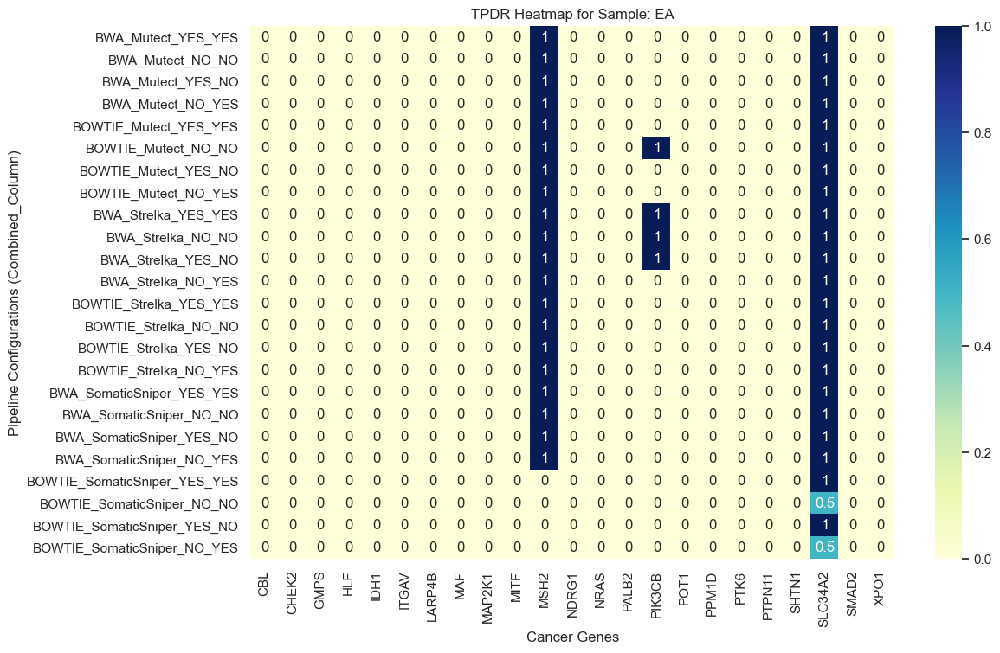

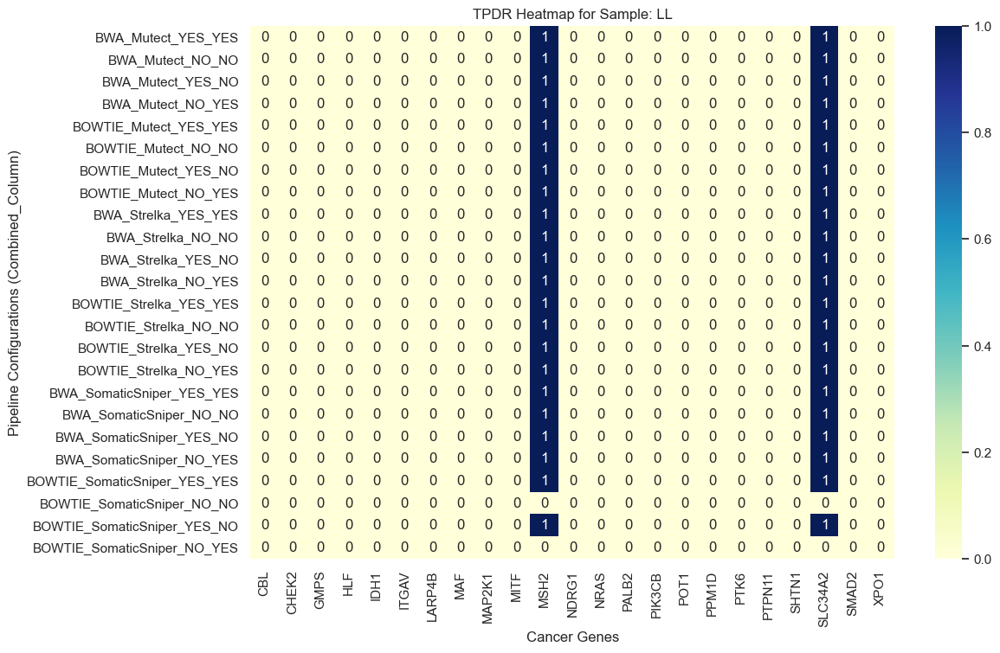

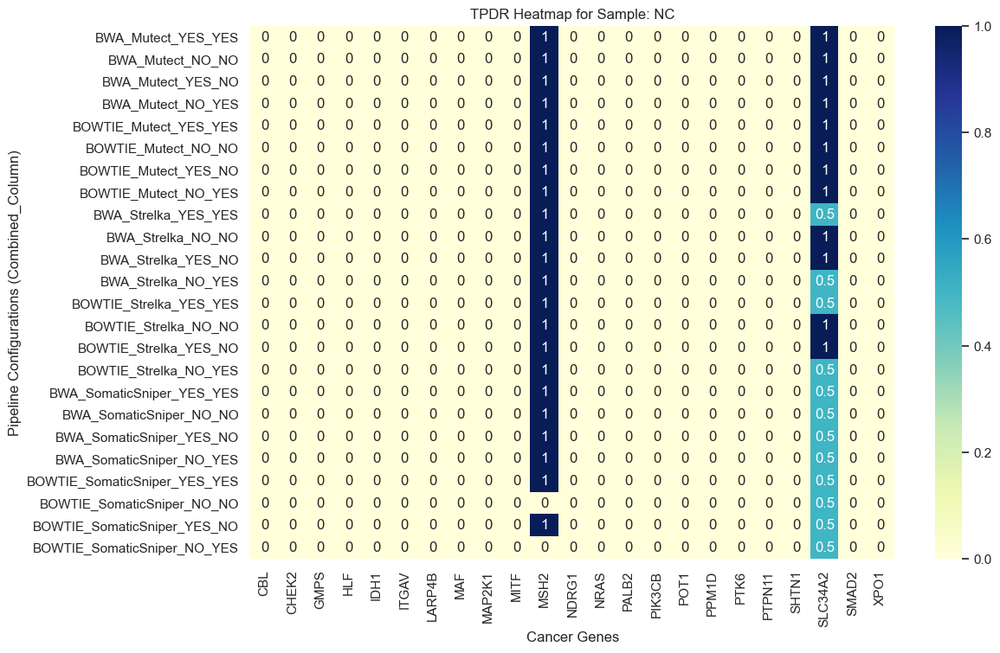

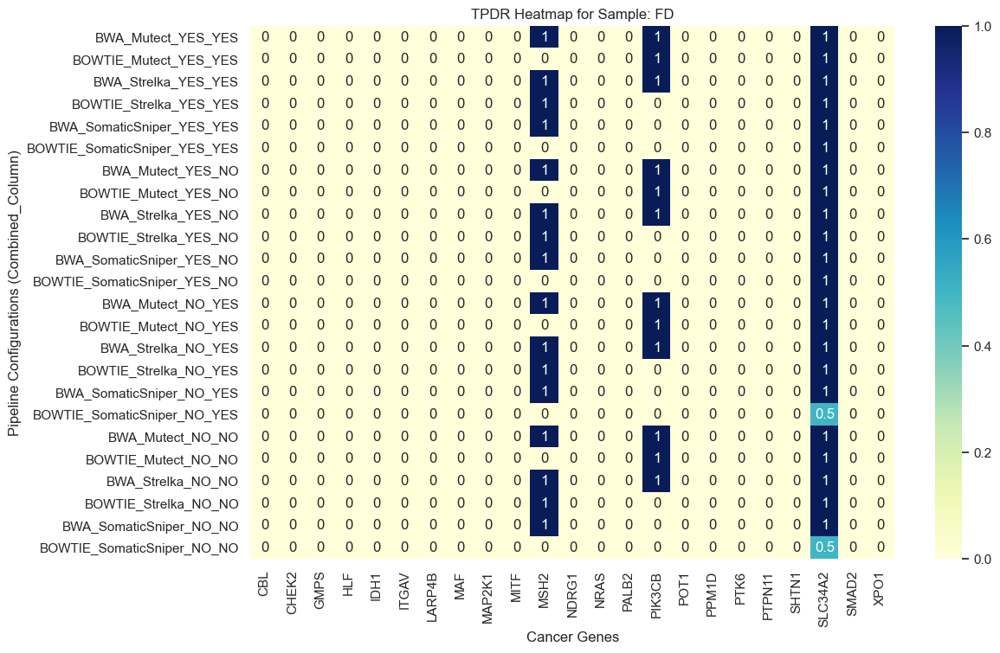

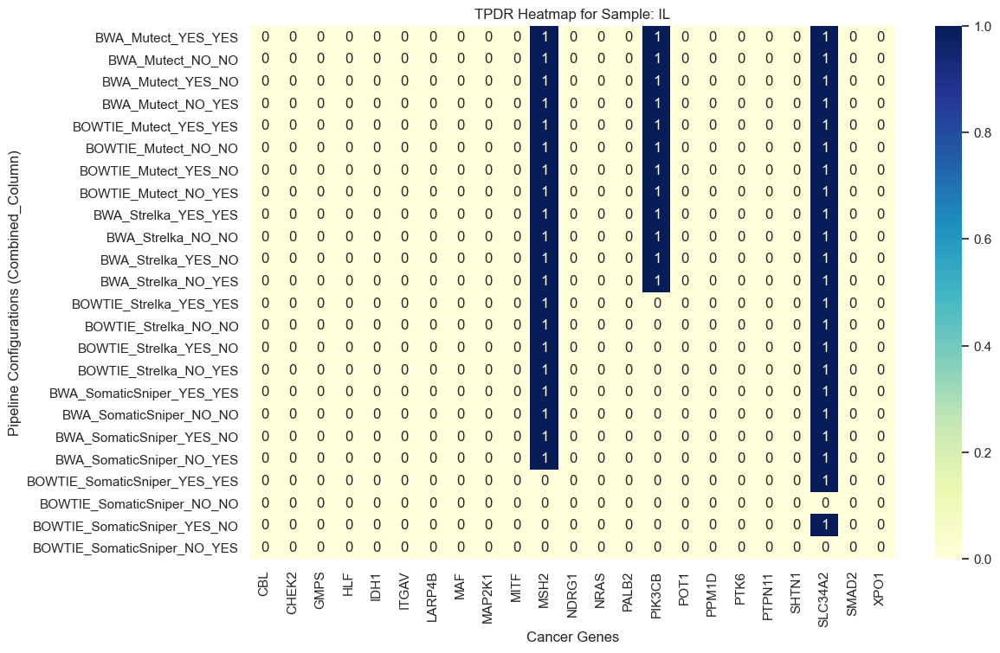

In [123]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get unique samples
unique_samples = merged_df['Sample'].unique()

# List of gene symbols (columns) in sample_df
gene_columns = ['CBL', 'CHEK2', 'GMPS', 'HLF', 'IDH1', 'ITGAV', 'LARP4B', 'MAF', 'MAP2K1', 
                'MITF', 'MSH2', 'NDRG1', 'NRAS', 'PALB2', 'PIK3CB', 'POT1', 'PPM1D', 
                'PTK6', 'PTPN11', 'SHTN1', 'SLC34A2', 'SMAD2', 'XPO1']

for sample in unique_samples:
    # Filter the merged_df for the current sample
    filtered_samples = merged_df[merged_df['Sample'] == sample]
    
    # Get unique Combined_Column values
    combined_columns = filtered_samples['Combined_Column'].unique()
    
    # Initialize an empty DataFrame to store combined results
    combined_heatmap_data = pd.DataFrame(index=combined_columns, columns=gene_columns)
    
    # Populate the DataFrame with averaged values
    for col in combined_columns:
        # Filter rows with the same Combined_Column
        rows = filtered_samples[filtered_samples['Combined_Column'] == col]
        # Average the gene TPDR values across these rows
        combined_heatmap_data.loc[col] = rows[gene_columns].mean()
    
    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(combined_heatmap_data.astype(float), annot=True, cmap="YlGnBu")
    plt.title(f"TPDR Heatmap for Sample: {sample}")
    plt.xlabel("Cancer Genes")
    plt.ylabel("Pipeline Configurations (Combined_Column)")
    plt.show()


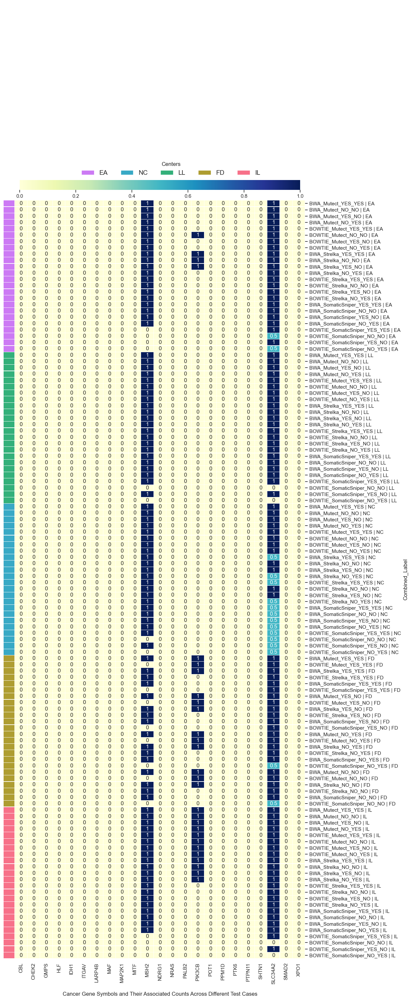

In [124]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage
from matplotlib.patches import Patch

# Assuming merged_df contains the necessary data
unique_samples = merged_df['Sample'].unique()

# List of gene symbols (columns)
gene_columns = ['CBL', 'CHEK2', 'GMPS', 'HLF', 'IDH1', 'ITGAV', 'LARP4B', 'MAF', 'MAP2K1', 
                'MITF', 'MSH2', 'NDRG1', 'NRAS', 'PALB2', 'PIK3CB', 'POT1', 'PPM1D', 
                'PTK6', 'PTPN11', 'SHTN1', 'SLC34A2', 'SMAD2', 'XPO1']

# Initialize an empty DataFrame to store combined results for all samples
combined_data = pd.DataFrame()

for sample in unique_samples:
    # Filter the merged_df for the current sample
    filtered_samples = merged_df[merged_df['Sample'] == sample]
    
    # Get unique Combined_Column values
    combined_columns = filtered_samples['Combined_Column'].unique()
    
    # Create a temporary DataFrame for this sample
    temp_df = pd.DataFrame(index=combined_columns, columns=gene_columns)
    
    # Populate the DataFrame with averaged values
    for col in combined_columns:
        rows = filtered_samples[filtered_samples['Combined_Column'] == col]
        temp_df.loc[col] = rows[gene_columns].mean()
    
    # Add a column for sample labeling
    temp_df['Sample'] = sample
    
    # Append to the combined data
    combined_data = pd.concat([combined_data, temp_df])

# Combine Sample and Combined_Column for unique labels
combined_data['Combined_Label'] = combined_data.index + ' | ' + combined_data['Sample']

# Set the index as 'Combined_Label'
combined_data.set_index('Combined_Label', inplace=True)

# Remove the 'Sample' column as it's no longer needed
combined_data.drop(columns=['Sample'], inplace=True)

# Fill NaN values with 0
combined_data.fillna(0, inplace=True)

# Create a lookup table for color mapping
sample = combined_data.index.str.split(' | ').str[-1]  # Extract the sample part from Combined_Label
lut = dict(zip(set(sample), sns.color_palette("husl", len(set(sample)))[::-1]))  # Reverse the color palette
row_colors = pd.Series(combined_data.index, index=combined_data.index).map(lambda x: lut[x.split(" | ")[1]])

# Perform hierarchical clustering on the rows
row_linkage = linkage(combined_data, method='average', metric='euclidean')

# Plot the clustermap
sns.set(font_scale=1)
g = sns.clustermap(
    combined_data, 
    row_cluster=False,  # Disable row clustering
    col_cluster=False,  # Disable column clustering
    row_linkage=row_linkage,
    annot=True,
    cmap="YlGnBu",  # Apply custom colormap
    row_colors=row_colors.values,  # Apply colors to the rows
    xticklabels=True,  # Enable x-axis labels with Gene Symbol
    yticklabels=True,  # Enable y-axis labels with Combined_Column and Sample
    linewidths=0.1,
    figsize=(15, 30),  # Adjust figsize for the layout
    cbar_kws={"orientation": "horizontal"}  # Horizontal colorbar
)

# Adjust the position of the dendrogram and the color bar
dendro_box = g.ax_row_dendrogram.get_position()
heatmap_box = g.ax_heatmap.get_position()

# Move the dendrogram to the top
g.ax_row_dendrogram.set_position([heatmap_box.x0, heatmap_box.y1 + 0.05, heatmap_box.width, 0.15])
g.ax_heatmap.set_position([heatmap_box.x0, heatmap_box.y0, heatmap_box.width, heatmap_box.height])

# Adjust the color bar position
g.cax.set_position([heatmap_box.x0 + 0.01, heatmap_box.y0 + 0.78, heatmap_box.width - 0.02, 0.01])
g.ax_heatmap.set_xlabel("\nCancer Gene Symbols and Their Associated Counts Across Different Test Cases", fontsize=12)

# Customize y-axis labels (rotate for better visibility)
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)


# Customize y-axis labels (rotate for better visibility)
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

# Add legend for sample colors with horizontal orientation and renamed to "Centers"
handles = [Patch(facecolor=lut[name], label=name) for name in lut]
plt.legend(
    handles=handles, 
    title='Centers', 
    bbox_to_anchor=(0.2, 3.4),  # Position the legend above the heatmap
    loc='upper left', 
    ncol=len(lut),  # Make the legend horizontal
    frameon=False,  # Remove the frame
    prop={'size': 14}  # Adjust font size
)

# Save the figure as a PDF
g.savefig("final_clustered_heatmap_with_centers_cancer.pdf", format="pdf", bbox_inches="tight")

# Show the plot
plt.show()


### Drug Genes

In [125]:
# Create an empty dictionary to store normalized counts for each key
drug_genes_new_dict = {}

# Iterate over each key in results_dict
for key, gene_counts in tqdm(results_dict_drug_genes.items()):
    # Create a temporary copy of the DataFrame
    vcfcomparison_df_temp = vcfcomparison_df_full.copy()

    # Split the 'TestCaseNo' by space and extract the key (which is the second element in the split result)
    vcfcomparison_df_temp['TestCaseKey'] = vcfcomparison_df_temp['TestCaseNo'].str.split(' ').str[1]
    
    # Now you can filter the samples based on the key using the temporary DataFrame
    filtered_samples = vcfcomparison_df_temp[vcfcomparison_df_temp['TestCaseKey'] == key]
    # Filter vcfcomparison_df_full for samples where the key exists
    #filtered_samples = vcfcomparison_df_full[vcfcomparison_df_full['TestCaseNo'] == key]
    
    # Create a list to store the combined column values
    combined_columns = filtered_samples['Combined_Column'].unique()
    
    # Create a DataFrame to store counts for each gene symbol and combined column
    df = pd.DataFrame(gene_counts.items(), columns=['Gene Symbol', 'Count'])
    
    # Iterate over each combined column
    for combined_column in combined_columns:
        # Filter the DataFrame for the current combined column
        combined_df = df.copy()
        
        # Set count to 0 for gene symbols not present in the filtered DataFrame
        for symbol in drug_gene_symbols:
            if symbol not in combined_df['Gene Symbol'].values:
                combined_df = combined_df.append({'Gene Symbol': symbol, 'Count': 0}, ignore_index=True)
        
        # Update new_dict with normalized counts for the current key and combined column
        drug_genes_new_dict[(key, combined_column)] = combined_df.set_index('Gene Symbol')['Count'].to_dict()

# Now new_dict contains the counts for each gene symbol, ensuring that all symbols in gene_symbols list are included with a count of 0 if not already present.


100%|██████████| 480/480 [00:12<00:00, 37.39it/s]


In [126]:
# Create an empty list to store data
data = []

# Iterate over each row in vcfcomparison_df_full
for index, row in vcfcomparison_df_full.iterrows():
    # Get the key (TestCaseNo)
    key = row['TestCaseNo'].split(' ')[1]
    
    # Check if the key exists in results_dict
    if key in results_dict_drug_genes:
        # Get the gene symbol counts for the current key
        gene_counts = results_dict_drug_genes[key]
        
        # Extract the combined column value
        combined_column_value = row['Combined_Column']
        
       
        for gene_symbol, count in gene_counts.items():
        # Append data to the list
            data.append({'Key': key,
                        'Gene Symbol': gene_symbol,
                        'Count': count,
                        'Combined_Column': combined_column_value,
                        'Sample': row['Sample']})

# Create DataFrame from the collected data
new_df_drug_genes = pd.DataFrame(data)

# Display the new DataFrame
#print(new_df)

In [127]:
new_df_drug_genes

,Key,Gene Symbol,Count,Combined_Column,Sample
0,2,ALK,1,BWA_Mutect_YES_YES,EA
1,8,ALK,1,BWA_Mutect_NO_NO,EA
2,14,ALK,1,BWA_Mutect_YES_NO,EA
3,20,ALK,1,BWA_Mutect_NO_YES,EA
4,26,ALK,1,BOWTIE_Mutect_YES_YES,EA
5,32,ALK,1,BOWTIE_Mutect_NO_NO,EA
6,38,ALK,1,BOWTIE_Mutect_YES_NO,EA
7,44,ALK,1,BOWTIE_Mutect_NO_YES,EA
8,50,ALK,1,BWA_Strelka_YES_YES,EA
9,56,MAP2K1,1,BWA_Strelka_NO_NO,EA


In [128]:
drug_gene_symbols

['BRAF',
 'ESR1',
 'MAP2K1',
 'MAP2K2',
 'FLT3',
 'KIT',
 'MET',
 'EGFR',
 'PDGFRA',
 'ALK']

In [129]:
sample_names = new_df_drug_genes['Sample'].unique()

# Generate new DataFrame to store added rows
added_rows = []

# Iterate over each unique sample in new_df_cancer_genes
for sample in sample_names:
    # Get existing Combined_Columns for the current sample
    existing_columns = new_df_drug_genes[new_df_drug_genes['Sample'] == sample]['Combined_Column'].unique()
    
    # Find missing Combined_Columns for the current sample
    missing_columns = set(all_combinations) - set(existing_columns)
    
    # Add missing Combined_Columns with zero counts for the current sample
    for column in missing_columns:
        for gene_symbol in drug_gene_symbols:  # Assuming gene_symbols is defined elsewhere
            added_rows.append({'Sample': sample, 'Combined_Column': column, 'Gene Symbol': gene_symbol, 'Count': 0})

# Add the added rows to new_df_cancer_genes
new_df_drug_genes = new_df_drug_genes.append(added_rows, ignore_index=True)

# Sort the DataFrame by Sample and Combined_Column
new_df_drug_genes.sort_values(by=['Sample', 'Combined_Column'], inplace=True)

# Display the DataFrame
print(new_df_drug_genes)


     Key Gene Symbol  Count       Combined_Column Sample
5     32         ALK      1   BOWTIE_Mutect_NO_NO     EA
32   178         ALK      1   BOWTIE_Mutect_NO_NO     EA
77   320         ALK      1   BOWTIE_Mutect_NO_NO     EA
104  466         ALK      1   BOWTIE_Mutect_NO_NO     EA
7     44         ALK      1  BOWTIE_Mutect_NO_YES     EA
..   ...         ...    ...                   ...    ...
349  NaN         KIT      0   BWA_Strelka_YES_YES     NC
350  NaN         MET      0   BWA_Strelka_YES_YES     NC
351  NaN        EGFR      0   BWA_Strelka_YES_YES     NC
352  NaN      PDGFRA      0   BWA_Strelka_YES_YES     NC
353  NaN         ALK      0   BWA_Strelka_YES_YES     NC

[1004 rows x 5 columns]


In [130]:
new_df_drug_genes[new_df_drug_genes['Sample'] == 'FD']

,Key,Gene Symbol,Count,Combined_Column,Sample
654,NaN,BRAF,0,BOWTIE_Mutect_NO_NO,FD
655,NaN,ESR1,0,BOWTIE_Mutect_NO_NO,FD
656,NaN,MAP2K1,0,BOWTIE_Mutect_NO_NO,FD
657,NaN,MAP2K2,0,BOWTIE_Mutect_NO_NO,FD
658,NaN,FLT3,0,BOWTIE_Mutect_NO_NO,FD
659,NaN,KIT,0,BOWTIE_Mutect_NO_NO,FD
660,NaN,MET,0,BOWTIE_Mutect_NO_NO,FD
661,NaN,EGFR,0,BOWTIE_Mutect_NO_NO,FD
662,NaN,PDGFRA,0,BOWTIE_Mutect_NO_NO,FD
663,NaN,ALK,0,BOWTIE_Mutect_NO_NO,FD


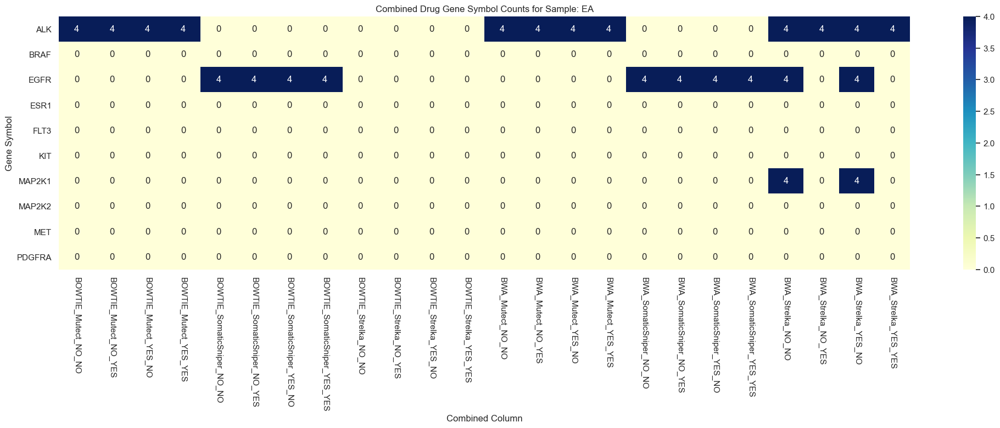

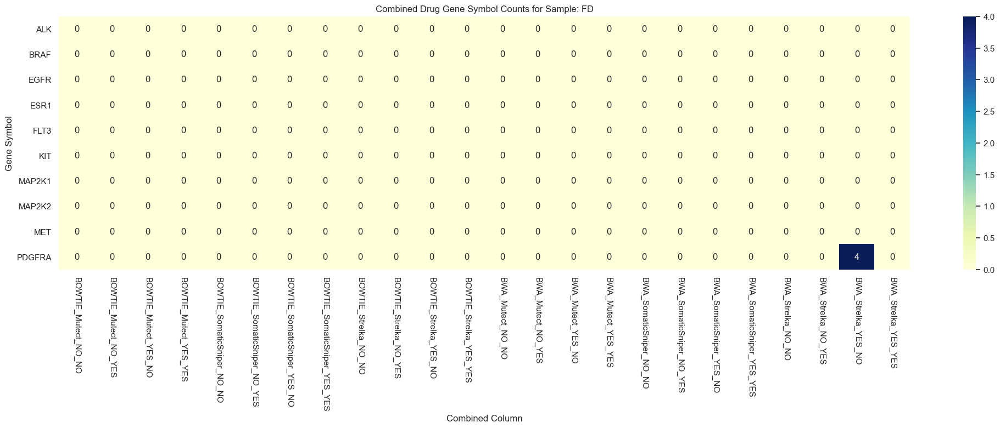

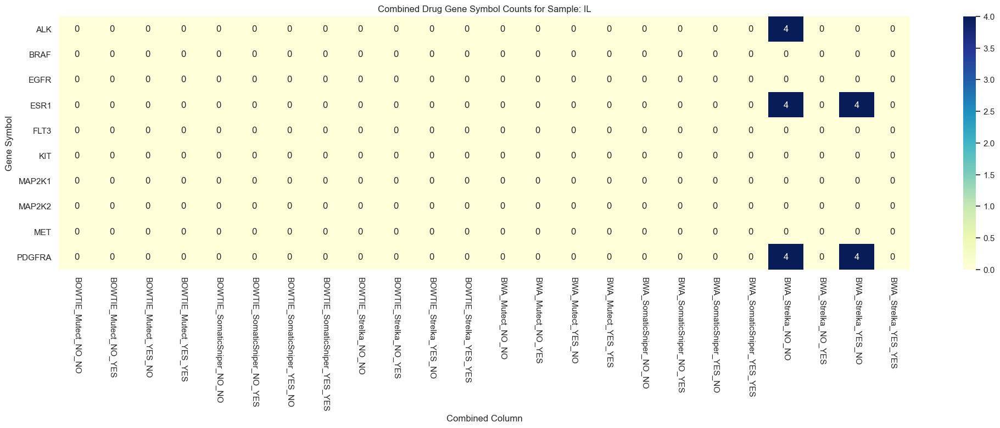

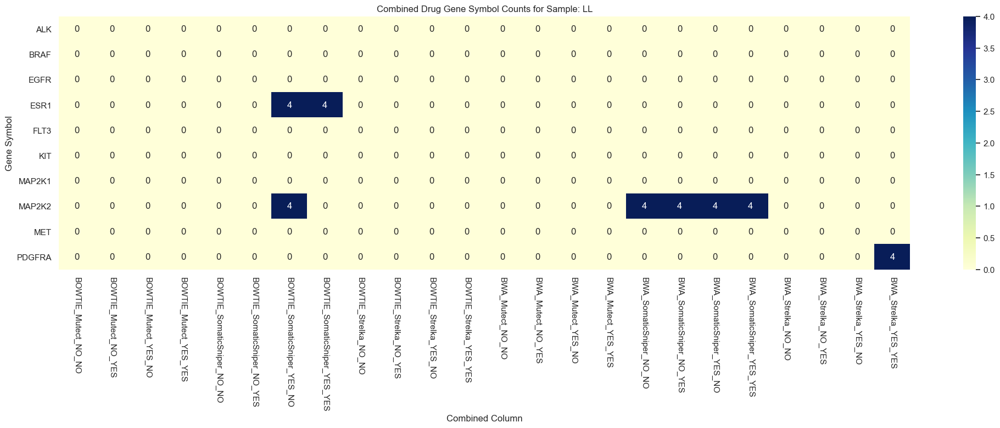

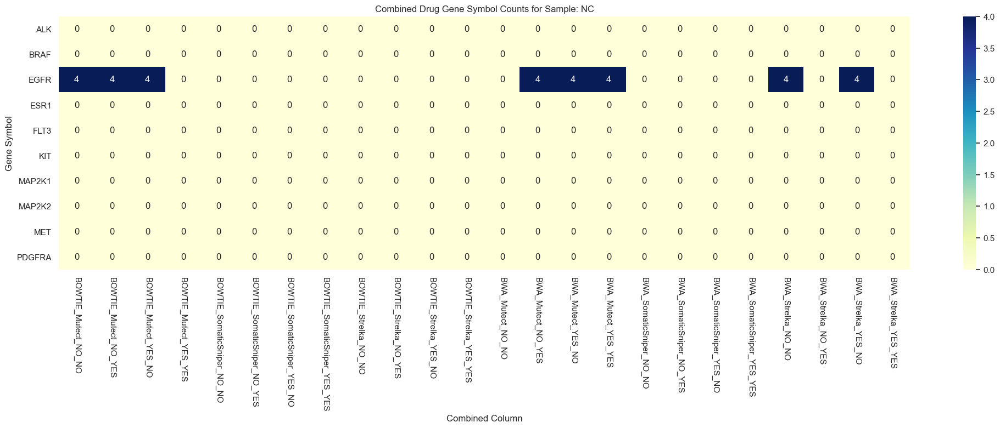

In [131]:
# Iterate over each unique sample in new_df
for sample in new_df_drug_genes['Sample'].unique():
    # Filter data for the current sample
    sample_data = new_df_drug_genes[new_df_drug_genes['Sample'] == sample]
    
    # Create an empty dictionary to store combined counts for each combined_column
    combined_counts = {}
    
    # Group by 'Combined_Column', 'Gene Symbol', and 'Sample' and sum the counts
    grouped_data = sample_data.groupby(['Combined_Column', 'Gene Symbol']).sum().reset_index()
    
    # Iterate over each row in grouped_data
    for index, row in grouped_data.iterrows():
        # Get combined_column and gene symbol
        combined_column = row['Combined_Column']
        gene_symbol = row['Gene Symbol']
        
        # Get count
        count = row['Count']
        
        # Update combined_counts dictionary
        if combined_column not in combined_counts:
            combined_counts[combined_column] = {}
        if gene_symbol not in combined_counts[combined_column]:
            combined_counts[combined_column][gene_symbol] = 0
        combined_counts[combined_column][gene_symbol] += count
    
    # Convert combined_counts dictionary to a DataFrame
    combined_counts_df = pd.DataFrame(combined_counts)
    
    # Fill NaN values with 0
    combined_counts_df.fillna(0, inplace=True)
    
    # Add missing gene symbols with count 0
    for key in results_dict_drug_genes.keys():
        missing_symbols = set(drug_gene_symbols) - set(combined_counts_df.index)
        for symbol in missing_symbols:
            combined_counts_df.loc[symbol] = 0
    
    # Sort index alphabetically
    combined_counts_df = combined_counts_df.reindex(sorted(combined_counts_df.index))
    
    # Normalize the heatmap values between 0 and 1
    #normalized_heatmap_data = combined_counts_df / combined_counts_df.max().max()
    
    # Define custom color map and normalization
    cmap = plt.cm.get_cmap('YlGnBu')
    #norm = mcolors.Normalize(vmin=0, vmax=1)
    
    # Plot the heatmap
    plt.figure(figsize=(25, 6))
    sns.heatmap(combined_counts_df, annot=True, cmap=cmap, xticklabels=True)
    plt.title(f'Combined Drug Gene Symbol Counts for Sample: {sample}')
    plt.xlabel('Combined Column')
    plt.ylabel('Gene Symbol')
    plt.xticks(rotation=-90)  # Rotate x-axis labels to -90 degrees
    plt.savefig(f'Combined_Drug_GeneSymbol_Counts_{sample}.png', format="png", bbox_inches="tight")

    plt.show()


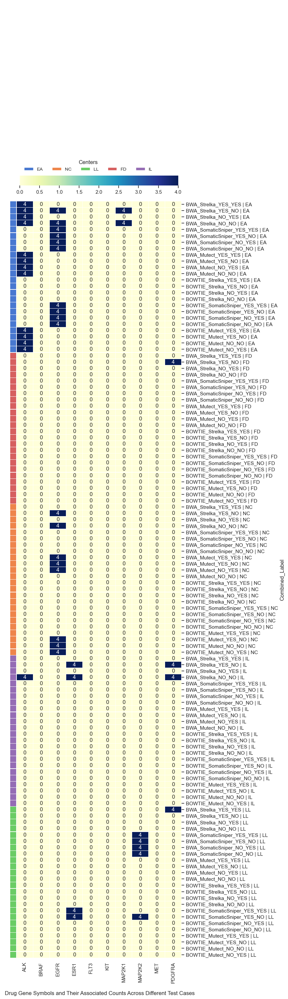

In [132]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, leaves_list
from matplotlib.patches import Patch

# Assuming the necessary data is already loaded and processed

# Group by 'Combined_Column', 'Gene Symbol', and 'Sample' and sum the counts
grouped_data = new_df_drug_genes.groupby(['Combined_Column', 'Gene Symbol', 'Sample']).sum().reset_index()

# Create a combined label for the x-axis
grouped_data['Combined_Label'] = grouped_data['Combined_Column'] + ' | ' + grouped_data['Sample'].astype(str)

# Pivot the data to have 'Combined_Label' as rows and 'Gene Symbol' as columns (transpose the data)
pivot_df = grouped_data.pivot(index='Combined_Label', columns='Gene Symbol', values='Count')

# Fill NaN values with 0 or any placeholder value
pivot_df.fillna(0, inplace=True)

# Assign colors to different centers using a color palette
sample = grouped_data['Sample'].astype(str)  # Ensure all values are strings
lut = dict(zip(set(sample), sns.color_palette("muted")))  # Use a color palette
row_colors = pd.Series(pivot_df.index, index=pivot_df.index).map(lambda x: lut[x.split(" | ")[1]])

# Perform hierarchical clustering on the rows based on center labels
center_order = pd.Series(row_colors.index).map(lambda x: x.split(' | ')[1])
center_linkage = linkage(center_order.factorize()[0].reshape(-1, 1), method='average', metric='euclidean')
center_ordered = leaves_list(center_linkage)

# Reorder the DataFrame and row colors according to the clustering based on centers
pivot_df = pivot_df.iloc[center_ordered, :]
row_colors = row_colors.iloc[center_ordered]

# Create a custom colormap for the heatmap
cmap = plt.cm.get_cmap('YlGnBu')

# Plot the heatmap with the dendrogram on top
sns.set(font_scale=1)
g = sns.clustermap(
    pivot_df, 
    col_cluster=False,  # Disable column clustering
    row_cluster=False,  # Disable row clustering
    row_linkage=center_linkage,  # Cluster by center labels
    annot=True,
    cmap=cmap,  # Apply custom colormap
    row_colors=row_colors.values,  # Apply colors to the rows
    xticklabels=True,  # Enable x-axis labels with Gene Symbol (since data is rotated)
    yticklabels=True,  # Enable y-axis labels with Combined_Column and Sample
    linewidths=0.1,
    figsize=(10, 30),  # Adjust figsize for the rotated layout
    cbar_kws={"orientation": "horizontal"}  # Horizontal colorbar
)

# Adjust the position of the dendrogram and the color bar
dendro_box = g.ax_row_dendrogram.get_position()
heatmap_box = g.ax_heatmap.get_position()

# Move the dendrogram to the top
g.ax_row_dendrogram.set_position([heatmap_box.x0, heatmap_box.y1 + 0.05, heatmap_box.width, 0.15])
g.ax_heatmap.set_position([heatmap_box.x0, heatmap_box.y0, heatmap_box.width, heatmap_box.height])

# Adjust the color bar position
g.cax.set_position([heatmap_box.x0 + 0.01, heatmap_box.y0 + 0.78, heatmap_box.width - 0.02, 0.01])
g.ax_heatmap.set_xlabel("\n Drug Gene Symbols and Their Associated Counts Across Different Test Cases", fontsize=12)

# Customize y-axis labels (rotate for better visibility)
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

# Add legend for center colors with a horizontal layout
handles = [Patch(facecolor=lut[name], label=name) for name in lut]
plt.legend(
    handles=handles, 
    title='Centers', 
    bbox_to_anchor=(0.0, 3.0),  # Position the legend above the heatmap
    loc='upper left', 
    ncol=len(lut),  # Make the legend horizontal
    frameon=False,  # Remove the frame
    prop={'size': 10}  # Adjust font size
)

# Save the figure as a PDF
plt.savefig("drug_clustered_heatmap_ordered_by_centers_with_dendrogram_on_top.pdf", format="pdf", bbox_inches="tight")

# Show the plot
plt.show()


In [133]:
import pandas as pd

# Assuming drug_gene_symbols contains the gene symbols you're interested in
drug_gene_symbols = filtered_df_drug['Gene Symbol'].unique()

# Initialize the tpr_df with rows as TestCaseNo and columns as drug genes
tpr_df = pd.DataFrame(index=sets_dict.keys(), columns=drug_gene_symbols)

for test_case, detected_variants in sets_dict.items():
    for _, gene_info in filtered_df_drug.iterrows():
        gene_symbol = gene_info['Gene Symbol']
        chr_number = gene_info['Chr Number']
        location_start = int(gene_info['Location Start'])
        location_end = int(gene_info['Location End'])
        
        # True Positives (TP): Variants in both detected_variants and high_confidence
        tp = sum(1 for variant in detected_variants 
                 if variant in high_confidence and 
                 chr_number in variant and 
                 location_start <= int(variant.split('_')[1]) <= location_end)
        
        # False Negatives (FN): Variants in high_confidence but not in detected_variants
        fn = sum(1 for variant in high_confidence 
                 if variant not in detected_variants and 
                 chr_number in variant and 
                 location_start <= int(variant.split('_')[1]) <= location_end)
        
        # Calculate TPDR
        if tp + fn > 0:
            tpdr = tp / (tp + fn)
        else:
            tpdr = 0.0
        
        # Store the TPDR in the DataFrame
        tpr_df.at[test_case, gene_symbol] = tpdr

# Assuming tpr_df, vcfcomparison_df_full are already defined

# Extracting Sample and Combined_Column from vcfcomparison_df_full
vcfcomparison_df_full['Matched_Key'] = vcfcomparison_df_full['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# Merging tpr_df with vcfcomparison_df_full based on Matched_Key
merged_df = vcfcomparison_df_full.merge(tpr_df, left_on='Matched_Key', right_index=True)

# Now merged_df contains Sample, Combined_Column, and TPDR values





In [134]:
merged_df

,TestCaseNo,phase,Sample,operatingSystem,Environment,isTrimmed,baseRecalibration,Mapper,M_Version,VariantCaller,VC_Version,ReferenceGenom,Duplicates,VariantFilter,FilterPass,SOMATICfilter,remove_indels,TMB,FileLink,Result VCF Count,Author,Slurm_id,Node,ElapsedTime,Combined_Column,Matched_Key,BRAF,ESR1,MAP2K1,MAP2K2,FLT3,KIT,MET,EGFR,PDGFRA,ALK
0,TestCase 2,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.613695,https://drive.google.com/drive/folders/11CFGjN...,1261,GUL EDA,29812.0,a047,07:15:00,BWA_Mutect_YES_YES,2,0,0,0,0,0,0,0,0,0,1
1,TestCase 8,done,EA,Linux,Altay + COSAP,NO,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.799425,https://drive.google.com/drive/folders/1I7r5au...,1276,GUL EDA,29812.0,a047,06:12:47,BWA_Mutect_NO_NO,8,0,0,0,0,0,0,0,0,0,1
2,TestCase 14,done,EA,Linux,Altay + COSAP,YES,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,16.009919,https://drive.google.com/drive/folders/1AN-msy...,1293,GUL EDA,29812.0,a047,05:48:51,BWA_Mutect_YES_NO,14,0,0,0,0,0,0,0,0,0,1
3,TestCase 20,done,EA,Linux,Altay + COSAP,NO,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.316527,https://drive.google.com/drive/folders/1hhxI84...,1237,GUL EDA,29812.0,a047,07:44:08,BWA_Mutect_NO_YES,20,0,0,0,0,0,0,0,0,0,1
4,TestCase 26,done,EA,Linux,Altay + COSAP,YES,YES,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.397318,https://drive.google.com/drive/folders/1sxq7kO...,1082,GUL EDA,29811.0,a078,07:36:41,BOWTIE_Mutect_YES_YES,26,0,0,0,0,0,0,0,0,0,1
5,TestCase 32,done,EA,Linux,Altay + COSAP,NO,NO,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.545902,https://drive.google.com/drive/folders/1aU_EFn...,1094,GUL EDA,29811.0,a078,09:57:30,BOWTIE_Mutect_NO_NO,32,0,0,0,0,0,0,0,0,0,1
6,TestCase 38,done,EA,Linux,Altay + COSAP,YES,NO,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.830688,https://drive.google.com/drive/folders/1Zi72RD...,1117,GUL EDA,29811.0,a078,06:05:48,BOWTIE_Mutect_YES_NO,38,0,0,0,0,0,0,0,0,0,1
7,TestCase 44,done,EA,Linux,Altay + COSAP,NO,YES,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.310644,https://drive.google.com/drive/folders/1L-ZfgL...,1075,GUL EDA,29811.0,a078,10:37:11,BOWTIE_Mutect_NO_YES,44,0,0,0,0,0,0,0,0,0,1
8,TestCase 50,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Strelka,NaN,hg38,MARK,NaN,NaN,NaN,NaN,23.711520,https://drive.google.com/drive/folders/1RmzNj5...,1915,GUL EDA,29813.0,a063,03:34:43,BWA_Strelka_YES_YES,50,0,0,0,0,0,0,0,0,0,1
9,TestCase 56,done,EA,Linux,Altay + COSAP,NO,NO,BWA,NaN,Strelka,NaN,hg38,MARK,NaN,NaN,NaN,NaN,27.797578,https://drive.google.com/drive/folders/1UAhDec...,2245,GUL EDA,29813.0,a063,01:39:41,BWA_Strelka_NO_NO,56,0,0,0,0,0,0,0,0,0,1


In [135]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage
from matplotlib.patches import Patch

# Assuming merged_df contains the necessary data
unique_samples = merged_df['Sample'].unique()

# List of gene symbols (columns)
gene_columns = ['CBL', 'CHEK2', 'GMPS', 'HLF', 'IDH1', 'ITGAV', 'LARP4B', 'MAF', 'MAP2K1', 
                'MITF', 'MSH2', 'NDRG1', 'NRAS', 'PALB2', 'PIK3CB', 'POT1', 'PPM1D', 
                'PTK6', 'PTPN11', 'SHTN1', 'SLC34A2', 'SMAD2', 'XPO1']

# Initialize an empty DataFrame to store combined results for all samples
combined_data = pd.DataFrame()

for sample in unique_samples:
    # Filter the merged_df for the current sample
    filtered_samples = merged_df[merged_df['Sample'] == sample]
    
    # Get unique Combined_Column values
    combined_columns = filtered_samples['Combined_Column'].unique()
    
    # Create a temporary DataFrame for this sample
    temp_df = pd.DataFrame(index=combined_columns, columns=gene_columns)
    
    # Populate the DataFrame with averaged values
    for col in combined_columns:
        rows = filtered_samples[filtered_samples['Combined_Column'] == col]
        temp_df.loc[col] = rows[gene_columns].mean()
    
    # Add a column for sample labeling
    temp_df['Sample'] = sample
    
    # Append to the combined data
    combined_data = pd.concat([combined_data, temp_df])

# Combine Sample and Combined_Column for unique labels
combined_data['Combined_Label'] = combined_data.index + ' | ' + combined_data['Sample']

# Set the index as 'Combined_Label'
combined_data.set_index('Combined_Label', inplace=True)

# Remove the 'Sample' column as it's no longer needed
combined_data.drop(columns=['Sample'], inplace=True)

# Fill NaN values with 0
combined_data.fillna(0, inplace=True)

# Create a lookup table for color mapping
sample = combined_data.index.str.split(' | ').str[-1]  # Extract the sample part from Combined_Label
lut = dict(zip(set(sample), sns.color_palette("husl", len(set(sample)))[::-1]))  # Reverse the color palette
row_colors = pd.Series(combined_data.index, index=combined_data.index).map(lambda x: lut[x.split(" | ")[1]])

# Perform hierarchical clustering on the rows
row_linkage = linkage(combined_data, method='average', metric='euclidean')

# Plot the clustermap
sns.set(font_scale=1)
g = sns.clustermap(
    combined_data, 
    row_cluster=False,  # Disable row clustering
    col_cluster=False,  # Disable column clustering
    row_linkage=row_linkage,
    annot=True,
    cmap="YlGnBu",  # Apply custom colormap
    row_colors=row_colors.values,  # Apply colors to the rows
    xticklabels=True,  # Enable x-axis labels with Gene Symbol
    yticklabels=True,  # Enable y-axis labels with Combined_Column and Sample
    linewidths=0.1,
    figsize=(15, 30),  # Adjust figsize for the layout
    cbar_kws={"orientation": "horizontal"}  # Horizontal colorbar
)

# Adjust the position of the dendrogram and the color bar
dendro_box = g.ax_row_dendrogram.get_position()
heatmap_box = g.ax_heatmap.get_position()

# Move the dendrogram to the top
g.ax_row_dendrogram.set_position([heatmap_box.x0, heatmap_box.y1 + 0.05, heatmap_box.width, 0.15])
g.ax_heatmap.set_position([heatmap_box.x0, heatmap_box.y0, heatmap_box.width, heatmap_box.height])

# Adjust the color bar position
g.cax.set_position([heatmap_box.x0 + 0.01, heatmap_box.y0 + 0.78, heatmap_box.width - 0.02, 0.01])
g.ax_heatmap.set_xlabel("\nDrug Gene Symbols and Their Associated Counts Across Different Test Cases", fontsize=12)

# Customize y-axis labels (rotate for better visibility)
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

# Add legend for sample colors with horizontal orientation and renamed to "Centers"
handles = [Patch(facecolor=lut[name], label=name) for name in lut]
plt.legend(
    handles=handles, 
    title='Centers', 
    bbox_to_anchor=(0.2, 3.4),  # Position the legend above the heatmap
    loc='upper left', 
    ncol=len(lut),  # Make the legend horizontal
    frameon=False,  # Remove the frame
    prop={'size': 14}  # Adjust font size
)

# Save the figure as a PDF
g.savefig("final_clustered_heatmap_with_centers_drug.pdf", format="pdf", bbox_inches="tight")

# Show the plot
plt.show()


KeyError: "['POT1', 'PPM1D', 'LARP4B', 'MSH2', 'CBL', 'NRAS', 'PTK6', 'CHEK2', 'NDRG1', 'SMAD2', 'MAF', 'HLF', 'MITF', 'PALB2', 'ITGAV', 'GMPS', 'SLC34A2', 'PIK3CB', 'XPO1', 'SHTN1', 'IDH1', 'PTPN11'] not in index"

In [ ]:
new_df_drug_genes

In [ ]:
new_df_drug_genes['Combined_Label'] = new_df_drug_genes['Combined_Column'] + ' | ' + new_df_drug_genes['Sample'].astype(str)


In [ ]:
new_df_cancer_genes

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, leaves_list
from matplotlib.patches import Patch

# Function to process the data and generate heatmap data structures
def process_dataframe(df):
    # Group by 'Combined_Column', 'Gene Symbol', and 'Sample' and sum the counts
    grouped_data = df.groupby(['Combined_Column', 'Gene Symbol', 'Sample']).sum().reset_index()
    
    # Create a combined label for the x-axis
    grouped_data['Combined_Label'] = grouped_data['Combined_Column'] + ' | ' + grouped_data['Sample'].astype(str)
    
    # Pivot the data to have 'Combined_Label' as rows and 'Gene Symbol' as columns (transpose the data)
    pivot_df = grouped_data.pivot(index='Combined_Label', columns='Gene Symbol', values='Count')
    
    # Fill NaN values with 0 or any placeholder value
    pivot_df.fillna(0, inplace=True)
    
    # Assign colors to different centers using a color palette
    sample = grouped_data['Sample'].astype(str)  # Ensure all values are strings
    lut = dict(zip(set(sample), sns.color_palette("muted")))  # Use a color palette
    row_colors = pd.Series(pivot_df.index, index=pivot_df.index).map(lambda x: lut[x.split(" | ")[1]])
    
    # Perform hierarchical clustering on the rows based on center labels
    center_order = pd.Series(row_colors.index).map(lambda x: x.split(' | ')[1])
    center_linkage = linkage(center_order.factorize()[0].reshape(-1, 1), method='average', metric='euclidean')
    center_ordered = leaves_list(center_linkage)
    
    # Reorder the DataFrame and row colors according to the clustering based on centers
    pivot_df = pivot_df.iloc[center_ordered, :]
    row_colors = row_colors.iloc[center_ordered]
    
    return pivot_df, row_colors, center_linkage, lut

# Process both dataframes (assume new_df_drug_genes and new_df_cancer_genes are already loaded)
drug_pivot_df, drug_row_colors, drug_center_linkage, lut_drug = process_dataframe(new_df_drug_genes)
cancer_pivot_df, cancer_row_colors, cancer_center_linkage, lut_cancer = process_dataframe(new_df_cancer_genes)

# Create a custom colormap for the heatmap
cmap = plt.cm.get_cmap('YlGnBu')

# Initialize the figure
fig, axes = plt.subplots(1, 2, figsize=(20, 30))

# Create the first clustermap for drug genes
g1 = sns.clustermap(
    drug_pivot_df, 
    col_cluster=False,  
    row_cluster=False,  
    row_linkage=drug_center_linkage,  
    annot=True,
    cmap=cmap,  
    row_colors=drug_row_colors.values,  
    xticklabels=True,  
    yticklabels=True,  
    linewidths=0.1,
    figsize=(10, 30),  
    cbar=False,  # Disable colorbar for now
    ax=axes[0]  # Use the first subplot
)
axes[0].set_title('Drug Gene Symbols')

# Create the second clustermap for cancer genes
g2 = sns.clustermap(
    cancer_pivot_df, 
    col_cluster=False,  
    row_cluster=False,  
    row_linkage=cancer_center_linkage,  
    annot=True,
    cmap=cmap,  
    row_colors=cancer_row_colors.values,  
    xticklabels=True,  
    yticklabels=False,  # Disable y-axis labels for the second heatmap
    linewidths=0.1,
    figsize=(10, 30),
    cbar_kws={"orientation": "horizontal"},  # Place colorbar at the bottom
    ax=axes[1]  # Use the second subplot
)
axes[1].set_title('Cancer Gene Symbols')

# Hide the colorbar of the first clustermap (g1)
g1.cax.set_visible(False)

# Add a shared legend for the center colors
handles = [Patch(facecolor=lut_drug[name], label=name) for name in lut_drug]
fig.legend(
    handles=handles, 
    title='Centers', 
    bbox_to_anchor=(0.5, 1.02), 
    loc='upper center', 
    ncol=len(lut_drug), 
    frameon=False, 
    prop={'size': 10}
)

# Adjust the color bar position
g2.cax.set_position([0.3, 0.05, 0.4, 0.02])

# Save the figure as a PDF
plt.savefig("combined_clustermaps.pdf", format="pdf", bbox_inches="tight")

# Show the plot
plt.show()


In [ ]:
row_colors

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, leaves_list
from matplotlib.patches import Patch

# Function to process the data and generate heatmap data structures
def process_dataframe(df):
    # Group by 'Combined_Column', 'Gene Symbol', and 'Sample' and sum the counts
    grouped_data = df.groupby(['Combined_Column', 'Gene Symbol', 'Sample']).sum().reset_index()
    
    # Create a combined label for the x-axis
    grouped_data['Combined_Label'] = grouped_data['Combined_Column'] + ' | ' + grouped_data['Sample'].astype(str)
    
    # Pivot the data to have 'Combined_Label' as rows and 'Gene Symbol' as columns (transpose the data)
    pivot_df = grouped_data.pivot(index='Combined_Label', columns='Gene Symbol', values='Count')
    
    # Fill NaN values with 0 or any placeholder value
    pivot_df.fillna(0, inplace=True)
    
    # Assign colors to different centers using a color palette
    sample = grouped_data['Sample'].astype(str)  # Ensure all values are strings
    lut = dict(zip(set(sample), sns.color_palette("muted")))  # Use a color palette
    row_colors = pd.Series(pivot_df.index, index=pivot_df.index).map(lambda x: lut[x.split(" | ")[1]])
    
    # Perform hierarchical clustering on the rows based on center labels
    center_order = pd.Series(row_colors.index).map(lambda x: x.split(' | ')[1])
    center_linkage = linkage(center_order.factorize()[0].reshape(-1, 1), method='average', metric='euclidean')
    center_ordered = leaves_list(center_linkage)
    
    # Reorder the DataFrame and row colors according to the clustering based on centers
    pivot_df = pivot_df.iloc[center_ordered, :]
    row_colors = row_colors.iloc[center_ordered]
    
    return pivot_df, row_colors, center_linkage, lut

# Process both dataframes
drug_pivot_df, drug_row_colors, drug_center_linkage, lut = process_dataframe(new_df_drug_genes)
cancer_pivot_df, cancer_row_colors, cancer_center_linkage, _ = process_dataframe(new_df_cancer_genes)


# Create a custom colormap for the heatmap
cmap = plt.cm.get_cmap('YlGnBu')

# Initialize the figure
fig = plt.figure(figsize=(20, 30))


# Add the second heatmap to the figure
ax1 = fig.add_subplot(121)
sns.clustermap(
    cancer_pivot_df,
    cmap=cmap,
    annot=True,
    row_colors=cancer_row_colors.values,  # Apply colors to the rows
    linewidths=0.1,
    cbar_kws={"orientation": "horizontal"},
    yticklabels=False,
)
ax1.set_title('Cancer Gene Symbols')

# Add the first heatmap to the figure
ax2 = fig.add_subplot(122, sharey=ax1)
sns.clustermap(
    drug_pivot_df,
    cmap=cmap,
    annot=True,
    linewidths=0.1,
    yticklabels=True
)
ax2.set_title('Drug Gene Symbols')


# Add the colorbar below the heatmaps
#cbar = fig.colorbar(ax2.collections[0], ax=[ax1, ax2], orientation="horizontal", fraction=0.05, pad=0.05)
cbar.set_label("Counts")

# Add legend for the row colors
handles = [Patch(facecolor=lut[name], label=name) for name in lut]
fig.legend(
    handles=handles, 
    title='Centers', 
    bbox_to_anchor=(0.5, 1.05), 
    loc='upper center', 
    ncol=len(lut), 
    frameon=False, 
    prop={'size': 10}
)

# Save the figure
plt.savefig("combined_heatmaps.pdf", format="pdf", bbox_inches="tight")

# Show the plot
plt.show()


### Combined

In [ ]:
vcfcomparison_df_full['TestCaseNo'] = vcfcomparison_df_full['TestCaseNo'].str.split(' ').str[1]


In [ ]:
# Group by Sample, Mapper, VariantCaller, isTrimmed, and baseRecalibration
grouped = vcfcomparison_df_full.groupby(['Sample', 'Mapper', 'VariantCaller', 'isTrimmed', 'baseRecalibration'])

# Select the first TestCaseNo in each group
selected_test_cases = grouped['TestCaseNo'].first().reset_index()

# Extract the selected TestCaseNos
selected_test_case_nos = selected_test_cases['TestCaseNo'].astype(str).tolist()

# Create a new dictionary to hold the filtered sets_dict
filtered_sets_dict = {key: sets_dict[key] for key in sets_dict if key in selected_test_case_nos}

# Print the filtered sets_dict
print(filtered_sets_dict)

In [ ]:
all_variants = set().union(*filtered_sets_dict.values())

In [ ]:
# Initialize dictionaries to store variant counts and F1-scores
variant_info = {'Variant': [], 'Count': []}
variant_test_cases = {'Variant': [], 'TestCaseNo': []}

# Iterate through each variant
for variant in tqdm(all_variants):
    # Initialize counts and F1-score for the current variant
    count = 0
    # Iterate through each key in sets_dict
    for key, variants_set in filtered_sets_dict.items():
        # Check if variant is present in the set for the current TestCaseNo
        if variant in variants_set:
            # Increment count for the current variant
            count += 1
            # Store the TestCaseNo for this variant
            variant_test_cases['Variant'].append(variant)
            variant_test_cases['TestCaseNo'].append(key)
    # Append information to the dictionary
    variant_info['Variant'].append(variant)
    variant_info['Count'].append(count)

# Create DataFrame from the variant_info dictionary
variant_info_df = pd.DataFrame(variant_info)

# Create DataFrame for variant-test case associations
variant_test_cases_df = pd.DataFrame(variant_test_cases)


In [ ]:
variant_test_cases_df

In [ ]:
# Merge variant_info_df and variant_test_cases_df on 'Variant' column
combined_df = pd.merge(variant_info_df, variant_test_cases_df, on='Variant')

print(combined_df)

In [ ]:
# Count'lara göre gruplayıp, her grup için Variant'ları bir küme (set) olarak toplayalım
variant_groups = combined_df.groupby('Count')['Variant'].apply(set)

# Count'u kendisine eşit ve daha büyük olan varyantları içeren bir sözlük oluşturalım
variant_dict = {}
variant_dict_greater = {}
variant_dict_lower = {}

for count, variants in variant_groups.items():
    variants_with_exact_count = set(combined_df[combined_df['Count'] == count]['Variant'])
    variant_dict[count] = variants_with_exact_count
    
    variants_with_greater_count = set(combined_df[combined_df['Count'] >= count]['Variant'])
    variant_dict_greater[count] = variants_with_greater_count
    
    variants_with_lower_count = set(combined_df[combined_df['Count'] <= count]['Variant'])
    variant_dict_lower[count] = variants_with_lower_count


# Oluşturduğumuz sözlüğü yazdıralım
#variant_dict
#variant_dict_greater

In [ ]:
f1_scores = {}
recall_scores = {}
precision_scores = {}

metrics = {}

# Her variant_dict[count] listesi için işlem yapalım
for count, variants in variant_dict.items():
    
    # F1 score'u sözlüğe ekleyelim
    f1_scores[count] = get_f1score(variant_dict[count],high_confidence)
    recall_scores[count] = get_recall(variant_dict[count],high_confidence)
    precision_scores[count] = get_precision(variant_dict[count],high_confidence)
    metrics[count] = {'Precision': precision_scores[count], 'Recall': recall_scores[count], 'F1-Score': f1_scores[count]}


# Elde edilen F1 score'ları yazdıralım
f1_scores_df = pd.DataFrame(list(f1_scores.items()), columns=['Count', 'F1_Score'])
#f1_scores_df


##GREATER
f1_scores_greater = {}
recall_scores_greater = {}
precision_scores_greater = {}

metrics_greater = {}
for count, variants in variant_dict_greater.items():
    
    # F1 score'u sözlüğe ekleyelim
    f1_scores_greater[count] = get_f1score(variant_dict_greater[count],high_confidence)
    recall_scores_greater[count] = get_recall(variant_dict_greater[count],high_confidence)
    precision_scores_greater[count] = get_precision(variant_dict_greater[count],high_confidence)
    metrics_greater[count] = {'Precision': precision_scores_greater[count], 'Recall': recall_scores_greater[count], 'F1-Score': f1_scores_greater[count]}


# Elde edilen F1 score'ları yazdıralım
f1_scores_df_greater = pd.DataFrame(list(f1_scores_greater.items()), columns=['Count', 'F1_Score'])
metrics_greater_df = pd.DataFrame.from_dict(metrics_greater, orient='index')

#f1_scores_df_greater

##LOWER
f1_scores_lower = {}

for count, variants in variant_dict_greater.items():
    
    # F1 score'u sözlüğe ekleyelim
    f1_scores_lower[count] = get_f1score(variant_dict_lower[count],high_confidence)

# Elde edilen F1 score'ları yazdıralım
f1_scores_df_lower = pd.DataFrame(list(f1_scores_lower.items()), columns=['Count', 'F1_Score'])
#f1_scores_df_greater

In [ ]:
# Plotting
plt.figure(figsize=(10, 6), facecolor='white')
plt.scatter(f1_scores_df_greater['Count'], metrics_greater_df['F1-Score'],label='F1-Score')
plt.scatter(f1_scores_df_greater['Count'], metrics_greater_df['Recall'],label='Recall')
plt.scatter(f1_scores_df_greater['Count'], metrics_greater_df['Precision'],label='Precision')

# Highlighting the maximum F1-Score
max_f1_score = metrics_greater_df['F1-Score'].max()
max_f1_index = metrics_greater_df['F1-Score'].idxmax()
max_f1_count = f1_scores_df_greater.loc[max_f1_index, 'Count']

plt.scatter(max_f1_count, max_f1_score, color='red')  # Highlight the max point
plt.annotate(f'Max F1-Score: {max_f1_score:.2f}', xy=(max_f1_count, max_f1_score),
             xytext=(max_f1_count+5, max_f1_score-0.1),
             arrowprops=dict(facecolor='red', shrink=0.05))

# Adding a vertical line from the max F1-score to the x-axis
plt.axvline(x=max_f1_count, color='red', linestyle='--', linewidth=1)

# Annotating the x-axis value of the vertical line
#plt.annotate(f'{max_f1_count}', xy=(max_f1_count, 0), xytext=(max_f1_count, -0.05),
#             ha='center', va='top', color='red')

# Add custom tick for max F1-Score count on x-axis
plt.xticks(list(plt.xticks()[0]) + [max_f1_count])

plt.xlabel('\nNumber of Pipelines')
plt.ylabel('Performance Metrics\n(F1 Score, Recall, Precision)\n')
#plt.title('Scores vs. Count... >=')
plt.xlim(0, 100)
plt.ylim(0, 1)
plt.grid(True)
plt.legend()
plt.savefig("scores_all_cumulative_4.pdf", format='pdf')

plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the Seaborn style and context
sns.set(style="whitegrid", context="talk")

# Plotting with Seaborn
plt.figure(figsize=(10, 6), facecolor='white')

# Scatter plots for F1 Score, Recall, and Precision
sns.scatterplot(x=f1_scores_df_greater['Count'], y=metrics_greater_df['F1-Score'], label='F1-Score')
sns.scatterplot(x=f1_scores_df_greater['Count'], y=metrics_greater_df['Recall'], label='Recall')
sns.scatterplot(x=f1_scores_df_greater['Count'], y=metrics_greater_df['Precision'], label='Precision')

# Highlighting the maximum F1-Score
max_f1_score = metrics_greater_df['F1-Score'].max()
max_f1_index = metrics_greater_df['F1-Score'].idxmax()
max_f1_count = f1_scores_df_greater.loc[max_f1_index, 'Count']

# Highlight the max point with a longer arrow
plt.scatter(max_f1_count, max_f1_score, color='red', zorder=5)
plt.annotate(f'Max F1-Score: {max_f1_score:.2f}', xy=(max_f1_count, max_f1_score),
             xytext=(max_f1_count + 10, max_f1_score - 0.3),  # Adjusted for a longer arrow
             arrowprops=dict(facecolor='red', shrink=0.05), color='red')  # Removed 'shrink'

# Adding a vertical line from the max F1-score to the x-axis
plt.axvline(x=max_f1_count, color='red', linestyle='--', linewidth=1)

# Add custom tick for max F1-Score count on x-axis
plt.xticks(list(plt.xticks()[0]) + [max_f1_count])

# Labels and formatting
plt.xlabel('\n Number of Pipelines', fontsize='small')
plt.ylabel('Cumulative Performance Metrics\n(F1 Score, Recall, Precision)\n', fontsize='small')
plt.xlim(0, 121)
plt.ylim(0, 1)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 0.35), ncol=1)
plt.grid(True)

# Save with a white background
plt.savefig("scores_all_cumulative_5.pdf", format='pdf', facecolor='white',bbox_inches='tight')

# Display the plot
plt.show()


## ARİF

In [ ]:
def filter_vcf_with_bed_single_chrom(
    vcf_df: pd.DataFrame,
    bed_df: pd.DataFrame,
    invert_stringency: bool,
    chrom=None,
    vcf_chrom_col_name="#CHROM",
    bed_chrom_col_name="chrom",
) -> pd.DataFrame:

    if chrom:
        temp_vcf_df = vcf_df[vcf_df[vcf_chrom_col_name] == chrom]
        temp_bed_df = bed_df[bed_df[bed_chrom_col_name] == chrom]
    else:
        temp_vcf_df = vcf_df.copy()
        temp_bed_df = bed_df.copy()

    mask = np.zeros(len(temp_vcf_df), dtype=bool)

    sorted_vcf_df = temp_vcf_df.sort_values(by=["POS"]).reset_index(drop=True)
    sorted_bed_df = temp_bed_df.sort_values(by=["start", "end"]).reset_index(drop=True)

    region_starts = sorted_bed_df["start"].to_numpy()
    region_ends = sorted_bed_df["end"].to_numpy()

    current_variant_index = 0
    current_region_index = 0
    no_of_variants = len(sorted_vcf_df)
    no_of_regions = len(sorted_bed_df)

    while (
        current_variant_index < no_of_variants and current_region_index < no_of_regions
    ):
        current_pos = sorted_vcf_df["POS"].loc[current_variant_index]
        current_start = region_starts[current_region_index]
        current_end = region_ends[current_region_index]

        if current_pos < current_start:
            current_variant_index += 1
            continue

        if current_start <= current_pos < current_end:
            mask[current_variant_index] = True
            current_variant_index += 1
            continue

        if current_end <= current_pos:
            current_region_index += 1
            continue

    final_mask = ~mask if invert_stringency else mask

    return sorted_vcf_df[final_mask]

In [ ]:
def convert_to_vcf_df(variant_set):
    data = []
    for variant in variant_set:
        chrom, pos, ref, alt = variant.split('_')
        pos = int(pos)
        data.append([chrom, pos, ref, alt])
    return pd.DataFrame(data, columns=["#CHROM", "POS", "REF", "ALT"])

def convert_to_variant_set(vcf_df):
    variant_set = set()
    for _, row in vcf_df.iterrows():
        variant_string = f"{row['#CHROM']}_{row['POS']}_{row['REF']}_{row['ALT']}"
        variant_set.add(variant_string)
    return variant_set


# Function to get BED file names from the specified directory
def get_bed_file_names(directory):
    bed_files = []
    for filename in os.listdir(directory):
        if filename.endswith(".bed"):
            bed_files.append(os.path.join(directory, filename))
    return bed_files
    


In [ ]:
import os
import pandas as pd
from tqdm import tqdm

# Check if union_metrics.csv exists and is not empty
csv_file = "union_metrics.csv"
if os.path.exists(csv_file) and os.path.getsize(csv_file) > 0:
    union_metrics = pd.read_csv(csv_file)
else:
    # Directory containing the BED files
    bed_directory = "vcf/genome_stratifications"

    bedfilenames = get_bed_file_names(bed_directory)

    # Initialize the results dictionary
    result_dict = {}

    # Process each BED file and each set in sets_dict
    for bed_file in bedfilenames:
        # Load the BED file into a DataFrame
        bed_df = pd.read_csv(bed_file, sep="\t", header=None)
        bed_df.columns = ['chrom', 'start', 'end']
        
        # Process each key in sets_dict
        for key in tqdm(sets_dict, desc=f"Processing sets for {bed_file}"):
            variant_set = sets_dict[key]
            
            # Convert the variant set to a DataFrame
            vcf_df = convert_to_vcf_df(variant_set)
            
            # Apply the filtering function
            filtered_vcf_df = filter_vcf_with_bed_single_chrom(vcf_df, bed_df, invert_stringency=False)
            
            # Convert the filtered DataFrame back to a set of variant strings
            filtered_variant_set = convert_to_variant_set(filtered_vcf_df)
            
            # Store the result in the dictionary with the bed file name included
            if key not in result_dict:
                result_dict[key] = []
            result_dict[key].append((os.path.basename(bed_file), filtered_variant_set))

    # Initialize the union metrics DataFrame
    union_metrics = pd.DataFrame(columns=["TestCase", "Bed File Name", "Inter/Union", "Precision", "Recall", "f1_score"])

    # Calculate metrics and populate the union_metrics DataFrame
    for key in result_dict:
        for bed_file_name, filtered_variant_set in result_dict[key]:
            inter_union = intersection_over_union(filtered_variant_set, high_confidence)
            precision = get_precision(filtered_variant_set, high_confidence)
            recall = get_recall(filtered_variant_set, high_confidence)
            f1_score = get_f1score(filtered_variant_set, high_confidence)
            union_metrics.loc[len(union_metrics.index)] = [key, bed_file_name, inter_union, precision, recall, f1_score]

    # Save the union_metrics DataFrame to CSV
    union_metrics.to_csv(csv_file, index=False)

# Print or use the union_metrics DataFrame
print(union_metrics)


In [ ]:
# Reshape the DataFrame for seaborn
union_metrics_melted = pd.melt(union_metrics, id_vars=['TestCase', 'Bed File Name'], value_vars=['Precision', 'Recall', 'f1_score'], var_name='Metric', value_name='Value')
#union_metrics_melted

[Step 8 - Recall / Precision / F1-Score](#Step-8--Recall-/-Precision-/-F1-Score) ** for restart df_generateds_r_p_VALIDATED call here again **

In [ ]:
#df_generateds_r_p_VALIDATED

In [ ]:
columns = df_generateds_r_p_VALIDATED['TestCase'].str.split('/', expand=True).copy()
#columns

In [ ]:
# Extract the relevant TestCase part
df_generateds_r_p_VALIDATED['TestCase'] = df_generateds_r_p_VALIDATED['TestCase'].str.split('/').str[5].copy()
#df_generateds_r_p_VALIDATED

In [ ]:
# Create a new DataFrame with 'Bed_File_Name' as 'original'
df_generateds_r_p_VALIDATED['Bed File Name'] = 'original'

# Append the DataFrames
union_metrics_all = pd.concat([union_metrics, df_generateds_r_p_VALIDATED[['TestCase', 'Bed File Name', 'Inter/Union', 'Precision', 'Recall', 'f1_score']]], ignore_index=True)
#union_metrics_all

In [124]:
union_metrics_all_clean = union_metrics_all.copy()

NameError: name 'union_metrics_all' is not defined

In [123]:
union_metrics_all_clean

NameError: name 'union_metrics_all_clean' is not defined

In [ ]:
import re

def clean_bed_name(name):
    # Remove 'GRCh38_' from the start
    name = re.sub('^GRCh38_', '', name)
    # Remove '.bed' from the end
    name = re.sub('.bed$', '', name)
    # Replace underscores with spaces and capitalize each word
    name = re.sub('_', ' ', name).title()
    # Handle special cases
    special_cases = {
        "Alllowmapandsegdupregions": "All Low Map \nAnd Segdup Regions",
        "Notinalllowmapandsegdupregions": "Not In All Low Map \nAnd Segdup Regions",
        "Alldifficultregions": "All Difficult \nRegions",
        "Notinalldifficultregions": "Not In All \nDifficult Regions"
    }
    name = special_cases.get(name, name)
    return name

# Assuming union_metrics_all_clean is your DataFrame
# You can apply the clean_bed_name function to the 'Bed_File_Name' column
union_metrics_all_clean['Bed File Name'] = union_metrics_all['Bed File Name'].apply(clean_bed_name)

print(union_metrics_all_clean)

In [ ]:
# Replace 'f1_score' with 'F1-Score' in the DataFrame
melted_df['Metric'] = melted_df['Metric'].replace({'f1_score': 'F1-Score'})
melted_df['Bed File Name'] = melted_df['Bed File Name'].replace({'Findings from This Study': 'Findings from \nThis Study'})  # You can use any label here like 'Our Findings'


# Create the scatter plot
fig = plt.figure(figsize=(16, 6))
sns.boxplot(x='Bed File Name', y='Value', hue='Metric', data=melted_df, palette='deep')
adjust_box_widths(fig, 0.8)

#plt.title('Metrics Distribution Across Bed File Names\n')
plt.xlabel('\nBed File Name',fontsize = 'small')
plt.ylabel('Metric Value\n',fontsize = 'small')
plt.xticks(rotation=0)


plt.legend(title='Metric', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("Metrics_Distribution_Across_Bed_File_Names.pdf", format="pdf", bbox_inches="tight")
plt.show()


Region coverage (% of genome):
 - GRCh38_alllowmapandsegdupregions.bed: 10.4%
 - GRCh38_notinalllowmapandsegdupregions.bed: 89.6%
 - GRCh38_alldifficultregions.bed: 21.3%


GRCh38_alllowmapandsegdupregions.bed:   0%|          | 0/480 [00:00<?, ?it/s]

 - GRCh38_notinalldifficultregions.bed: 78.7%



GRCh38_alllowmapandsegdupregions.bed:  38%|███▊      | 181/480 [22:07<36:43,  7.37s/it]


GRCh38_alllowmapandsegdupregions.bed:  75%|███████▌  | 361/480 [43:51<14:45,  7.44s/it]


GRCh38_notinalllowmapandsegdupregions.bed:  12%|█▏        | 56/480 [06:53<53:59,  7.64s/it]


GRCh38_notinalllowmapandsegdupregions.bed:  47%|████▋     | 226/480 [27:48<31:05,  7.35s/it]


GRCh38_notinalllowmapandsegdupregions.bed:  82%|████████▎ | 396/480 [48:44<10:23,  7.43s/it]


GRCh38_alldifficultregions.bed:  19%|█▉        | 90/480 [3:38:08<15:46:26, 145.61s/it]


GRCh38_alldifficultregions.bed:  56%|█████▋    | 270/480 [10:54:25<8:38:00, 148.00s/it]


GRCh38_alldifficultregions.bed:  94%|█████████▍| 450/480 [18:13:28<1:11:20, 142.69s/it]


GRCh38_notinalldifficultregions.bed:  29%|██▉       | 141/480 [5:54:09<13:47:07, 146.39s/it]


GRCh38_notinalldifficultregions.bed:  65%|██████▍   | 311/480 [12:47:04<6:49:04, 145.23s/it]


Regions: 100%|██████████| 4/4 [40:56:14<00:00, 36843.63s/it]                              


✅ Computed and cached union_metrics to dfs/union_metrics.csv
  TestCase                                Region  Inter/Union  Precision    Recall  f1_score
0        2  GRCh38_alllowmapandsegdupregions.bed     0.579699   0.820213  0.664083  0.733936
1        8  GRCh38_alllowmapandsegdupregions.bed     0.576208   0.808133  0.667528  0.731132
2       14  GRCh38_alllowmapandsegdupregions.bed     0.570059   0.798554  0.665805  0.726163
3       20  GRCh38_alllowmapandsegdupregions.bed     0.590214   0.840044  0.664944  0.742308
4       26  GRCh38_alllowmapandsegdupregions.bed     0.611842   0.931164  0.640827  0.759184
Saved PNG to Önemli Figureler/difficult_region_metrics.png
Saved PDF to Önemli Figureler/difficult_region_metrics.pdf


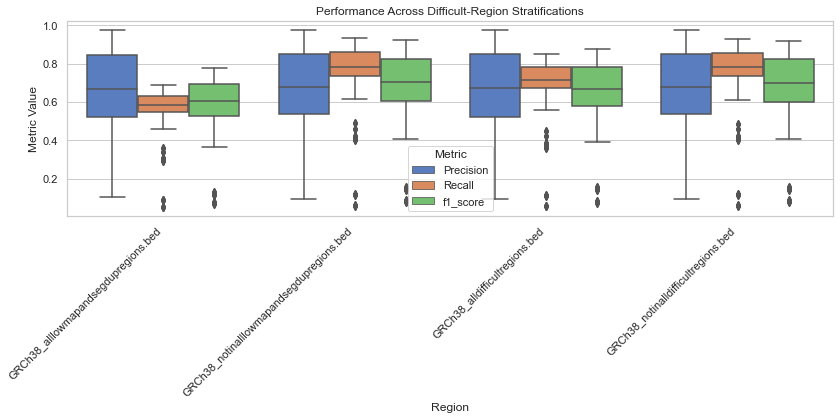

In [122]:
import os
import pandas as pd
import numpy as np
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

# --- Helper functions (use exactly your implementations) ---
def filter_vcf_with_bed_single_chrom(
    vcf_df: pd.DataFrame,
    bed_df: pd.DataFrame,
    invert_stringency: bool,
    chrom=None,
    vcf_chrom_col_name="#CHROM",
    bed_chrom_col_name="chrom",
) -> pd.DataFrame:
    if chrom:
        temp_vcf_df = vcf_df[vcf_df[vcf_chrom_col_name] == chrom]
        temp_bed_df = bed_df[bed_df[bed_chrom_col_name] == chrom]
    else:
        temp_vcf_df = vcf_df.copy()
        temp_bed_df = bed_df.copy()

    mask = np.zeros(len(temp_vcf_df), dtype=bool)
    sorted_vcf_df = temp_vcf_df.sort_values(by=["POS"]).reset_index(drop=True)
    sorted_bed_df = temp_bed_df.sort_values(by=["start", "end"]).reset_index(drop=True)

    vi, ri = 0, 0
    while vi < len(sorted_vcf_df) and ri < len(sorted_bed_df):
        pos = sorted_vcf_df.at[vi, "POS"]
        start = sorted_bed_df.at[ri, "start"]
        end = sorted_bed_df.at[ri, "end"]
        if pos < start:
            vi += 1
        elif start <= pos < end:
            mask[vi] = True
            vi += 1
        else:
            ri += 1

    final_mask = ~mask if invert_stringency else mask
    return sorted_vcf_df[final_mask]

def convert_to_vcf_df(variant_set):
    data = [v.split("_") for v in variant_set]
    df = pd.DataFrame(data, columns=["#CHROM","POS","REF","ALT"])
    df["POS"] = df["POS"].astype(int)
    return df

def convert_to_variant_set(vcf_df):
    return set(
        vcf_df.apply(lambda r: f"{r['#CHROM']}_{r['POS']}_{r['REF']}_{r['ALT']}", axis=1)
    )

def get_bed_file_names(directory):
    return [
        os.path.join(directory, f)
        for f in os.listdir(directory)
        if f.endswith(".bed")
    ]

def merge_intervals(intervals):
    merged = []
    for s, e in sorted(intervals):
        if not merged or s > merged[-1][1]:
            merged.append([s, e])
        else:
            merged[-1][1] = max(merged[-1][1], e)
    return merged

def calculate_unique_region_size(bed_df):
    chrom_intervals = {}
    for _, r in bed_df.iterrows():
        chrom_intervals.setdefault(r["chrom"], []).append((int(r["start"]), int(r["end"])))
    total = 0
    for ivs in chrom_intervals.values():
        for s, e in merge_intervals(ivs):
            total += e - s
    return total

# These functions and data must already exist:
# intersection_over_union, get_precision, get_recall, get_f1score, high_confidence, sets_dict

# --- 1) Directories ---
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# --- 2) Cache filename ---
union_csv = os.path.join(save_path, "union_metrics.csv")

# --- 3) Load or compute metrics ---
if os.path.exists(union_csv) and os.path.getsize(union_csv) > 0:
    union_metrics = pd.read_csv(union_csv)
    print("🎉 Loaded union_metrics from cache.")
else:
    # 3a) Gather BED files
    bed_dir = "vcf/genome_stratifications"
    bed_files = get_bed_file_names(bed_dir)

    # 3b) Compute genome size from 'alldifficultregions' and its complement
    all_bed = pd.read_csv(
        next(p for p in bed_files if "alldifficultregions.bed" in p),
        sep="\t", header=None, names=["chrom","start","end"]
    )
    not_all_bed = pd.read_csv(
        next(p for p in bed_files if "notinalldifficultregions.bed" in p),
        sep="\t", header=None, names=["chrom","start","end"]
    )
    size_all = calculate_unique_region_size(all_bed)
    size_not = calculate_unique_region_size(not_all_bed)
    genome_bp = size_all + size_not

    # 3c) Print region percentages
    print("Region coverage (% of genome):")
    for bf in bed_files:
        bd = pd.read_csv(bf, sep="\t", header=None, names=["chrom","start","end"])
        pct = calculate_unique_region_size(bd) / genome_bp * 100
        print(f" - {os.path.basename(bf)}: {pct:.1f}%")

    # 3d) Compute union_metrics
    union_metrics = pd.DataFrame(columns=[
        "TestCase","Region","Inter/Union","Precision","Recall","f1_score"
    ])
    for bf in tqdm(bed_files, desc="Regions"):
        bed_df = pd.read_csv(bf, sep="\t", header=None, names=["chrom","start","end"])
        region_name = os.path.basename(bf)
        for key, vset in tqdm(sets_dict.items(), desc=region_name, leave=False):
            vcf_df = convert_to_vcf_df(vset)
            filtered = filter_vcf_with_bed_single_chrom(vcf_df, bed_df, invert_stringency=False)
            fset = convert_to_variant_set(filtered)
            iou = intersection_over_union(fset, high_confidence)
            prec = get_precision(fset, high_confidence)
            rec  = get_recall(fset, high_confidence)
            f1   = get_f1score(fset, high_confidence)
            union_metrics.loc[len(union_metrics)] = [
                key, region_name, iou, prec, rec, f1
            ]

    union_metrics.to_csv(union_csv, index=False)
    print(f"✅ Computed and cached union_metrics to {union_csv}")

# --- 4) Summarize and plot ---
print(union_metrics.head())

melted = pd.melt(
    union_metrics,
    id_vars=["Region","TestCase"],
    value_vars=["Precision","Recall","f1_score"],
    var_name="Metric", value_name="Value"
)

sns.set(style="whitegrid")
plt.figure(figsize=(12,6))
ax = sns.boxplot(
    x="Region", y="Value", hue="Metric",
    data=melted, palette="muted"
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.ylabel("Metric Value")
plt.title("Performance Across Difficult-Region Stratifications")
plt.tight_layout()

# 5) Save figures
png_file = os.path.join(fig_path, "difficult_region_metrics.png")
pdf_file = os.path.join(fig_path, "difficult_region_metrics.pdf")
plt.savefig(png_file, dpi=300, bbox_inches="tight")
plt.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")

plt.show()


Computing findings: 100%|██████████| 480/480 [00:02<00:00, 186.94it/s]


Appended findings and updated dfs/union_metrics.csv
Saved PNG to Önemli Figureler/difficult_region_metrics_with_findings.png
Saved PDF to Önemli Figureler/difficult_region_metrics_with_findings.pdf


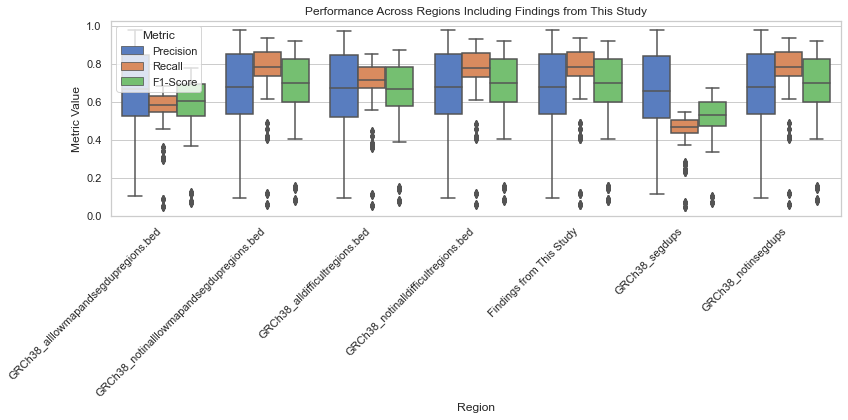

In [45]:
import os
import pandas as pd
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

# --- 1) Directories ---
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# --- 2) Load existing union metrics ---
union_csv = os.path.join(save_path, "union_metrics.csv")
union_metrics = pd.read_csv(union_csv)

# --- 3) Load supporting data ---
# 3a) sets_dict from cache
sets_df = pd.read_csv(os.path.join(save_path, "sets_dict.csv"))
sets_dict = sets_df.groupby("Key")["Identifier"].apply(set).to_dict()

# 3b) vcfcomparison_df_full for mapping TestCaseNo → key
vcf_full_csv = os.path.join(save_path, "vcfcomparison_df_full.csv")
vcfcomparison_df_full = pd.read_csv(vcf_full_csv)

# high_confidence, intersection_over_union, get_precision, get_recall, get_f1score
# must already be defined in the environment

# --- 4) Compute “Findings from This Study” metrics ---
df_findings = pd.DataFrame(columns=[
    "TestCase", "Region", "Inter/Union", "Precision", "Recall", "f1_score"
])

for key, variant_set in tqdm(sets_dict.items(), desc="Computing findings"):
    # match the row in vcfcomparison_df_full to confirm the key is present
    # TestCaseNo looks like "TestCase 123", so split and compare
    mask = vcfcomparison_df_full["TestCaseNo"].str.split().str[1] == str(key)
    if not mask.any():
        continue
    region_label = "Findings from This Study"
    iou  = intersection_over_union(variant_set, high_confidence)
    prec = get_precision(variant_set, high_confidence)
    rec  = get_recall(variant_set, high_confidence)
    f1   = get_f1score(variant_set, high_confidence)
    df_findings.loc[len(df_findings)] = [
        key, region_label, iou, prec, rec, f1
    ]

# --- 5) Append and save ---
union_metrics = pd.concat([union_metrics, df_findings], ignore_index=True)
union_metrics.to_csv(union_csv, index=False)
print(f"Appended findings and updated {union_csv}")

# --- 6) Plot updated metrics ---
melted = pd.melt(
    union_metrics,
    id_vars=["Region", "TestCase"],
    value_vars=["Precision", "Recall", "f1_score"],
    var_name="Metric",
    value_name="Value"
)

# Optional: rename f1_score to "F1-Score" for clarity
melted["Metric"] = melted["Metric"].replace({"f1_score": "F1-Score"})

sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
ax = sns.boxplot(
    x="Region",
    y="Value",
    hue="Metric",
    data=melted,
    palette="muted"
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.ylabel("Metric Value")
plt.title("Performance Across Regions Including Findings from This Study")
plt.tight_layout()

# --- 7) Save figure ---
png_file = os.path.join(fig_path, "difficult_region_metrics_with_findings.png")
pdf_file = os.path.join(fig_path, "difficult_region_metrics_with_findings.pdf")
plt.savefig(png_file, dpi=300, bbox_inches="tight")
plt.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")

plt.show()


In [5]:
import os
import pandas as pd
import numpy as np
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

# --- Helper functions (as defined previously) ---
def merge_intervals(intervals):
    merged = []
    for s, e in sorted(intervals):
        if not merged or s > merged[-1][1]:
            merged.append([s, e])
        else:
            merged[-1][1] = max(merged[-1][1], e)
    return merged

def calculate_unique_region_size(bed_df):
    chrom_intervals = {}
    for _, r in bed_df.iterrows():
        chrom_intervals.setdefault(r["chrom"], []).append((int(r["start"]), int(r["end"])))
    total = 0
    for ivs in chrom_intervals.values():
        for s, e in merge_intervals(ivs):
            total += e - s
    return total

def get_bed_file_names(directory):
    return [
        os.path.join(directory, f)
        for f in os.listdir(directory)
        if f.endswith(".bed")
    ]

def clean_bed_name(name):
    key = name.lower().replace('.bed','').replace('grch38_','')
    special = {
        "segdups":"Segmental Duplications",
        "notinsegdeups":"Not In Segmental Duplications",
        "alllowmapandsegdupregions": "All Low Map\nAnd Segdup Regions",
        "notinalllowmapandsegdupregions": "Not In All Low Map\nAnd Segdup Regions",
        "alldifficultregions": "All Difficult\nRegions",
        "notinalldifficultregions": "Not In All\nDifficult Regions",
        "findings from this study": "Findings from\nThis Study"
    }
    return special.get(key, key.replace('_',' ').title())

# (Other helper functions must be defined elsewhere:
# filter_vcf_with_bed_single_chrom, convert_to_vcf_df, convert_to_variant_set,
# intersection_over_union, get_precision, get_recall, get_f1score,
# and high_confidence.)

# --- 1) Directories ---
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)
print("✅ Directories ensured: dfs/ and Önemli Figureler/")

# --- 2) Load existing metrics and supporting data ---
union_csv = os.path.join(save_path, "union_metrics.csv")
union_metrics = pd.read_csv(union_csv)
print(f"✅ Loaded union metrics from {union_csv}")

sets_df = pd.read_csv(os.path.join(save_path, "sets_dict.csv"))
sets_dict = sets_df.groupby("Key")["Identifier"].apply(set).to_dict()
print(f"✅ Loaded sets_dict from {os.path.join(save_path, 'sets_dict.csv')}")

vcf_full_csv = os.path.join(save_path, "vcfcomparison_df_full.csv")
vcfcomparison_df_full = pd.read_csv(vcf_full_csv)
print(f"✅ Loaded full VCF comparison from {vcf_full_csv}")

# --- 3) Append “Findings from This Study” if needed ---
if "Findings from This Study" not in union_metrics["Region"].unique():
    print("🔎 Computing Findings from This Study metrics...")
    findings = []
    for key, variant_set in tqdm(sets_dict.items(), desc="Computing findings", unit="case"):
        if not (vcfcomparison_df_full["TestCaseNo"].str.split().str[1] == str(key)).any():
            continue
        iou  = intersection_over_union(variant_set, high_confidence)
        prec = get_precision(variant_set, high_confidence)
        rec  = get_recall(variant_set, high_confidence)
        f1   = get_f1score(variant_set, high_confidence)
        findings.append({
            "TestCase": key,
            "Region": "Findings from This Study",
            "Inter/Union": iou,
            "Precision": prec,
            "Recall": rec,
            "f1_score": f1
        })
    union_metrics = pd.concat([union_metrics, pd.DataFrame(findings)], ignore_index=True)
    union_metrics.to_csv(union_csv, index=False)
    print(f"✅ Appended findings to {union_csv}")

# --- 4) Compute region percentages with progress bar ---
print("🔎 Calculating region percentages...")
bed_dir = "vcf/genome_stratifications"
bed_paths = get_bed_file_names(bed_dir)

# determine genome size
all_bed = pd.read_csv(
    next(p for p in bed_paths if "alldifficultregions.bed" in p.lower()),
    sep="\t", header=None, names=["chrom","start","end"]
)
not_all_bed = pd.read_csv(
    next(p for p in bed_paths if "notinalldifficultregions.bed" in p.lower()),
    sep="\t", header=None, names=["chrom","start","end"]
)
genome_bp = calculate_unique_region_size(all_bed) + calculate_unique_region_size(not_all_bed)
print(genome_bp)

region_percentages = {}
for p in tqdm(bed_paths, desc="Region %", unit="region"):
    df_b = pd.read_csv(p, sep="\t", header=None, names=["chrom","start","end"])
    pct = calculate_unique_region_size(df_b) / genome_bp * 100
    label = clean_bed_name(os.path.basename(p))
    region_percentages[label] = pct
    print(f" - {label}: {pct:.1f}%")
region_percentages["Findings from\nThis Study"] = 100.0
print("✅ Completed region percentage calculation")

# --- 5) Plot updated metrics ---
print("🔎 Creating boxplot...")
melted = pd.melt(
    union_metrics,
    id_vars=["Region","TestCase"],
    value_vars=["Precision","Recall","f1_score"],
    var_name="Metric", value_name="Value"
)
melted["Metric"] = melted["Metric"].replace({"f1_score":"F1-Score"})

sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
ax = sns.boxplot(
    x="Region", y="Value", hue="Metric",
    data=melted, palette="muted"
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.ylabel("Metric Value")
plt.title("Performance Across Regions Including Findings from This Study")
plt.gcf().subplots_adjust(bottom=0.25)

# --- 6) Annotate percentages under plot ---
print("🔎 Annotating region percentages on plot...")
lines = [f"{name}: {pct:.1f}%" for name, pct in region_percentages.items()]
plt.gcf().text(
    0.01, 0.01, "\n".join(lines),
    ha="left", va="bottom", fontsize=8, family="monospace"
)

# --- 7) Save figure ---
print("🔎 Saving figure files...")
png_file = os.path.join(fig_path, "difficult_region_metrics_with_findings.png")
pdf_file = os.path.join(fig_path, "difficult_region_metrics_with_findings.pdf")
plt.savefig(png_file, dpi=300, bbox_inches="tight")
print(f"✅ Saved PNG to {png_file}")
plt.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"✅ Saved PDF to {pdf_file}")

plt.show()
print("🎉 All done!")


✅ Directories ensured: dfs/ and Önemli Figureler/
✅ Loaded union metrics from dfs/union_metrics.csv
✅ Loaded sets_dict from dfs/sets_dict.csv
✅ Loaded full VCF comparison from dfs/vcfcomparison_df_full.csv
🔎 Calculating region percentages...


KeyboardInterrupt: 

✅ Saved PNG to Önemli Figureler/stratification_metrics_ordered.png
✅ Saved PDF to Önemli Figureler/stratification_metrics_ordered.pdf


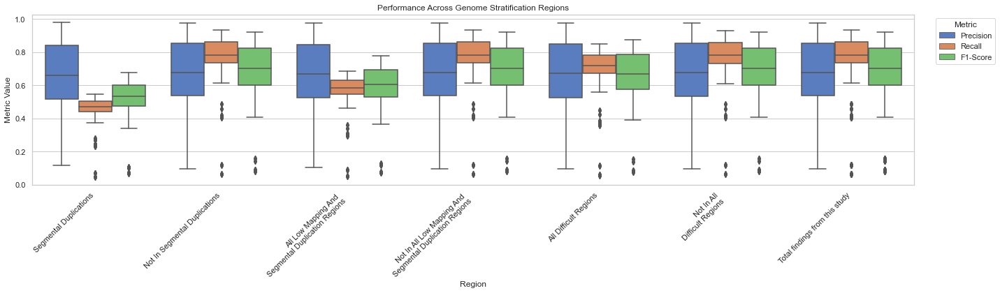

In [64]:
import os
import pandas as pd
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

# --- 1) Directories ---
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# --- 2) Load existing union metrics ---
union_csv = os.path.join(save_path, "union_metrics.csv")
union_metrics = pd.read_csv(union_csv)

# --- 3) Load supporting data ---
sets_df = pd.read_csv(os.path.join(save_path, "sets_dict.csv"))
sets_dict = sets_df.groupby("Key")["Identifier"].apply(set).to_dict()

vcf_full_csv = os.path.join(save_path, "vcfcomparison_df_full.csv")
vcfcomparison_df_full = pd.read_csv(vcf_full_csv)

# (Ensure the following are defined in your environment:
#   filter_vcf_with_bed_single_chrom, convert_to_vcf_df,
#   convert_to_variant_set, intersection_over_union,
#   get_precision, get_recall, get_f1score, high_confidence)



# --- 5) Clean bed names and enforce order ---
def clean_bed_name(name):
    key = name.lower().replace('.bed','').replace('grch38_','')
    special = {
        "segdups": "Segmental Duplications",
        "notinsegdups": "Not In Segmental Duplications",
        "alllowmapandsegdupregions": "All Low Mapping And \nSegmental Duplication Regions",
        "notinalllowmapandsegdupregions": "Not In All Low Mapping And \nSegmental Duplication Regions",
        "alldifficultregions": "All Difficult Regions",
        "notinalldifficultregions": "Not In All\nDifficult Regions",
        "findings from this study": "Total findings from this study"
    }
    return special.get(key, key.replace('_',' ').title())

order = [
    "segdups",
    "notinsegdups",
    "alllowmapandsegdupregions",
    "notinalllowmapandsegdupregions",
    "alldifficultregions",
    "notinalldifficultregions",
    "findings from this study"
]
# map raw Region to cleaned
union_metrics["RegionRaw"] = union_metrics["Region"]
union_metrics["Region"] = union_metrics["RegionRaw"].apply(clean_bed_name)
# set ordering
union_metrics["Region"] = pd.Categorical(
    union_metrics["Region"],
    categories=[clean_bed_name(o) for o in order],
    ordered=True
)

# --- 6) Melt and plot ---
melted = pd.melt(
    union_metrics,
    id_vars=["Region", "TestCase"],
    value_vars=["Precision", "Recall", "f1_score"],
    var_name="Metric",
    value_name="Value"
)
melted["Metric"] = melted["Metric"].replace({"f1_score": "F1-Score"})

sns.set(style="whitegrid")
plt.figure(figsize=(20,6))
ax = sns.boxplot(
    x="Region", y="Value", hue="Metric",
    data=melted, palette="muted"
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.ylabel("Metric Value")
plt.legend(title='Metric', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.title("Performance Across Genome Stratification Regions")
plt.tight_layout()

# --- 7) Save figure ---
png_file = os.path.join(fig_path, "stratification_metrics_ordered.png")
pdf_file = os.path.join(fig_path, "stratification_metrics_ordered.pdf")
plt.savefig(png_file, dpi=300, bbox_inches="tight")
plt.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"✅ Saved PNG to {png_file}")
print(f"✅ Saved PDF to {pdf_file}")

plt.show()


In [65]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# --- Helper functions ---
def merge_intervals(intervals):
    merged = []
    for s, e in sorted(intervals):
        if not merged or s > merged[-1][1]:
            merged.append([s, e])
        else:
            merged[-1][1] = max(merged[-1][1], e)
    return merged

def calculate_unique_region_size(bed_df):
    chrom_intervals = {}
    for _, r in bed_df.iterrows():
        chrom_intervals.setdefault(r["chrom"], []).append(
            (int(r["start"]), int(r["end"]))
        )
    total = 0
    for ivs in chrom_intervals.values():
        for s, e in merge_intervals(ivs):
            total += e - s
    return total

# --- 1) Paths & Directories ---
bed_dir    = "vcf/genome_stratifications"
exome_bed  = "vcf/sorted_exome_hc.bed"
fig_path   = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)


genome_bp = 2_934_880_412
print(f"Genome size: {genome_bp:,} bp")

# --- 3) Define regions and compute sizes & percentages ---
regions = {
    "segdups":            "GRCh38_segdups.bed",
    "notinsegdups":       "GRCh38_notinsegdups.bed",
    "alllowmap_segdup":   "GRCh38_alllowmapandsegdupregions.bed",
    "notinalllowmap":     "GRCh38_notinalllowmapandsegdupregions.bed",
    "alldifficult":       "GRCh38_alldifficultregions.bed",
    "notinalldifficult":  "GRCh38_notinalldifficultregions.bed",
    "findings":           exome_bed,
}

sizes = {}
percentages = {}
for key, fname in regions.items():
    if key == "findings":
        df_b = pd.read_csv(fname, sep="\t", header=None, names=["chrom","start","end"])
        size = calculate_unique_region_size(df_b)
        pct  = size / genome_bp * 100
    else:
        path = os.path.join(bed_dir, fname)
        df_b = pd.read_csv(path, sep="\t", header=None, names=["chrom","start","end"])
        size = calculate_unique_region_size(df_b)
        pct  = size / genome_bp * 100
    sizes[key] = size
    percentages[key] = pct
    print(f"{key}: {size:,} bp -> {pct:.1f}% of genome")

# --- 4) Prepare pie charts ---
labels_map = {
    "segdups":            "Segmental\nDuplications",
    "notinsegdups":       "Not In\nSegmental Duplications",
    "alllowmap_segdup":   "All Low Map &\nSegdup Regions",
    "notinalllowmap":     "Not In All Low Map &\nSegdup Regions",
    "alldifficult":       "All Difficult\nRegions",
    "notinalldifficult":  "Not In All\nDifficult Regions",
    "findings":           "Findings from\nThis Study"
}

# 2x2 layout: 
# [segdups pie, alllow pie]
# [difficult pie, findings pie]
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Pie 1: segdups vs notinsegdups
axs[0,0].pie(
    [percentages["segdups"], percentages["notinsegdups"]],
    labels=[labels_map["segdups"], labels_map["notinsegdups"]],
    autopct="%1.1f%%", startangle=90, textprops={"fontsize":10}
)
axs[0,0].set_title("Segmental Duplication Coverage")

# Pie 2: within segdups: alllowmap_segdup vs notinalllowmap
total_seg = sizes["segdups"]
pct_lowseg    = sizes["alllowmap_segdup"]   / total_seg * 100
pct_notlowseg = sizes["notinalllowmap"]     / total_seg * 100
axs[0,1].pie(
    [pct_lowseg, pct_notlowseg],
    labels=[labels_map["alllowmap_segdup"], labels_map["notinalllowmap"]],
    autopct="%1.1f%%", startangle=90, textprops={"fontsize":10}
)
axs[0,1].set_title("Within Segmental Duplication")

# Pie 3: alldifficult vs notinalldifficult
axs[1,0].pie(
    [percentages["alldifficult"], percentages["notinalldifficult"]],
    labels=[labels_map["alldifficult"], labels_map["notinalldifficult"]],
    autopct="%1.1f%%", startangle=90, textprops={"fontsize":10}
)
axs[1,0].set_title("Difficult Regions Coverage")

# Pie 4: findings vs rest of genome
axs[1,1].pie(
    [percentages["findings"], 100-percentages["findings"]],
    labels=[labels_map["findings"], "Other Genome"],
    autopct="%1.1f%%", startangle=90, textprops={"fontsize":10}
)
axs[1,1].set_title("Findings from This Study Coverage")

plt.tight_layout()

# --- 5) Save figure ---
png_file = os.path.join(fig_path, "nested_stratification_pies.png")
pdf_file = os.path.join(fig_path, "nested_stratification_pies.pdf")
plt.savefig(png_file, dpi=300, bbox_inches="tight")
plt.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"Saved pies to {png_file} and {pdf_file}")

plt.show()


Genome size: 2,934,880,412 bp
segdups: 166,860,344 bp -> 5.7% of genome
notinsegdups: 2,768,020,068 bp -> 94.3% of genome
alllowmap_segdup: 305,705,779 bp -> 10.4% of genome
notinalllowmap: 2,629,174,633 bp -> 89.6% of genome
alldifficult: 624,829,643 bp -> 21.3% of genome
notinalldifficult: 2,310,050,769 bp -> 78.7% of genome


ValueError: invalid literal for int() with base 10: '+'

Using static genome size: 2,934,880,412 bp
Saved PNG to Önemli Figureler/region_percentages_pies.png
Saved PDF to Önemli Figureler/region_percentages_pies.pdf


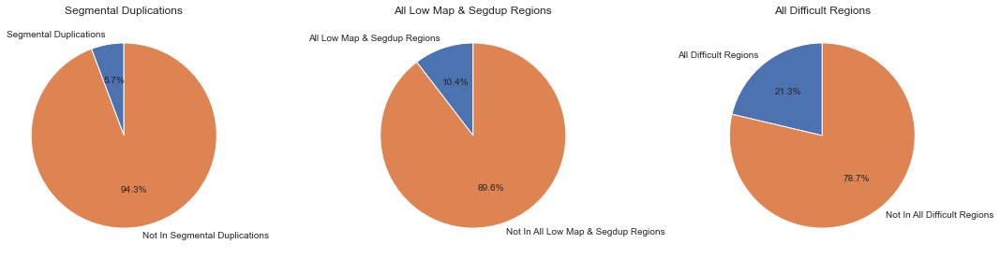

In [66]:
import os
import matplotlib.pyplot as plt

# --- 1) Static genome size and region percentages ---
genome_bp = 2_934_880_412
print(f"Using static genome size: {genome_bp:,} bp")

# Percentages of each region relative to the whole genome
percentages = {
    "Segmental Duplications":           5.7,
    "Not In Segmental Duplications":   94.3,
    "All Low Map & Segdup Regions":    10.4,
    "Not In All Low Map & Segdup Regions": 89.6,
    "All Difficult Regions":           21.3,
    "Not In All Difficult Regions":    78.7,
}

# --- 2) Ensure figure directory exists ---
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# --- 3) Plot pie charts for each pair ---
pairs = [
    ("Segmental Duplications", "Not In Segmental Duplications"),
    ("All Low Map & Segdup Regions", "Not In All Low Map & Segdup Regions"),
    ("All Difficult Regions", "Not In All Difficult Regions"),
]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, (pos_label, neg_label) in zip(axes, pairs):
    sizes = [percentages[pos_label], percentages[neg_label]]
    ax.pie(
        sizes,
        labels=[pos_label, neg_label],
        autopct="%1.1f%%",
        startangle=90,
        textprops={"fontsize": 10}
    )
    ax.set_title(pos_label, fontsize=12)

plt.tight_layout()

# --- 4) Save the figure ---
png_file = os.path.join(fig_path, "region_percentages_pies.png")
pdf_file = os.path.join(fig_path, "region_percentages_pies.pdf")
plt.savefig(png_file, dpi=300, bbox_inches="tight")
plt.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")

plt.show()


Using static genome size: 2,934,880,412 bp
Saved PNG to Önemli Figureler/region_percentages_pies_fullnames.png
Saved PDF to Önemli Figureler/region_percentages_pies_fullnames.pdf


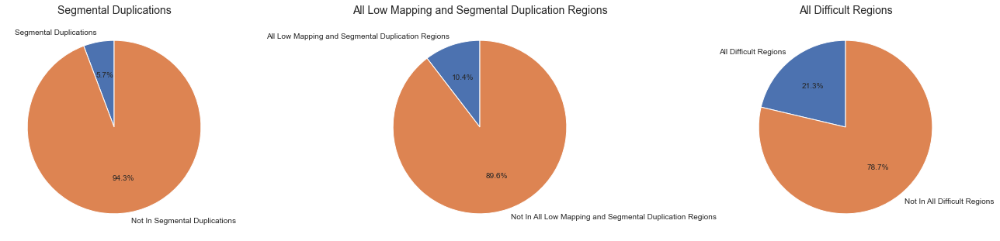

In [67]:
import os
import matplotlib.pyplot as plt

# --- 1) Static genome size and region percentages ---
genome_bp = 2_934_880_412
print(f"Using static genome size: {genome_bp:,} bp")

# Percentages for each region (full names, updated "Low Mapping")
percentages = {
    "Segmental Duplications":                                   5.7,
    "Not In Segmental Duplications":                          94.3,
    "All Low Mapping and Segmental Duplication Regions":      10.4,
    "Not In All Low Mapping and Segmental Duplication Regions":89.6,
    "All Difficult Regions":                                  21.3,
    "Not In All Difficult Regions":                           78.7,
}

# --- 2) Ensure figure directory exists ---
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# --- 3) Prepare pairs for pie charts ---
pairs = [
    ("Segmental Duplications", "Not In Segmental Duplications"),
    ("All Low Mapping and Segmental Duplication Regions", "Not In All Low Mapping and Segmental Duplication Regions"),
    ("All Difficult Regions", "Not In All Difficult Regions"),
]

# --- 4) Plot pie charts ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for ax, (primary, complement) in zip(axes, pairs):
    sizes = [percentages[primary], percentages[complement]]
    ax.pie(
        sizes,
        labels=[primary, complement],
        autopct="%1.1f%%",
        startangle=90,
        textprops={"fontsize": 10}
    )
    ax.set_title(primary, fontsize=14)

plt.tight_layout()

# --- 5) Save the figure ---
png_file = os.path.join(fig_path, "region_percentages_pies_fullnames.png")
pdf_file = os.path.join(fig_path, "region_percentages_pies_fullnames.pdf")
plt.savefig(png_file, dpi=300, bbox_inches="tight")
plt.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")

plt.show()


Saved PNG to Önemli Figureler/stratification_pies_full_labels.png
Saved PDF to Önemli Figureler/stratification_pies_full_labels.pdf


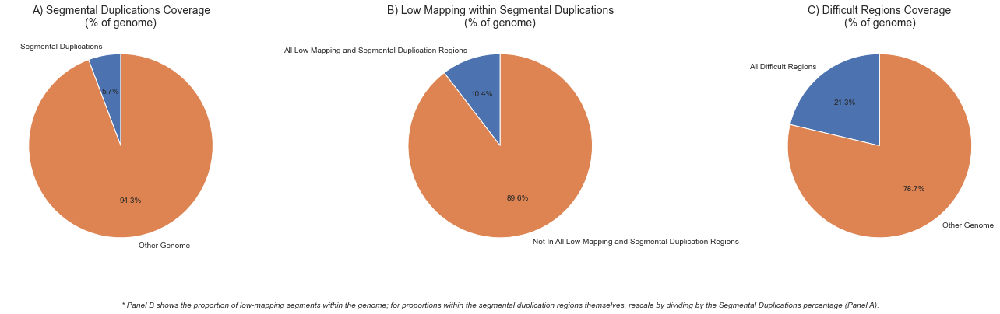

In [75]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# --- 1) Static genome size and region percentages ---
genome_bp = 2_934_880_412

# Percentages for each region (full names, no abbreviations)
percentages = {
    "Segmental Duplications":                                  5.7,
    "Not In Segmental Duplications":                         94.3,
    "All Low Mapping and Segmental Duplication Regions":     10.4,  # relative to genome
    "Not In All Low Mapping and Segmental Duplication Regions": 89.6,
    "All Difficult Regions":                                 21.3,
    "Not In All Difficult Regions":                          78.7,
}

# --- 2) Ensure figure directory exists ---
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# --- 3) Build subplots ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# A) Segmental duplications vs rest of genome
axes[0].pie(
    [percentages["Segmental Duplications"], percentages["Not In Segmental Duplications"]],
    labels=["Segmental Duplications", "Other Genome"],
    autopct="%1.1f%%",
    startangle=90,
    textprops={"fontsize": 10}
)
axes[0].set_title("A) Segmental Duplications Coverage\n(% of genome)", fontsize=14)

# B) Low mapping within segmental duplications
sizes = [
    percentages["All Low Mapping and Segmental Duplication Regions"],
    percentages["Not In All Low Mapping and Segmental Duplication Regions"]
]
# These percentages are expressed *relative to the genome*;
# if you want them relative *to the segmental duplication region* itself,
# you could rescale by dividing by 5.7%
axes[1].pie(
    sizes,
    labels=[
        "All Low Mapping and Segmental Duplication Regions",
        "Not In All Low Mapping and Segmental Duplication Regions"
    ],
    autopct="%1.1f%%",
    startangle=90,
    textprops={"fontsize": 10}
)
axes[1].set_title("B) Low Mapping within Segmental Duplications\n(% of genome)", fontsize=14)

# C) Difficult regions vs rest of genome
axes[2].pie(
    [percentages["All Difficult Regions"], percentages["Not In All Difficult Regions"]],
    labels=["All Difficult Regions", "Other Genome"],
    autopct="%1.1f%%",
    startangle=90,
    textprops={"fontsize": 10}
)
axes[2].set_title("C) Difficult Regions Coverage\n(% of genome)", fontsize=14)

plt.tight_layout(rect=[0, 0.05, 1, 1])

# --- 4) Academic footnote ---
fig.text(
    0.5, 0.02,
    ("* Panel B shows the proportion of low-mapping segments within the genome; "
     "for proportions within the segmental duplication regions themselves, "
     "rescale by dividing by the Segmental Duplications percentage (Panel A)."),
    ha="center", va="bottom", fontsize=10, style="italic"
)

# --- 5) Save figure ---
png_file = os.path.join(fig_path, "stratification_pies_full_labels.png")
pdf_file = os.path.join(fig_path, "stratification_pies_full_labels.pdf")
plt.savefig(png_file, dpi=300, bbox_inches="tight")
plt.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")

plt.show()


In [76]:
import os
import pandas as pd
import numpy as np
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

# --- Helper functions (must be defined elsewhere) ---
#   filter_vcf_with_bed_single_chrom, convert_to_vcf_df, convert_to_variant_set,
#   intersection_over_union, get_precision, get_recall, get_f1score,
#   merge_intervals, calculate_unique_region_size, get_bed_file_names,
#   clean_bed_name (as defined previously)

# --- 1) Ensure directories ---
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# --- 2) Load metrics and support data ---
union_csv = os.path.join(save_path, "union_metrics.csv")
union_metrics = pd.read_csv(union_csv)

sets_df = pd.read_csv(os.path.join(save_path, "sets_dict.csv"))
sets_dict = sets_df.groupby("Key")["Identifier"].apply(set).to_dict()

vcf_full_csv = os.path.join(save_path, "vcfcomparison_df_full.csv")
vcfcomparison_df_full = pd.read_csv(vcf_full_csv)

# --- 3) Compute genome_bp ---
bed_dir = "vcf/genome_stratifications"
all_bed = pd.read_csv(
    os.path.join(bed_dir, "GRCh38_alldifficultregions.bed"),
    sep="\t", header=None, names=["chrom","start","end"]
)
not_all_bed = pd.read_csv(
    os.path.join(bed_dir, "GRCh38_notinalldifficultregions.bed"),
    sep="\t", header=None, names=["chrom","start","end"]
)
genome_bp = calculate_unique_region_size(all_bed) + calculate_unique_region_size(not_all_bed)
print(f"Genome size (bp): {genome_bp:,}")

# --- 4) Prepare boxplot data (as before) ---
# ... assume union_metrics updated and Region cleaned & ordered ...

# Melt and plot boxplot
melted = pd.melt(
    union_metrics, id_vars=["Region","TestCase"],
    value_vars=["Precision","Recall","f1_score"],
    var_name="Metric", value_name="Value"
)
melted["Metric"] = melted["Metric"].replace({"f1_score":"F1-Score"})

sns.set(style="whitegrid")
plt.figure(figsize=(12,6))
ax = sns.boxplot(
    x="Region", y="Value", hue="Metric",
    data=melted, palette="muted"
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.ylabel("Metric Value")
plt.title("Performance Across Genome Stratification Regions")
plt.tight_layout()

# Save boxplot
plt.savefig(os.path.join(fig_path, "stratification_metrics_ordered.png"), dpi=300, bbox_inches="tight")
plt.savefig(os.path.join(fig_path, "stratification_metrics_ordered.pdf"), dpi=300, bbox_inches="tight")
plt.show()

# --- 5) Pie chart visualization of nested regions ---
regions = [
    "GRCh38_alllowmapandsegdupregions.bed",
    "GRCh38_segdups.bed",
    "GRCh38_alldifficultregions.bed",
    "GRCh38_notinalldifficultregions.bed"
]
labels = [clean_bed_name(r.replace(".bed","")) for r in regions]

# compute percentages
percentages = []
for r in regions:
    df_b = pd.read_csv(os.path.join(bed_dir, r), sep="\t", header=None, names=["chrom","start","end"])
    pct = calculate_unique_region_size(df_b) / genome_bp * 100
    percentages.append(pct)
    print(f"{labels[regions.index(r)]}: {pct:.1f}%")

# plot pies
fig, axs = plt.subplots(1, 4, figsize=(16,4))
for ax, lbl, pct in zip(axs, labels, percentages):
    comp = 100 - pct
    ax.pie(
        [pct, comp],
        labels=[lbl, "Other"],
        autopct="%1.1f%%",
        startangle=90,
        textprops={"fontsize": 8}
    )
    ax.set_title(lbl, fontsize=12)
plt.tight_layout()

# Save pie figure
pie_png = os.path.join(fig_path, "stratification_pies_nested.png")
pie_pdf = os.path.join(fig_path, "stratification_pies_nested.pdf")
plt.savefig(pie_png, dpi=300, bbox_inches="tight")
plt.savefig(pie_pdf, dpi=300, bbox_inches="tight")
print(f"Saved pie charts to {pie_png} and {pie_pdf}")

plt.show()


KeyboardInterrupt: 

In [43]:
import os
import pandas as pd
import numpy as np
from tqdm import tqdm

# --- 1) Paths & load existing data ---
save_path = "dfs/"
union_csv = os.path.join(save_path, "union_metrics.csv")
union_metrics = pd.read_csv(union_csv)

sets_df = pd.read_csv(os.path.join(save_path, "sets_dict.csv"))
sets_dict = sets_df.groupby("Key")["Identifier"].apply(set).to_dict()

# high_confidence, filter_vcf_with_bed_single_chrom, convert_to_vcf_df,
# convert_to_variant_set, intersection_over_union, get_precision,
# get_recall, get_f1score must already be defined in the environment.

# --- 2) New BED files to process ---
new_beds = ["GRCh38_segdups.bed", "GRCh38_notinsegdups.bed"]
bed_dir = "vcf/genome_stratifications"

# --- 3) Loop over each new bed file ---
for bed_name in new_beds:
    region_name = bed_name.replace(".bed", "")
    bed_path = os.path.join(bed_dir, bed_name)
    bed_df = pd.read_csv(bed_path, sep="\t", header=None, names=["chrom","start","end"])
    # progress bar per region
    for key, variant_set in tqdm(sets_dict.items(), desc=f"Processing {region_name}", unit="case"):
        vcf_df = convert_to_vcf_df(variant_set)
        filtered_df = filter_vcf_with_bed_single_chrom(vcf_df, bed_df, invert_stringency=False)
        filtered_set = convert_to_variant_set(filtered_df)
        # compute metrics
        iou   = intersection_over_union(filtered_set, high_confidence)
        prec  = get_precision(filtered_set, high_confidence)
        rec   = get_recall(filtered_set, high_confidence)
        f1    = get_f1score(filtered_set, high_confidence)
        # append to union_metrics
        union_metrics.loc[len(union_metrics)] = [
            key,
            region_name,
            iou,
            prec,
            rec,
            f1
        ]

# --- 4) Save updated union_metrics ---
union_metrics.to_csv(union_csv, index=False)
print(f"✅ Appended {new_beds} metrics to {union_csv}")


Processing GRCh38_notinsegdups: 100%|██████████| 480/480 [01:30<00:00,  5.29case/s]

✅ Appended ['GRCh38_segdups.bed', 'GRCh38_notinsegdups.bed'] metrics to dfs/union_metrics.csv


In [7]:
# --- Helper functions (as defined previously) ---
# --- Helper functions (use exactly your implementations) ---
def filter_vcf_with_bed_single_chrom(
    vcf_df: pd.DataFrame,
    bed_df: pd.DataFrame,
    invert_stringency: bool,
    chrom=None,
    vcf_chrom_col_name="#CHROM",
    bed_chrom_col_name="chrom",
) -> pd.DataFrame:
    if chrom:
        temp_vcf_df = vcf_df[vcf_df[vcf_chrom_col_name] == chrom]
        temp_bed_df = bed_df[bed_df[bed_chrom_col_name] == chrom]
    else:
        temp_vcf_df = vcf_df.copy()
        temp_bed_df = bed_df.copy()

    mask = np.zeros(len(temp_vcf_df), dtype=bool)
    sorted_vcf_df = temp_vcf_df.sort_values(by=["POS"]).reset_index(drop=True)
    sorted_bed_df = temp_bed_df.sort_values(by=["start", "end"]).reset_index(drop=True)

    vi, ri = 0, 0
    while vi < len(sorted_vcf_df) and ri < len(sorted_bed_df):
        pos = sorted_vcf_df.at[vi, "POS"]
        start = sorted_bed_df.at[ri, "start"]
        end = sorted_bed_df.at[ri, "end"]
        if pos < start:
            vi += 1
        elif start <= pos < end:
            mask[vi] = True
            vi += 1
        else:
            ri += 1

    final_mask = ~mask if invert_stringency else mask
    return sorted_vcf_df[final_mask]

def convert_to_vcf_df(variant_set):
    data = [v.split("_") for v in variant_set]
    df = pd.DataFrame(data, columns=["#CHROM","POS","REF","ALT"])
    df["POS"] = df["POS"].astype(int)
    return df

def convert_to_variant_set(vcf_df):
    return set(
        vcf_df.apply(lambda r: f"{r['#CHROM']}_{r['POS']}_{r['REF']}_{r['ALT']}", axis=1)
    )
def merge_intervals(intervals):
    merged = []
    for s, e in sorted(intervals):
        if not merged or s > merged[-1][1]:
            merged.append([s, e])
        else:
            merged[-1][1] = max(merged[-1][1], e)
    return merged

def calculate_unique_region_size(bed_df):
    chrom_intervals = {}
    for _, r in bed_df.iterrows():
        chrom_intervals.setdefault(r["chrom"], []).append((int(r["start"]), int(r["end"])))
    total = 0
    for ivs in chrom_intervals.values():
        for s, e in merge_intervals(ivs):
            total += e - s
    return total

def get_bed_file_names(directory):
    return [
        os.path.join(directory, f)
        for f in os.listdir(directory)
        if f.endswith(".bed")
    ]

def clean_bed_name(name):
    key = name.lower().replace('.bed','').replace('grch38_','')
    special = {
        "alllowmapandsegdupregions": "All Low Map\nAnd Segdup Regions",
        "notinalllowmapandsegdupregions": "Not In All Low Map\nAnd Segdup Regions",
        "alldifficultregions": "All Difficult\nRegions",
        "notinalldifficultregions": "Not In All\nDifficult Regions",
        "findings from this study": "Findings from\nThis Study"
    }
    return special.get(key, key.replace('_',' ').title())


In [44]:
import os
import pandas as pd
import numpy as np
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

# --- Helper functions (must be defined elsewhere) ---
# filter_vcf_with_bed_single_chrom, convert_to_vcf_df, convert_to_variant_set,
# intersection_over_union, get_precision, get_recall, get_f1score,
# merge_intervals, calculate_unique_region_size, get_bed_file_names

# --- 1) Ensure directories ---
save_path = "dfs/"
os.makedirs(save_path, exist_ok=True)
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)
print("✅ Directories ready")

# --- 2) Load union_metrics ---
union_csv = os.path.join(save_path, "union_metrics.csv")
union_metrics = pd.read_csv(union_csv)
print(f"✅ Loaded metrics from {union_csv}")

# --- 3) Compute genome_bp using only alldifficult + notinalldifficult ---
bed_dir = "vcf/genome_stratifications"
all_path     = os.path.join(bed_dir, "GRCh38_alldifficultregions.bed")
not_all_path = os.path.join(bed_dir, "GRCh38_notinalldifficultregions.bed")

all_bed     = pd.read_csv(all_path,     sep="\t", header=None, names=["chrom","start","end"])
not_all_bed = pd.read_csv(not_all_path, sep="\t", header=None, names=["chrom","start","end"])

size_all = calculate_unique_region_size(all_bed)
size_not = calculate_unique_region_size(not_all_bed)
genome_bp = size_all + size_not
print(f"✅ Computed genome size: {genome_bp:,} bp")

# --- 4) Calculate percentages for the two new beds ---
new_beds = ["GRCh38_segdups.bed", "GRCh38_notinsegdups.bed"]
region_percentages = {}

for bed_name in tqdm(new_beds, desc="Calc % for new beds"):
    path = os.path.join(bed_dir, bed_name)
    df_b = pd.read_csv(path, sep="\t", header=None, names=["chrom","start","end"])
    pct = calculate_unique_region_size(df_b) / genome_bp * 100
    label = bed_name.replace(".bed", "")
    region_percentages[label] = pct
    print(f" - {label}: {pct:.1f}%")

# --- 5) Prepare data for plotting (all bed-based regions) ---
# Exclude the "Findings from This Study" region if present
plot_df = union_metrics[union_metrics["Region"] != "Findings from This Study"].copy()

# --- 6) Melt for seaborn ---
melted = pd.melt(
    plot_df,
    id_vars=["Region", "TestCase"],
    value_vars=["Precision", "Recall", "f1_score"],
    var_name="Metric",
    value_name="Value"
)
melted["Metric"] = melted["Metric"].replace({"f1_score": "F1-Score"})

# --- 7) Plot ---
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
ax = sns.boxplot(
    x="Region", y="Value", hue="Metric",
    data=melted, palette="muted"
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.ylabel("Metric Value")
plt.title("Performance Across Genome Stratification Regions")
plt.gcf().subplots_adjust(bottom=0.25)

# --- 8) Annotate new-bed percentages ---
lines = [f"{name}: {pct:.1f}%" for name, pct in region_percentages.items()]
plt.gcf().text(
    0.01, 0.01, "\n".join(lines),
    ha="left", va="bottom", fontsize=8, family="monospace"
)

# --- 9) Save figure ---
png_file = os.path.join(fig_path, "stratification_metrics.png")
pdf_file = os.path.join(fig_path, "stratification_metrics.pdf")
plt.savefig(png_file, dpi=300, bbox_inches="tight")
plt.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"✅ Saved PNG to {png_file}")
print(f"✅ Saved PDF to {pdf_file}")

plt.show()


✅ Directories ready
✅ Loaded metrics from dfs/union_metrics.csv


KeyboardInterrupt: 

Saved PNG to Önemli Figureler/stratification_pies.png
Saved PDF to Önemli Figureler/stratification_pies.pdf


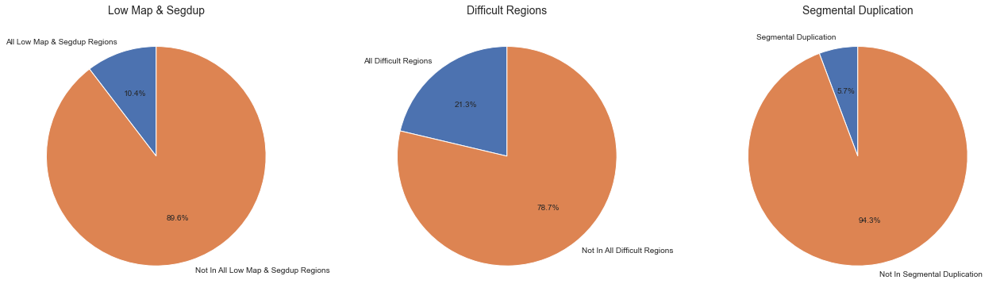

In [4]:

import os
import matplotlib.pyplot as plt

# --- 1) Ensure figure directory exists ---
fig_path = "Önemli Figureler/"
os.makedirs(fig_path, exist_ok=True)

# --- 2) Stratification percentages (in % of genome) ---
# these were calculated previously:
lowmap_segdup_pct    = 10.4   # All Low Map & Segdup Regions
not_lowmap_segdup_pct = 89.6   # Not In All Low Map & Segdup Regions

all_diff_pct         = 21.3   # All Difficult Regions
not_all_diff_pct      = 78.7   # Not In All Difficult Regions

# approximate new values for segmental duplication:
segdup_pct           = 5.7    # Segmental Duplication
not_segdup_pct        = 94.3   # Not In Segmental Duplication

# --- 3) Prepare labels and sizes for each pie ---
pie_data = [
    (
        ["All Low Map & Segdup Regions", "Not In All Low Map & Segdup Regions"],
        [lowmap_segdup_pct, not_lowmap_segdup_pct],
        "Low Map & Segdup"
    ),
    (
        ["All Difficult Regions", "Not In All Difficult Regions"],
        [all_diff_pct, not_all_diff_pct],
        "Difficult Regions"
    ),
    (
        ["Segmental Duplication", "Not In Segmental Duplication"],
        [segdup_pct, not_segdup_pct],
        "Segmental Duplication"
    ),
]

# --- 4) Plot side-by-side pies ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for ax, (labels, sizes, title) in zip(axes, pie_data):
    ax.pie(
        sizes,
        labels=labels,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 10}
    )
    ax.set_title(title, fontsize=14)

plt.tight_layout()

# --- 5) Save the figure ---
png_file = os.path.join(fig_path, "stratification_pies.png")
pdf_file = os.path.join(fig_path, "stratification_pies.pdf")
plt.savefig(png_file, dpi=300, bbox_inches="tight")
plt.savefig(pdf_file, dpi=300, bbox_inches="tight")
print(f"Saved PNG to {png_file}")
print(f"Saved PDF to {pdf_file}")

plt.show()


### vcfeval vcfdist hap.py 

In [73]:
import os
import shutil
import subprocess
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from subprocess import check_output
from itertools import product
from itertools import combinations
import os
import subprocess
import shutil
from tqdm import tqdm
import pandas as pd
from concurrent.futures import ThreadPoolExecutor, as_completed



In [74]:
reference_fasta = 'vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta'
reference_sdf = 'vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf'

In [75]:
RESULTS_COLUMNS = ['vcf1', 'vcf2', 'f_measure', 'precision', 'recall']
results_finito = pd.DataFrame(columns=RESULTS_COLUMNS)
os.environ["PATH"] += os.pathsep + "/path/to/rtg"  # Replace /path/to/rtg with the actual path


In [ ]:
# Caching for disease samples to avoid redundant calculations
disease_sample_cache = {}
vcfeval_result_cache = {}

# Execution mode flag (True for parallel, False for serial)
parallel = True  # Set to False for serial execution

# Filter vcfcomparison_df_full based on conditions
filtered_vcf_df = vcfcomparison_df_full[
    (vcfcomparison_df_full['VariantCaller'].str.lower() != 'strelka') &  # Exclude strelka
    (vcfcomparison_df_full['Sample'] == 'FD') &                         # Center is FD
    (vcfcomparison_df_full['Environment'] == 'Uhem + COSAP') &          # Environment is Uhem + COSAP
    (vcfcomparison_df_full['Duplicates'] == 'MARK')                     # Duplicates is MARK
]
filtered_vcf_df['TestCaseNo'] = filtered_vcf_df['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# Merge filtered TestCaseNo with vcf_filenames to extract file paths
filtered_vcf_filenames = {
    str(tc): vcf_filenames[str(tc)]
    for tc in filtered_vcf_df['TestCaseNo']
    if str(tc) in vcf_filenames
}

# Generate VCF pairs based on the filtered VCF files (limit to 120 comparisons)
vcf_pairs = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames.items(), repeat=2)
] # Limit to the first 120 pairs

def parse_summary_file(summary_file):
    """Parses the summary.txt file to extract performance metrics."""
    f_measure, precision, recall = None, None, None
    
    if not os.path.exists(summary_file):
        return None

    with open(summary_file, 'r') as f:
        lines = f.readlines()
        
        # Parse the summary file for metrics
        for line in lines:
            parts = line.strip().split()
            if len(parts) > 6 and parts[0] != 'Threshold' and parts[0] != '----------------------------------------------------------------------------------------------------':
                try:
                    # Extract the highest F-measure row (or None)
                    if parts[0] == 'None':
                        f_measure = float(parts[-1])
                        precision = float(parts[-3])
                        recall = float(parts[-2])
                except ValueError:
                    continue

    return {'f_measure': f_measure, 'precision': precision, 'recall': recall}

def _get_disease_sample_cached(vcf_path: str) -> str:
    if vcf_path in disease_sample_cache:
        return disease_sample_cache[vcf_path]

    process = subprocess.run(['/Users/P33833/miniconda3/bin/bcftools', 'query', '--list-samples', vcf_path + '.gz'],
                             check=True, stdout=subprocess.PIPE).stdout
    samples = process.decode().strip().split("\n")
    result = samples[-1] if samples else None
    disease_sample_cache[vcf_path] = result
    return result

def run_vcfeval_if_not_exists(vcf1, vcf2, output_dir, progress_bar=None):
    cache_key = (vcf1, vcf2)
    if cache_key in vcfeval_result_cache:
        return vcfeval_result_cache[cache_key]

    summary_file = os.path.join(output_dir, 'summary.txt')

    # If summary.txt already exists, parse and return the result
    if os.path.exists(summary_file):
        result = parse_summary_file(summary_file)
        return result

    # Run vcfeval if summary does not exist
    cmd = (
        f'rtg vcfeval '
        f'--template "{reference_sdf}" '
        f'--baseline "{vcf1}.gz" '
        f'--calls "{vcf2}.gz" '
        f'-o "{output_dir}" '
        f'--squash-ploidy '
        f'--sample ALT,{_get_disease_sample_cached(vcf2)}'
    )

    result = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    if result.returncode != 0:
        tqdm.write(f"Error running vcfeval: {result.stderr.decode()}")
        raise subprocess.CalledProcessError(result.returncode, cmd, output=result.stdout, stderr=result.stderr)
    
    # Parse the result after vcfeval completes
    parsed_result = parse_summary_file(summary_file)
    vcfeval_result_cache[cache_key] = parsed_result
    return parsed_result

output_base_dir = "vcf_evaluation_results"
os.makedirs(output_base_dir, exist_ok=True)

# Execution loop (for 120 pairs)
results_list = []
if parallel:
    with ThreadPoolExecutor(max_workers=(os.cpu_count() or 4) * 2) as executor:
        futures = {executor.submit(run_vcfeval_if_not_exists, vcf1, vcf2, os.path.join(output_base_dir, f"{key1}_vs_{key2}"), tqdm): (key1, key2)
                   for key1, vcf1, key2, vcf2 in vcf_pairs}
        
        progress_bar = tqdm(total=len(futures), desc="Comparing VCF files", ncols=100)
        for future in as_completed(futures):
            key1, key2 = futures[future]
            progress_bar.set_description(f"Comparing {key1} vs {key2}")
            result = future.result()
            if result:
                result.update({'vcf1': key1, 'vcf2': key2})
                results_list.append(result)
            progress_bar.update(1)
        progress_bar.close()
else:
    progress_bar = tqdm(vcf_pairs, desc="Comparing VCF files", ncols=100)
    for key1, vcf1, key2, vcf2 in progress_bar:
        progress_bar.set_description(f"Comparing {key1} vs {key2}")
        result = run_vcfeval_if_not_exists(vcf1, vcf2, os.path.join(output_base_dir, f"{key1}_vs_{key2}"), progress_bar)
        if result:
            result.update({'vcf1': key1, 'vcf2': key2})
            results_list.append(result)

results_finito = pd.DataFrame(results_list)

# Show the results DataFrame
print(results_finito)


/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Comparing 596 vs 623:  29%|███████████▌                            | 74/256 [00:00<00:03, 50.76it/s]

In [59]:
# Filter vcfcomparison_df_full based on conditions
filtered_vcf_df = vcfcomparison_df_full[
    (vcfcomparison_df_full['VariantCaller'].str.lower() != 'strelka') &  # Exclude strelka
    (vcfcomparison_df_full['Sample'] == 'FD') &                         # Center is FD
    (vcfcomparison_df_full['Environment'] == 'Uhem + COSAP') &          # Environment is Uhem + COSAP
    (vcfcomparison_df_full['Duplicates'] == 'MARK')                     # Duplicates is MARK
]

filtered_vcf_df['TestCaseNo'] = filtered_vcf_df['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

filtered_vcf_filenames = {
    str(tc): vcf_filenames[str(tc)]
    for tc in filtered_vcf_df['TestCaseNo']
    if str(tc) in vcf_filenames
}

# Generate VCF pairs based on the filtered VCF files
vcf_pairs = [(key1, vcf1, key2, vcf2)
             for (key1, vcf1), (key2, vcf2) in combinations(filtered_vcf_filenames.items(), 2)
             if key1 < key2]

# Limit to the first 400 pairs (adjust if needed)
vcf_pairs = vcf_pairs[:400]

/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [60]:
# Enrich results_finito with metadata from vcfcomparison_df_full
def enrich_results_with_metadata(results_df, comparison_df):
    # Ensure TestCaseNo is a string and remove "TestCase " prefix
    comparison_df['TestCaseNo'] = comparison_df['TestCaseNo'].astype(str).str.replace('TestCase ', '')

    # Select relevant columns for vcf1 and vcf2
    metadata_columns = ['TestCaseNo', 'Mapper', 'VariantCaller', 'Sample', 'isTrimmed', 'baseRecalibration']

    # Rename columns for merging vcf1 and vcf2 metadata separately
    vcf1_metadata = comparison_df[metadata_columns].rename(
        columns={col: f"vcf1_{col}" for col in metadata_columns}
    )
    vcf2_metadata = comparison_df[metadata_columns].rename(
        columns={col: f"vcf2_{col}" for col in metadata_columns}
    )

    # Merge vcf1 metadata
    enriched_df = results_df.merge(vcf1_metadata, left_on='vcf1', right_on='vcf1_TestCaseNo', how='left')
    
    # Merge vcf2 metadata
    enriched_df = enriched_df.merge(vcf2_metadata, left_on='vcf2', right_on='vcf2_TestCaseNo', how='left')

    # Drop unnecessary TestCaseNo columns from the merge
    enriched_df.drop(['vcf1_TestCaseNo', 'vcf2_TestCaseNo'], axis=1, inplace=True)

    return enriched_df

# Enrich results_finito with vcfcomparison_df_full data
results_finito2 = enrich_results_with_metadata(results_finito, vcfcomparison_df_full)

# Display the enriched DataFrame
print(results_finito2.head())


   f_measure  precision  recall vcf1 vcf2 vcf1_Mapper vcf1_VariantCaller vcf1_Sample vcf1_isTrimmed vcf1_baseRecalibration vcf2_Mapper vcf2_VariantCaller vcf2_Sample vcf2_isTrimmed vcf2_baseRecalibration
0     0.4371     0.2946  0.8469  584  600      BOWTIE             Mutect          FD            YES                    YES      BOWTIE      SomaticSniper          FD            YES                     NO
1     0.1997     0.6897  0.1167  587  612         BWA      SomaticSniper          FD            YES                    YES      BOWTIE      SomaticSniper          FD             NO                    YES
2     0.9102     0.9194  0.9012  587  611         BWA      SomaticSniper          FD            YES                    YES         BWA      SomaticSniper          FD             NO                    YES
3        NaN        NaN  0.0000  583  620         BWA             Mutect          FD            YES                    YES      BOWTIE             Mutect          FD             NO    

In [61]:
results_finito2

,f_measure,precision,recall,vcf1,vcf2,vcf1_Mapper,vcf1_VariantCaller,vcf1_Sample,vcf1_isTrimmed,vcf1_baseRecalibration,vcf2_Mapper,vcf2_VariantCaller,vcf2_Sample,vcf2_isTrimmed,vcf2_baseRecalibration
0,0.4371,0.2946,0.8469,584,600,BOWTIE,Mutect,FD,YES,YES,BOWTIE,SomaticSniper,FD,YES,NO
1,0.1997,0.6897,0.1167,587,612,BWA,SomaticSniper,FD,YES,YES,BOWTIE,SomaticSniper,FD,NO,YES
2,0.9102,0.9194,0.9012,587,611,BWA,SomaticSniper,FD,YES,YES,BWA,SomaticSniper,FD,NO,YES
3,NaN,NaN,0.0000,583,620,BWA,Mutect,FD,YES,YES,BOWTIE,Mutect,FD,NO,NO
4,0.4089,0.2956,0.6628,583,600,BWA,Mutect,FD,YES,YES,BOWTIE,SomaticSniper,FD,YES,NO
5,NaN,NaN,0.0000,583,584,BWA,Mutect,FD,YES,YES,BOWTIE,Mutect,FD,YES,YES
6,NaN,NaN,0.0000,584,608,BOWTIE,Mutect,FD,YES,YES,BOWTIE,Mutect,FD,NO,YES
7,NaN,NaN,0.0000,587,608,BWA,SomaticSniper,FD,YES,YES,BOWTIE,Mutect,FD,NO,YES
8,NaN,NaN,0.0000,583,596,BWA,Mutect,FD,YES,YES,BOWTIE,Mutect,FD,YES,NO
9,NaN,NaN,0.0000,587,607,BWA,SomaticSniper,FD,YES,YES,BWA,Mutect,FD,NO,YES


In [62]:
top_performers = results_finito2.sort_values(by='f_measure', ascending=False)
print(top_performers.head(10))  # Top 10 combinations


     f_measure  precision  recall vcf1 vcf2 vcf1_Mapper vcf1_VariantCaller vcf1_Sample vcf1_isTrimmed vcf1_baseRecalibration vcf2_Mapper vcf2_VariantCaller vcf2_Sample vcf2_isTrimmed vcf2_baseRecalibration
79      0.9324     0.9608  0.9057  599  623         BWA      SomaticSniper          FD            YES                     NO         BWA      SomaticSniper          FD             NO                     NO
2       0.9102     0.9194  0.9012  587  611         BWA      SomaticSniper          FD            YES                    YES         BWA      SomaticSniper          FD             NO                    YES
72      0.8648     0.9257  0.8115  599  600         BWA      SomaticSniper          FD            YES                     NO      BOWTIE      SomaticSniper          FD            YES                     NO
88      0.8291     0.8000  0.8603  600  623      BOWTIE      SomaticSniper          FD            YES                     NO         BWA      SomaticSniper          FD         

In [63]:
variant_caller_performance = results_finito2.groupby(
    ['vcf1_VariantCaller', 'vcf2_VariantCaller']
).agg({'f_measure': 'mean', 'precision': 'mean', 'recall': 'mean'}).reset_index()
print(variant_caller_performance)


  vcf1_VariantCaller vcf2_VariantCaller  f_measure  precision    recall
0             Mutect             Mutect        NaN        NaN  0.000000
1             Mutect      SomaticSniper   0.315372   0.256532  0.488575
2      SomaticSniper             Mutect        NaN        NaN  0.000000
3      SomaticSniper      SomaticSniper   0.530161   0.670607  0.568729


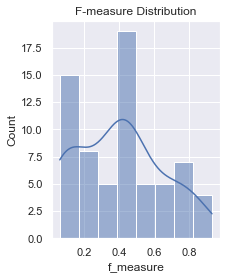

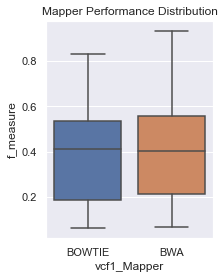

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(results_finito2['f_measure'], kde=True).set(title='F-measure Distribution')
plt.show()

sns.boxplot(x='vcf1_Mapper', y='f_measure', data=results_finito2).set(
    title='Mapper Performance Distribution'
)
plt.show()


In [65]:
best_combinations = results_finito2[
    (results_finito2['f_measure'] > 0.75) &
    (results_finito2['precision'] > 0.70)
]
print(best_combinations)


    f_measure  precision  recall vcf1 vcf2 vcf1_Mapper vcf1_VariantCaller vcf1_Sample vcf1_isTrimmed vcf1_baseRecalibration vcf2_Mapper vcf2_VariantCaller vcf2_Sample vcf2_isTrimmed vcf2_baseRecalibration
2      0.9102     0.9194  0.9012  587  611         BWA      SomaticSniper          FD            YES                    YES         BWA      SomaticSniper          FD             NO                    YES
28     0.8057     0.9106  0.7225  587  588         BWA      SomaticSniper          FD            YES                    YES      BOWTIE      SomaticSniper          FD            YES                    YES
62     0.7828     0.7082  0.8749  588  611      BOWTIE      SomaticSniper          FD            YES                    YES         BWA      SomaticSniper          FD             NO                    YES
72     0.8648     0.9257  0.8115  599  600         BWA      SomaticSniper          FD            YES                     NO      BOWTIE      SomaticSniper          FD            YE

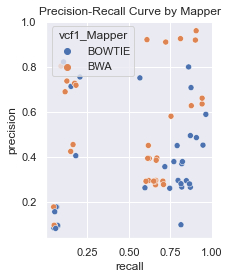

In [66]:
# Hypothetical ROC Plotting
sns.scatterplot(x='recall', y='precision', hue='vcf1_Mapper', data=results_finito2)
plt.title('Precision-Recall Curve by Mapper')
plt.show()


In [67]:
summary_stats = results_finito2.groupby('vcf1_VariantCaller').agg({'f_measure': 'mean'})
print(summary_stats)


                    f_measure
vcf1_VariantCaller           
Mutect               0.315372
SomaticSniper        0.530161


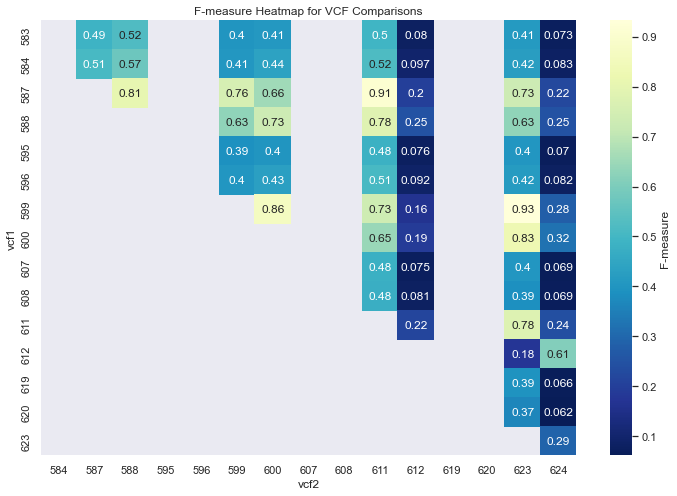

In [68]:
pivot_f = results_finito2.pivot('vcf1', 'vcf2', 'f_measure')
pivot_p = results_finito2.pivot('vcf1', 'vcf2', 'precision')
pivot_r = results_finito2.pivot('vcf1', 'vcf2', 'recall')

plt.figure(figsize=(12, 8))
sns.heatmap(pivot_f, annot=True, cmap='YlGnBu_r', cbar_kws={'label': 'F-measure'})
plt.title('F-measure Heatmap for VCF Comparisons')
plt.show()


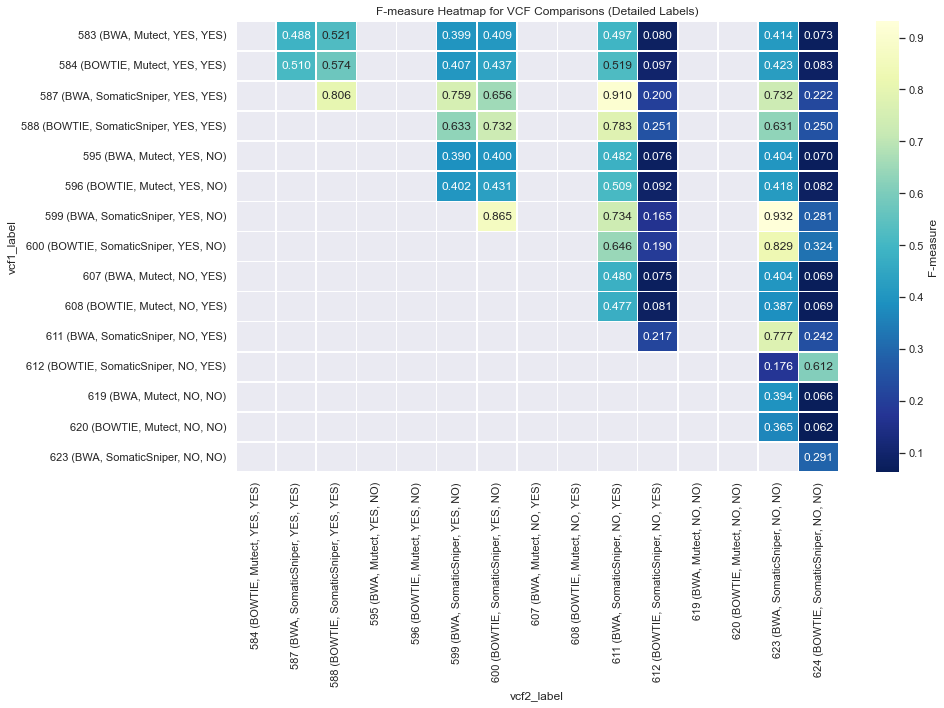

In [69]:
# Generate detailed labels for each VCF pair
results_finito2['vcf1_label'] = (
    results_finito2['vcf1'].astype(str) +
    " (" + results_finito2['vcf1_Mapper'] + ", " +
    results_finito2['vcf1_VariantCaller'] + ", " +
    "" + results_finito2['vcf1_isTrimmed'] + ", " +
    "" + results_finito2['vcf1_baseRecalibration'] + ")"
)

results_finito2['vcf2_label'] = (
    results_finito2['vcf2'].astype(str) +
    " (" + results_finito2['vcf2_Mapper'] + ", " +
    results_finito2['vcf2_VariantCaller'] + ", " +
    "" + results_finito2['vcf2_isTrimmed'] + ", " +
    "" + results_finito2['vcf2_baseRecalibration'] + ")"
)

# Create pivot tables for heatmap
pivot_f = results_finito2.pivot('vcf1_label', 'vcf2_label', 'f_measure')
pivot_p = results_finito2.pivot('vcf1_label', 'vcf2_label', 'precision')
pivot_r = results_finito2.pivot('vcf1_label', 'vcf2_label', 'recall')

# Plot F-measure heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(pivot_f, annot=True, cmap='YlGnBu_r', fmt=".3f", linewidths=0.5, cbar_kws={'label': 'F-measure'})
plt.title('F-measure Heatmap for VCF Comparisons (Detailed Labels)')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


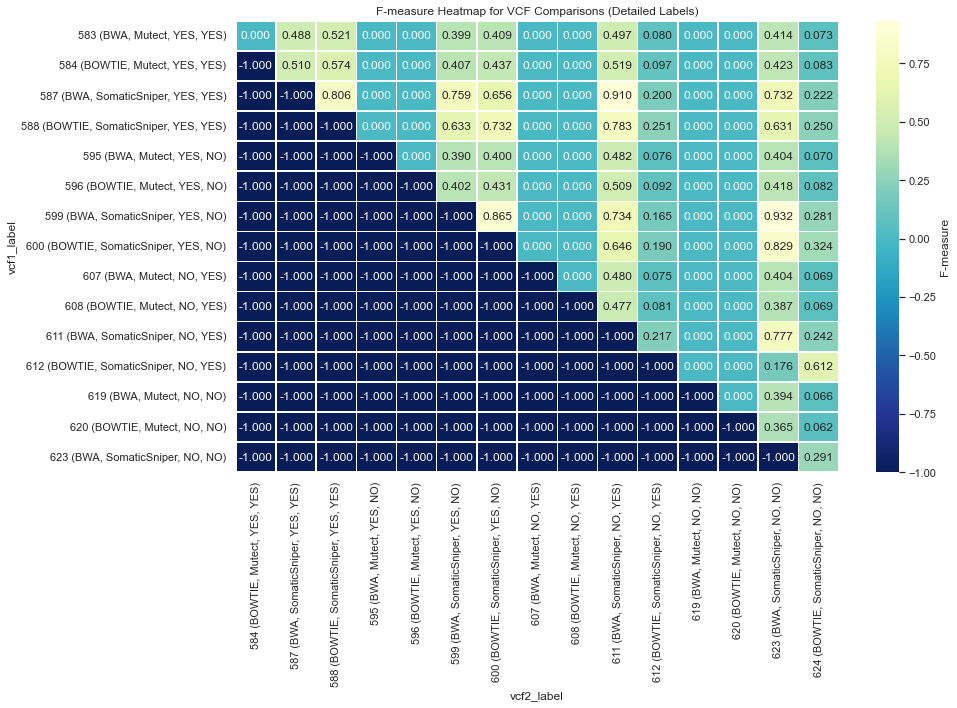

In [70]:
# Replace NaN values in f_measure, precision, and recall
results_finito2['f_measure'].fillna(0.0, inplace=True)  # Failed comparisons
results_finito2['precision'].fillna(0.0, inplace=True)
results_finito2['recall'].fillna(0.0, inplace=True)

# If no comparison was made (entire row missing), set to -1
pivot_f = results_finito2.pivot('vcf1_label', 'vcf2_label', 'f_measure').fillna(-1)
pivot_p = results_finito2.pivot('vcf1_label', 'vcf2_label', 'precision').fillna(-1)
pivot_r = results_finito2.pivot('vcf1_label', 'vcf2_label', 'recall').fillna(-1)

# Plot F-measure heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(pivot_f, annot=True, cmap='YlGnBu_r', fmt=".3f", linewidths=0.5, cbar_kws={'label': 'F-measure'})
plt.title('F-measure Heatmap for VCF Comparisons (Detailed Labels)')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Plot Precision heatmap
#plt.figure(figsize=(14, 10))
#sns.heatmap(pivot_p, annot=True, cmap='Blues', fmt=".3f", linewidths=0.5, cbar_kws={'label': 'Precision'})
#plt.title('Precision Heatmap for VCF Comparisons (Detailed Labels)')
#plt.xticks(rotation=90)
#plt.yticks(rotation=0)
#plt.tight_layout()
#plt.show()
#
## Plot Recall heatmap
#plt.figure(figsize=(14, 10))
#sns.heatmap(pivot_r, annot=True, cmap='OrRd', fmt=".3f", linewidths=0.5, cbar_kws={'label': 'Recall'})
#plt.title('Recall Heatmap for VCF Comparisons (Detailed Labels)')
#plt.xticks(rotation=90)
#plt.yticks(rotation=0)
#plt.tight_layout()
#plt.show()


In [130]:
def bgzip_and_index(vcf_path):
    if not os.path.exists(vcf_path + '.gz'):
        subprocess.run(f'bgzip -c "{vcf_path}" > "{vcf_path}.gz"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{vcf_path}.gz"', shell=True, check=True)

def extract_tumor_sample_name(vcf_path):
    with open(vcf_path, 'r') as f:
        for line in f:
            if line.startswith('#CHROM'):
                sample_names = line.strip().split('\t')[9:]
                return sample_names[0] if sample_names else None
    return None

def _get_disease_sample(vcf_path: str) -> str:
    process = subprocess.run(['/Users/P33833/miniconda3/bin/bcftools', 'query', '--list-samples', vcf_path + '.gz'],check=True, stdout=subprocess.PIPE).stdout
    samples = process.decode().strip().split("\n")
    disease_sample = samples[-1]
    return disease_sample

def run_vcfeval(vcf1, vcf2, output_dir):
    if os.path.exists(output_dir):
        shutil.rmtree(output_dir)
    
    bgzip_and_index(vcf1)
    bgzip_and_index(vcf2)
    
    cmd = (
        f'rtg vcfeval '
        f'--template "{reference_sdf}" '
        f'--baseline "{vcf1}.gz" '
        f'--calls "{vcf2}.gz" '
        f'-o "{output_dir}" '
        f'--squash-ploidy '
        f'--sample ALT,{_get_disease_sample(vcf2)}'
    )
    
    print(cmd)
    
    result = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    if result.returncode != 0:
        raise subprocess.CalledProcessError(result.returncode, cmd, output=result.stdout, stderr=result.stderr)

def parse_vcfeval_results(output_dir):
    summary_file = os.path.join(output_dir, 'summary.txt')
    if not os.path.exists(summary_file):
        return None, None, None

    f_measure, precision, recall = None, None, None
    with open(summary_file) as f:
        for line in f:
            if line.startswith("F-measure"):
                f_measure = float(line.strip().split()[-1])
            elif line.startswith("Precision"):
                precision = float(line.strip().split()[-1])
            elif line.startswith("Recall"):
                recall = float(line.strip().split()[-1])
    return f_measure, precision, recall

output_base_dir = "vcf_evaluation_results"
os.makedirs(output_base_dir, exist_ok=True)

total_comparisons = len(vcf_filenames) * (len(vcf_filenames) - 1) // 2
progress_bar = tqdm(total=total_comparisons, desc="Comparing VCF files")

if not os.path.exists(reference_sdf):
    subprocess.run(f'rtg format -o "{reference_sdf}" "{reference_fasta}"', shell=True, check=True)

for key1, vcf1 in vcf_filenames.items():
    for key2, vcf2 in vcf_filenames.items():
        if key1 != key2 and (key2, key1) not in results_finito[['vcf1', 'vcf2']].values:
            output_dir = os.path.join(output_base_dir, f"{key1}_vs_{key2}")
            os.makedirs(output_dir, exist_ok=True)
            try:
                run_vcfeval(vcf1, vcf2, output_dir)
                f_measure, precision, recall = parse_vcfeval_results(output_dir)
                if f_measure and precision and recall:
                    results_finito = results_finito.append({'vcf1': key1, 'vcf2': key2, 'f_measure': f_measure, 'precision': precision, 'recall': recall}, ignore_index=True)
            except subprocess.CalledProcessError as e:
                print(f"Error running vcfeval for {vcf1} vs {vcf2}: {e}")
            progress_bar.update(1)

progress_bar.close()

# Visualize Results as Histograms
sns.distplot(results_finito['f_measure'], kde=True).set(title='Distribution of F-measure', xlabel='F-measure', ylabel='Frequency')
plt.show()

sns.distplot(results_finito['precision'], kde=True).set(title='Distribution of Precision', xlabel='Precision', ylabel='Frequency')
plt.show()

sns.distplot(results_finito['recall'], kde=True).set(title='Distribution of Recall', xlabel='Recall', ylabel='Frequency')
plt.show()










Comparing VCF files:   0%|          | 0/114960 [00:00<?, ?it/s]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 606/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_606" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 1/114960 [00:11<376:30:44, 11.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_262" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 2/114960 [00:24<383:52:23, 12.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 853/snp_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_853" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 3/114960 [00:37<390:29:28, 12.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 639/snp_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_639" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 4/114960 [00:51<414:58:42, 13.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 601/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_601" --squash-ploidy --sample ALT,SRR7890880










Comparing VCF files:   0%|          | 5/114960 [01:04<407:41:52, 12.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 854/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_854" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 6/114960 [01:17<413:10:04, 12.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 637/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_637" --squash-ploidy --sample ALT,SRR7890880










Comparing VCF files:   0%|          | 7/114960 [01:35<464:42:47, 14.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 862/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_862" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 8/114960 [01:47<439:32:32, 13.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_608" --squash-ploidy --sample ALT,SRR7890880










Comparing VCF files:   0%|          | 9/114960 [02:04<466:44:57, 14.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 630/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_630" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 10/114960 [02:17<449:38:55, 14.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 831/snp_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_831" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 11/114960 [02:29<429:29:57, 13.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 456/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_456" --squash-ploidy --sample ALT,SRR7890845










Comparing VCF files:   0%|          | 12/114960 [02:41<417:43:33, 13.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 664/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_664" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 13/114960 [02:53<411:54:07, 12.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 238/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_238" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 14/114960 [03:07<417:53:55, 13.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 836/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_836" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 15/114960 [03:18<400:40:54, 12.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 663/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_663" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 16/114960 [03:31<407:10:01, 12.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 809/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_809" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 17/114960 [03:43<399:24:10, 12.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 207/snp_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_207" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 18/114960 [03:57<407:42:12, 12.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 800/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_800" --squash-ploidy --sample ALT,SRR7890883










Comparing VCF files:   0%|          | 19/114960 [04:07<387:07:23, 12.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 231/snp_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_231" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 20/114960 [04:22<412:05:23, 12.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 655/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_655" --squash-ploidy --sample ALT,SRR7890880










Comparing VCF files:   0%|          | 21/114960 [04:33<393:21:39, 12.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 467/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_467" --squash-ploidy --sample ALT,SRR7890851










Comparing VCF files:   0%|          | 22/114960 [04:34<284:59:22,  8.93s/it]

Error running vcfeval for vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded/TestCase 467/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf: Command 'rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 467/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_467" --squash-ploidy --sample ALT,SRR7890851' returned non-zero exit status 1.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TEST









Comparing VCF files:   0%|          | 23/114960 [04:46<317:13:46,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 209/snp_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_209" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 24/114960 [05:02<372:59:38, 11.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 460/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_460" --squash-ploidy --sample ALT,SRR7890919










Comparing VCF files:   0%|          | 25/114960 [05:15<381:40:25, 11.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 652/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_652" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 26/114960 [05:26<377:44:28, 11.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 838/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_838" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 27/114960 [05:37<366:31:31, 11.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_255" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 28/114960 [05:48<362:03:26, 11.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 631/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_631" --squash-ploidy --sample ALT,SRR7890880










Comparing VCF files:   0%|          | 29/114960 [06:00<365:56:52, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 864/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_864" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 30/114960 [06:11<364:10:03, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 636/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_636" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 31/114960 [06:22<365:15:40, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 404/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_404" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 32/114960 [06:34<366:11:12, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_252" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 33/114960 [06:47<385:18:34, 12.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 863/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_863" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 34/114960 [07:01<402:15:48, 12.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 609/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_609" --squash-ploidy --sample ALT,TUMOR










Comparing VCF files:   0%|          | 35/114960 [07:14<403:05:10, 12.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 290/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_290" --squash-ploidy --sample ALT,SRR7890919










Comparing VCF files:   0%|          | 36/114960 [07:26<397:58:51, 12.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results/296_vs_264" --squash-ploidy --sample ALT,TUMOR


KeyboardInterrupt: 

In [102]:
results_finito

,vcf1,vcf2,f_measure,precision,recall


In [ ]:
f_measure

In [ ]:
import subprocess

# Define the command with properly quoted file paths
command = (
    'rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" '
    '--baseline "vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" '
    '--calls "vcf/TESTCASES_bedded/TestCase 606/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" '
    '-o "vcf_evaluation_results/296_vs_606" --squash-ploidy --sample ALT,TUMOR'
)

try:
    # Execute the command and store the output
    output = subprocess.check_output(command, shell=True, stderr=subprocess.STDOUT)
    print(output.decode("utf-8"))  # Decode and print the output
except subprocess.CalledProcessError as e:
    # Print the error message and the output
    print(f"Command failed with return code {e.returncode}")
    print(e.output.decode("utf-8"))


In [ ]:
import os
import shutil
import subprocess
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

# Add the path to hap.py and any required tools to the system PATH
os.environ["PATH"] += os.pathsep + "/path/to/hap.py"  # Replace /path/to/hap.py with the actual path

def bgzip_and_index(vcf_path):
    """Bgzip and index the VCF file if not already done."""
    if not os.path.exists(vcf_path + '.gz'):
        # Bgzip the VCF file
        cmd_bgzip = f'bgzip -c "{vcf_path}" > "{vcf_path}.gz"'
        subprocess.run(cmd_bgzip, shell=True, check=True)
        # Index the VCF file
        cmd_tabix = f'tabix -p vcf "{vcf_path}.gz"'
        subprocess.run(cmd_tabix, shell=True, check=True)

def run_hap_py(vcf1, vcf2, output_dir):
    """Run hap.py for VCF comparison."""
    # Remove the output directory if it exists
    if os.path.exists(output_dir):
        shutil.rmtree(output_dir)
    
    # Bgzip and index the VCF files
    bgzip_and_index(vcf1)
    bgzip_and_index(vcf2)
    
    # Command for running hap.py
    cmd = (
        f'hap.py '
        f'"{vcf1}.gz" '
        f'"{vcf2}.gz" '
        f'-o "{output_dir}" '
        f'--engine=vcfeval'  # or use another comparison engine if preferred
    )
    
    print(f"Running command: {cmd}")  # Debug print
    result = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    if result.returncode != 0:
        print(f"Command failed with return code {result.returncode}")
        print(f"Standard output:\n{result.stdout.decode()}")
        print(f"Standard error:\n{result.stderr.decode()}")
        raise subprocess.CalledProcessError(result.returncode, cmd, output=result.stdout, stderr=result.stderr)

def parse_hap_py_results(output_dir):
    summary_file = os.path.join(output_dir, 'summary.csv')
    if not os.path.exists(summary_file):
        print(f"Summary file not found: {summary_file}")  # Debug print
        return None, None, None  # Return None if the file does not exist

    df = pd.read_csv(summary_file)
    f_measure = df.loc[df['Metric'] == 'F-measure', 'Value'].values[0]
    precision = df.loc[df['Metric'] == 'Precision', 'Value'].values[0]
    recall = df.loc[df['Metric'] == 'Recall', 'Value'].values[0]
    return f_measure, precision, recall

output_base_dir = "vcf_evaluation_results"
os.makedirs(output_base_dir, exist_ok=True)

# Initialize tqdm for progress tracking
total_comparisons = len(vcf_filenames) * (len(vcf_filenames) - 1) // 2
progress_bar = tqdm(total=total_comparisons, desc="Comparing VCF files")

for key1, vcf1 in vcf_filenames.items():
    for key2, vcf2 in vcf_filenames.items():
        if key1 != key2 and (key2, key1) not in results_finito[['vcf1', 'vcf2']].values:
            output_dir = os.path.join(output_base_dir, f"{key1}_vs_{key2}")
            os.makedirs(output_dir, exist_ok=True)
            try:
                run_hap_py(vcf1, vcf2, output_dir)
                f_measure, precision, recall = parse_hap_py_results(output_dir)
                if f_measure is not None and precision is not None and recall is not None:
                    results_finito = results_finito.append({'vcf1': key1, 'vcf2': key2, 'f_measure': f_measure, 'precision': precision, 'recall': recall}, ignore_index=True)
            except subprocess.CalledProcessError as e:
                print(f"Error running hap.py for {vcf1} vs {vcf2}: {e}")  # Debug print
            progress_bar.update(1)

progress_bar.close()

# Visualize Results as Histograms
sns.histplot(data=results_finito, x='f_measure', kde=True)
plt.title('Distribution of F-measure')
plt.xlabel('F-measure')
plt.ylabel('Frequency')
plt.show()

sns.histplot(data=results_finito, x='precision', kde=True)
plt.title('Distribution of Precision')
plt.xlabel('Precision')
plt.ylabel('Frequency')
plt.show()

sns.histplot(data=results_finito, x='recall', kde=True)
plt.title('Distribution of Recall')
plt.xlabel('Recall')
plt.ylabel('Frequency')
plt.show()


In [ ]:
pip install hap-py

In [ ]:
!pip install Cython scipy numpy pandas pybedtools pysam bx-python
